# Standard neural analyses 

Useful tutorials: https://colab.research.google.com/drive/1V6Cgi8vsKz0I3BOkFuq6lULb9we82vYr#scrollTo=rulB8lRY0YDc

In [1]:
prefix = '/home/ines/repositories/'
prefix = '/Users/ineslaranjeira/Documents/Repositories/'

In [55]:
# ---------------------------------------------------
# Init
from one.api import ONE
from brainbox.population.decode import get_spike_counts_in_bins
from brainbox.io.one import SpikeSortingLoader, SessionLoader
from brainbox.ephys_plots import plot_brain_regions
from brainbox.behavior.wheel import velocity_filtered
from brainbox.task.trials import get_event_aligned_raster, get_psth
from iblatlas.atlas import AllenAtlas
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd

one = ONE(mode='remote')
ba = AllenAtlas()

In [28]:
# Get my functions
functions_path = prefix + 'representation_learning_variability/Models/Sub-trial//4_analyses/5_clustering_analyses/'
os.chdir(functions_path)
from clustering_functions import revert_to_original, get_ballistic, get_no_resp
functions_path = prefix + 'representation_learning_variability/Models/Sub-trial/3_postprocess_results/'
os.chdir(functions_path)
from postprocessing_functions import transition_probabilities
from plotting_functions import plot_binned_sequence
functions_path =  prefix + 'representation_learning_variability/Models/Sub-trial//2_fit_models/'
os.chdir(functions_path)
from preprocessing_functions import idxs_from_files


## Parameters

In [29]:
# Parameters
bin_size = 0.017
num_states = 2
threshold = 0.0
optimal_k = 4

save_path = prefix + 'representation_learning_variability/DATA/Sub-trial/Results/'  + str(bin_size) + '/'+str(num_states)+'_states/most_likely_states/'

# LOAD DATA
data_path = prefix + 'representation_learning_variability/DATA/Sub-trial/Design matrix/' + 'v5_15Jan2025/' + str(bin_size) + '/'
all_files = os.listdir(data_path)
design_matrices = [item for item in all_files if 'design_matrix' in item and 'standardized' not in item]
idxs, mouse_names = idxs_from_files(design_matrices, bin_size)

states_path =  prefix + 'representation_learning_variability/DATA/Sub-trial/Results/' + str(bin_size) + '/'+str(num_states)+'_states/most_likely_states/'
wavelet_states_path = prefix + 'representation_learning_variability/DATA/Sub-trial/Results/'  + str(bin_size) + '/wavelet_transform_states/'

path_sets = [wavelet_states_path, states_path, states_path]


# Individual sessions

In [48]:
# Identify sessions available to process
sessions_to_process = []
for m, mat in enumerate(idxs):
    mouse_name = mat[37:]
    session = mat[:36]
    fit_id = str(mouse_name + session)
    whisker_filename = os.path.join(states_path, "most_likely_states" + 'whisker_me' + '_' + fit_id)
    licks_filename = os.path.join(states_path, "most_likely_states" + 'Lick count' + '_' + fit_id)
    wavelet_filename = os.path.join(wavelet_states_path, "most_likely_states_" + str(optimal_k) + '_' + fit_id)

    if os.path.exists(whisker_filename) and os.path.exists(licks_filename) and os.path.exists(wavelet_filename):
        # sessions_to_process.append((mouse_name, session))
        sessions_to_process.append(session)

print(f"Found {len(sessions_to_process)} sessions to process.")

Found 215 sessions to process.


### Get info across all sessions

In [117]:
good_units = pd.DataFrame(columns=['eid', 'pids', 'num_good_units', 
                                   'areas'], index=range(len(sessions_to_process)))
for s, session in enumerate(sessions_to_process):
    if s > 37:
        try: 
            # ---------------------------------------------------
            # Convert each session EID to probe PID and probe name
            [pids, pname] = one.eid2pid(session)
            session_good_units = 0
            acronyms = np.array([])

            for p, pid in enumerate(pids):
                # ---------------------------------------------------
                # Load spike data
                ssl = SpikeSortingLoader(pid=pid, one=one, atlas=ba)
                spikes, clusters, channels = ssl.load_spike_sorting()
                clusters = ssl.merge_clusters(spikes, clusters, channels)

                # ---------------------------------------------------
                # Restrict to only good clusters
                # Find the good cluster index:
                good_cluster_idx = clusters['label'] == 1
                good_cluster_IDs = clusters['cluster_id'][good_cluster_idx]
                # Filter the clusters accordingly:
                clusters_g = {key: val[good_cluster_idx] for key, val in clusters.items()}
                # Filter the spikes accordingly:
                good_spk_indx = np.where(np.isin(spikes['clusters'], good_cluster_IDs))
                spikes_g = {key: val[good_spk_indx] for key, val in spikes.items()}

                # ---------------------------------------------------
                # N neuronal units in total
                num_neuron = len(np.unique(spikes_g['clusters']))
                session_good_units = session_good_units + num_neuron
                acronyms = np.append(acronyms, clusters_g['acronym'])
            
            print(session, session_good_units, acronyms)

            # Save data
            good_units['eid'][s] = session
            good_units['pids'][s] = pids
            good_units['num_good_units'][s] = session_good_units
            good_units['areas'][s] = acronyms
            
        except:
            print(session)


local md5 mismatch on dataset: churchlandlab/Subjects/CSHL060/2020-03-12/001/alf/probe00/pykilosort/#2024-05-06#/spikes.amps.npy
local md5 mismatch on dataset: churchlandlab/Subjects/CSHL060/2020-03-12/001/alf/probe00/pykilosort/#2024-05-06#/spikes.clusters.npy
local md5 mismatch on dataset: churchlandlab/Subjects/CSHL060/2020-03-12/001/alf/probe00/pykilosort/#2024-05-06#/spikes.depths.npy
local md5 mismatch on dataset: churchlandlab/Subjects/CSHL060/2020-03-12/001/alf/probe00/pykilosort/#2024-05-06#/spikes.times.npy


f10efe41-0dc0-44d0-8f26-5ff68dca23e9


No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/spikes.clusters.f2092f16-b8cc-4847-9eee-cda3c17012b7.npy Bytes: 101833576
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/spikes.amps.8aba8797-064d-4d96-b01b-58b677159ca1.npy Bytes: 203667024
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/spikes.times.d484c845-bbc8-4f4f-99b1-81bfd400c448.npy Bytes: 203667024



  0%|          | 0/97.1160659790039 [00:00<?, ?it/s]

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/spikes.depths.4adf22b6-5304-4f89-86c8-d131ab935b3b.npy Bytes: 203667024




  4%|▍         | 4.0/97.1160659790039 [00:01<00:28,  3.32it/s]


  8%|▊         | 8.0/97.1160659790039 [00:02<00:23,  3.85it/s]



 12%|█▏        | 12.0/97.1160659790039 [00:03<00:22,  3.84it/s]


 16%|█▋        | 16.0/97.1160659790039 [00:04<00:20,  3.93it/s]


 21%|██        | 20.0/97.1160659790039 [00:05<00:21,  3.65it/s]


 25%|██▍       | 24.0/97.1160659790039 [00:06<00:21,  3.43it/s]


 29%|██▉       | 28.0/97.1160659790039 [00:07<00:20,  3.38it/s]


 33%|███▎      | 32.0/97.1160659790039 [00:09<00:19,  3.32it/s]




 37%|███▋      | 36.0/97.1160659790039 [00:10<00:20,  3.00it/s]


 41%|████      | 40.0/97.1160659790039 [00:12<00:19,  3.00it/s]


 45%|████▌     | 44.0/97.1160659790039 [00:13<00:17,  3.11it/s]




 49%|████▉     | 48.0/97.1160659790039 [00:14<00:15,  3.20it/s]


 54%|█████▎    | 52.0/97.1160659790039 [00:15<00:14,  3.20it/s]


 58%|█████▊    | 56.0/97.1160659790039 [00:16<00:12,  3.24it/s]




 62%|██████▏   | 60.0/97.1160659790039 [00:18<00:11,  3.29it/s]



 6

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/clusters.depths.f7675d2e-61cb-4332-b4bf-fe1d0067c65e.npy Bytes: 2828Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/clusters.uuids.f297ce23-1821-4496-801a-e3a82f930710.csv Bytes: 24980

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/clusters.channels.258c420f-2921-4393-8e58-dd6004687ace.npy Bytes: 5528
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/clusters.metrics.1c96f354-ec5e-4843-9b1e-fd447696afb8.pqt Bytes: 97913


  0%|          | 0/0.00527191162109375 [00:00<?, ?it/s]


100%|██████████| 0.002696990966796875/0.002696990966796875 [00:00<00:00,  1.06s/it]
100%|██████████| 0.00527191162109375/0.00527191162109375 [00:00<00:00,  3.41s/it]
100%|██████████| 0.023822784423828125/0.023822784423828125 [00:00<00:00,  4.15s/it]

100%|██████████| 0.09337711334228516/0.09337711334228516 [00:00<00:00,  1.90s/it]
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/channels.labels.1b6fb031-b562-4241-bc5e-7d1a219ccc8a.npy Bytes: 512
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/channels.brainLocationIds_ccf_2017.2a789d11-ff61-43fb-900e-27b5c71afba5.npy Bytes: 3200
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/channels.localCoordinates.fc5acb31-ac80-406c-bd77-a62045327a2a.npy Bytes: 3200
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/channels.mlapdv.9b67fe65-64f9-42b0-afbf-cfe777a4341d.npy Bytes: 4736



100%|██████████| 0.0030517578125/0.0030517578125 [00:00<00:00,  1.54s/it]
100%|██████████| 0.0030517578125/0.0030517578125 [00:00<00:00,  5.01s/it]


100%|██████████| 0.00048828125/0.00048828125 [00:00<00:00, 20.17s/it]
100%|██████████| 0.0045166015625/0.0045166015625 [00:00<00:00,  1.37it/s]


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/pykilosort/#2024-05-06#/channels.rawInd.45d389c7-6dbd-4ed3-8664-ebcb77f8083a.npy Bytes: 3200


100%|██████████| 0.0030517578125/0.0030517578125 [00:00<00:00,  1.53s/it]
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/electrodeSites.localCoordinates.11ac5df5-86a5-4c8c-acb3-58cb95dac754.npy Bytes: 3200Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/electrodeSites.mlapdv.a8a53f37-3dc6-487b-acb4-aef7f4a0cdd8.npy Bytes: 4736

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe00/electrodeSites.brainLocationIds_ccf_2017.da094fc3-158a-4adc-9200-3efb33b0b7af.npy Bytes: 3200


  0%|          | 0/0.0045166015625 [00:00<?, ?it/s]
100%|██████████| 0.0045166015625/0.0045166015625 [00:00<00:00,  2.91s/it]
100%|██████████| 0.0030517578125/0.0030517578125 [00:00<00:00,  3.33s/it]
100%|██████████| 0.0030517578125/0.0030517578125 [00:00<00:00,  2.26s/it]
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/spikes.amps.55212d22-39d6-4541-b206-8bab01e037cf.npy Bytes: 219116392


  0%|          | 0/208.9656753540039 [00:00<?, ?it/s]

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/spikes.clusters.13929399-970d-4749-9aa5-238f86300c1f.npy Bytes: 109558260


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/spikes.times.bec1ae88-691a-4fcb-beea-c899763be293.npy Bytes: 219116392


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/spikes.depths.755a169b-78cd-40eb-89e7-d82fa643b44a.npy Bytes: 219116392




  2%|▏         | 4.0/208.9656753540039 [00:01<01:01,  3.33it/s]



  4%|▍         | 8.0/208.9656753540039 [00:02<00:51,  3.92it/s]


  6%|▌         | 12.0/208.9656753540039 [00:03<00:53,  3.69it/s]


  8%|▊         | 16.0/208.9656753540039 [00:04<00:59,  3.24it/s]


 10%|▉         | 20.0/208.9656753540039 [00:05<00:58,  3.24it/s]

 11%|█▏        | 24.0/208.9656753540039 [00:07<00:55,  3.33it/s]


 13%|█▎        | 28.0/208.9656753540039 [00:08<00:52,  3.44it/s]


 15%|█▌        | 32.0/208.9656753540039 [00:09<00:50,  3.50it/s]

 17%|█▋        | 36.0/208.9656753540039 [00:10<00:48,  3.58it/s]
 19%|█▉        | 40.0/208.9656753540039 [00:11<00:46,  3.62it/s]


 21%|██        | 44.0/208.9656753540039 [00:12<00:45,  3.66it/s]


 23%|██▎       | 48.0/208.9656753540039 [00:13<00:43,  3.67it/s]

 25%|██▍       | 52.0/208.9656753540039 [00:14<00:46,  3.36it/s]


 27%|██▋       | 56.0/208.9656753540039 [00:16<00:44,  3.41it/s]


 29%|██▊       | 60.0/208.9656753540039 [00:17<00:42,  3.54it/s]



Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/clusters.metrics.22504694-6210-44d0-8d99-b41d1d104302.pqt Bytes: 78698Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/clusters.depths.d713204b-4b11-48e1-9639-5ebbb2745d0e.npy Bytes: 2216

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/clusters.channels.8e220ce1-e0ae-4344-be4b-b3df4330ace8.npy Bytes: 4304
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/clusters.uuids.8e6c694a-ab8d-43ee-84c6-d5d5674e5341.csv Bytes: 19319


  0%|          | 0/0.07505226135253906 [00:00<?, ?it/s]


100%|██████████| 0.0041046142578125/0.0041046142578125 [00:00<00:00,  1.39s/it]
100%|██████████| 0.00211334228515625/0.00211334228515625 [00:00<00:00,  6.60s/it]
100%|██████████| 0.018424034118652344/0.018424034118652344 [00:00<00:00,  3.94s/it]
100%|██████████| 0.07505226135253906/0.07505226135253906 [00:00<00:00,  2.17s/it]
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/channels.labels.0eec9201-54a3-4f2d-a2b6-e7cfdaa22058.npy Bytes: 512
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/channels.mlapdv.43451203-892c-45f0-9d1b-731a47571900.npy Bytes: 4736
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/channels.localCoordinates.40e83d24-db59-469d-b72a-2c767be75e6f.npy Bytes: 3200
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/channels.brainLocationIds_ccf_2017.2aa327c5-3f61-4dec-b01a-c211f6385057.npy Bytes: 3200


  0%|          | 0/0.00048828125 [00:00<?, ?it/s]
100%|██████████| 0.00048828125/0.00048828125 [00:00<00:00, 42.57s/it]
100%|██████████| 0.0045166015625/0.0045166015625 [00:00<00:00,  3.30s/it]
100%|██████████| 0.0030517578125/0.0030517578125 [00:00<00:00,  4.38s/it]
100%|██████████| 0.0030517578125/0.0030517578125 [00:00<00:00,  1.97s/it]


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/pykilosort/#2024-05-06#/channels.rawInd.9008b59b-3f49-46da-970e-bd4111546fe2.npy Bytes: 3200


100%|██████████| 0.0030517578125/0.0030517578125 [00:00<00:00,  1.65s/it]
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/electrodeSites.localCoordinates.0c26709b-db67-4937-8434-c09a81e7d688.npy Bytes: 3200Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/electrodeSites.brainLocationIds_ccf_2017.6218ba2a-925f-422f-9edc-e39c91c3c1b2.npy Bytes: 3200

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-02372/2021-06-01/002/alf/probe01/electrodeSites.mlapdv.bbb096a9-d0af-4cf5-b0a8-f23de0240f33.npy Bytes: 4736


  0%|          | 0/0.0030517578125 [00:00<?, ?it/s]
100%|██████████| 0.0030517578125/0.0030517578125 [00:00<00:00,  5.06s/it]
100%|██████████| 0.0030517578125/0.0030517578125 [00:00<00:00,  3.59s/it]
100%|██████████| 0.0045166015625/0.0045166015625 [00:00<00:00,  1.35s/it]


88224abb-5746-431f-9c17-17d7ef806e6a 211 ['ml' 'ml' 'ml' 'ml' 'ml' 'ml' 'ml' 'ml' 'ml' 'SPFp' 'SPFp' 'SPFp' 'SPFp'
 'SPFp' 'PoT' 'PoT' 'PoT' 'PoT' 'PoT' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'LP' 'LP' 'LP'
 'LP' 'LP' 'LP' 'LP' 'DG-mo' 'DG-mo' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1'
 'CA1' 'CA1' 'CA1' 'or' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'LP' 'CA1' 'CA1' 'PO' 'PO' 'PO' 'PO'
 'LHA' 'LHA' 'LHA' 'LHA' 'LHA' 'LHA' 'LHA' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB'
 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB'
 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB' 'MB'
 'MB' 'MB' 'MB' 'MB' '

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_44443/56009220.py:39: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  good_units['eid'][s] = session
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_44443/56009220.py:40: Fu

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe00/pykilosort/spikes.times.ef0e696b-47fc-4239-9e3b-f776be660156.npy Bytes: 115633616Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe00/pykilosort/spikes.clusters.6c45f686-c87d-4558-a536-e5de37a675f3.npy Bytes: 57816872



  0%|          | 0/55.138465881347656 [00:00<?, ?it/s]

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe00/pykilosort/spikes.depths.82c1ca74-fa84-464e-aa1c-d8452cdf054c.npy Bytes: 115633616


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe00/pykilosort/spikes.amps.e69cf162-e6df-4217-8de9-7830700afcfb.npy Bytes: 115633616




  7%|▋         | 4.0/55.138465881347656 [00:01<00:16,  3.12it/s]


 15%|█▍        | 8.0/55.138465881347656 [00:02<00:11,  4.10it/s]


 22%|██▏       | 12.0/55.138465881347656 [00:03<00:11,  3.78it/s]



 29%|██▉       | 16.0/55.138465881347656 [00:04<00:11,  3.50it/s]


 36%|███▋      | 20.0/55.138465881347656 [00:05<00:10,  3.32it/s]




 44%|████▎     | 24.0/55.138465881347656 [00:07<00:10,  3.06it/s]



 51%|█████     | 28.0/55.138465881347656 [00:08<00:09,  2.92it/s]
 58%|█████▊    | 32.0/55.138465881347656 [00:10<00:07,  2.91it/s]




 65%|██████▌   | 36.0/55.138465881347656 [00:11<00:06,  2.80it/s]


 73%|███████▎  | 40.0/55.138465881347656 [00:13<00:06,  2.47it/s]



 80%|███████▉  | 44.0/55.138465881347656 [00:15<00:04,  2.41it/s]


 87%|████████▋ | 48.0/55.138465881347656 [00:17<00:03,  2.31it/s]


 94%|█████████▍| 52.0/55.138465881347656 [00:19<00:01,  2.29it/s]


100%|██████████| 55.138465881347656/55.138465881347656 [00:20<00:00,  2.70it/s]

































Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe00/pykilosort/clusters.metrics.b3ed10c2-2969-40ab-ad59-a1a59625c3d4.pqt Bytes: 63012


  0%|          | 0/0.060092926025390625 [00:00<?, ?it/s]

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe00/pykilosort/clusters.depths.adbd0a15-05db-4e6a-bf8a-32a52ccf93f4.npy Bytes: 2016


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe00/pykilosort/clusters.channels.0e7a0b62-a49d-42ad-baa2-ba3ebb6a3ad1.npy Bytes: 3904
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe00/pykilosort/clusters.uuids.1f2f51e1-bd56-4cc4-9032-cab44d7ad89e.csv Bytes: 17469



100%|██████████| 0.001922607421875/0.001922607421875 [00:00<00:00,  4.07s/it]


100%|██████████| 0.00372314453125/0.00372314453125 [00:00<00:00,  1.78s/it]
100%|██████████| 0.01665973663330078/0.01665973663330078 [00:00<00:00,  2.58s/it]
100%|██████████| 0.060092926025390625/0.060092926025390625 [00:00<00:00,  3.01s/it]


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe00/pykilosort/channels.localCoordinates.a57a418a-aaab-4877-814b-7f49b1a43129.npy Bytes: 3200


100%|██████████| 0.0030517578125/0.0030517578125 [00:00<00:00,  1.64s/it]


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe00/pykilosort/channels.rawInd.7b0dd2e5-1a8d-47c6-88ea-83e5ddf1c804.npy Bytes: 3200


100%|██████████| 0.0030517578125/0.0030517578125 [00:00<00:00,  1.40s/it]


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe01/pykilosort/#2024-05-06#/spikes.amps.f94e5309-5416-4b26-bfcd-d2bd7beff1fe.npy Bytes: 559571720


  0%|          | 0/533.6491775512695 [00:00<?, ?it/s]

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe01/pykilosort/#2024-05-06#/spikes.times.e9dbb221-4ea6-480f-af3f-3af81a34f805.npy Bytes: 559571720


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe01/pykilosort/#2024-05-06#/spikes.depths.12640208-1156-4d45-9a90-e3882ede03a5.npy Bytes: 559571720


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_022/2020-05-20/001/alf/probe01/pykilosort/#2024-05-06#/spikes.clusters.7d577e33-f625-462b-a24a-b6864a6750c3.npy Bytes: 279785924






  1%|          | 4.0/533.6491775512695 [00:01<02:44,  3.22it/s]


  1%|▏         | 8.0/533.6491775512695 [00:02<02:22,  3.69it/s]
  2%|▏         | 12.0/533.6491775512695 [00:03<02:18,  3.76it/s]


  3%|▎         | 16.0/533.6491775512695 [00:04<02:12,  3.90it/s]


  4%|▎         | 20.0/533.6491775512695 [00:05<02:07,  4.04it/s]

  4%|▍         | 24.0/533.6491775512695 [00:06<02:26,  3.47it/s]




  5%|▌         | 28.0/533.6491775512695 [00:08<02:40,  3.15it/s]


  6%|▌         | 32.0/533.6491775512695 [00:09<02:43,  3.06it/s]


  7%|▋         | 36.0/533.6491775512695 [00:10<02:47,  2.98it/s]




  7%|▋         | 40.0/533.6491775512695 [00:12<02:48,  2.93it/s]


  8%|▊         | 44.0/533.6491775512695 [00:14<02:58,  2.74it/s]




  9%|▉         | 48.0/533.6491775512695 [00:15<02:51,  2.83it/s]


 10%|▉         | 52.0/533.6491775512695 [00:16<02:47,  2.88it/s]


 10%|█         | 56.0/533.6491775512695 [00:18<02:44,  2.91it/s]


 11%|█         | 60.0/533.6491775512695 [00:19<02:34,  3.

1eac875c-feaa-4a30-b148-059b954b11d8
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-01576/2020-12-03/001/alf/probe00/pykilosort/#2024-05-06#/spikes.clusters.f003fce9-8322-4b80-8d06-31a3c7628e4e.npy Bytes: 91899240
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-01576/2020-12-03/001/alf/probe00/pykilosort/#2024-05-06#/spikes.amps.15d19b7e-7d52-454f-bea8-526e81fc5861.npy Bytes: 183798352
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-01576/2020-12-03/001/alf/probe00/pykilosort/#2024-05-06#/spikes.times.fd5a64c9-02c5-4874-b329-eca2bc0260c7.npy Bytes: 183798352


  0%|          | 0/87.6419448852539 [00:00<?, ?it/s]


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/mainenlab/Subjects/ZFM-01576/2020-12-03/001/alf/probe00/pykilosort/#2024-05-06#/spikes.depths.9eb8e584-db8b-46c4-8b7f-5ba53451a1cd.npy Bytes: 183798352




  0%|          | 0/87.6419448852539 [00:01<?, ?it/s]
  0%|          | 0/175.2837677001953 [00:01<?, ?it/s]
  0%|          | 0/175.2837677001953 [00:01<?, ?it/s]
  0%|          | 0/175.2837677001953 [00:01<?, ?it/s]


9e9c6fc0-4769-4d83-9ea4-b59a1230510e
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/churchlandlab/Subjects/CSHL060/2020-03-15/001/alf/probe01/pykilosort/#2024-05-06#/spikes.amps.06fc0e2d-88e0-4f35-b334-046618c76c58.npy Bytes: 205566256


  0%|          | 0/196.0432586669922 [00:00<?, ?it/s]

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/churchlandlab/Subjects/CSHL060/2020-03-15/001/alf/probe01/pykilosort/#2024-05-06#/spikes.times.c43aa110-fb98-4e68-b865-d9360c34aabd.npy Bytes: 205566256


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/churchlandlab/Subjects/CSHL060/2020-03-15/001/alf/probe01/pykilosort/#2024-05-06#/spikes.depths.79a72e1d-59a2-4488-9a8e-af5db8adecfc.npy Bytes: 205566256


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/churchlandlab/Subjects/CSHL060/2020-03-15/001/alf/probe01/pykilosort/#2024-05-06#/spikes.clusters.ee21eb91-56c2-4ae0-b730-b25afdeb2bb9.npy Bytes: 102783192




  0%|          | 0/196.0432586669922 [00:01<?, ?it/s]
  0%|          | 0/196.0432586669922 [00:01<?, ?it/s]
  0%|          | 0/196.0432586669922 [00:01<?, ?it/s]
  0%|          | 0/98.02169036865234 [00:01<?, ?it/s]


7be8fec4-406b-4e74-8548-d2885dcc3d5e
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/hoferlab/Subjects/SWC_060/2020-11-26/001/alf/probe00/pykilosort/#2024-05-06#/spikes.amps.cde9cff9-2633-4a36-9803-459912cd1814.npy Bytes: 266403416


  0%|          | 0/254.06209564208984 [00:00<?, ?it/s]

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/hoferlab/Subjects/SWC_060/2020-11-26/001/alf/probe00/pykilosort/#2024-05-06#/spikes.clusters.c34ef3b0-2b17-4f39-8ca8-2d40f057b3d6.npy Bytes: 133201772


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/hoferlab/Subjects/SWC_060/2020-11-26/001/alf/probe00/pykilosort/#2024-05-06#/spikes.times.7f86b442-98b2-488f-b2d7-27746cf6778d.npy Bytes: 266403416


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/hoferlab/Subjects/SWC_060/2020-11-26/001/alf/probe00/pykilosort/#2024-05-06#/spikes.depths.9c8a30a0-7ddd-4140-86f9-39e66b180912.npy Bytes: 266403416




  0%|          | 0/254.06209564208984 [00:01<?, ?it/s]
  0%|          | 0/254.06209564208984 [00:01<?, ?it/s]
  0%|          | 0/127.03110885620117 [00:01<?, ?it/s]
  0%|          | 0/254.06209564208984 [00:01<?, ?it/s]


81a1dca0-cc90-47c5-afe3-c277319c47c8
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/wittenlab/Subjects/ibl_witten_27/2021-01-19/001/alf/probe00/pykilosort/#2024-05-06#/spikes.amps.56156480-7bb1-4720-bfae-4c66b303838f.npy Bytes: 211883352Downloading: /Users/ineslaranjeira/Downloads/FlatIron/wittenlab/Subjects/ibl_witten_27/2021-01-19/001/alf/probe00/pykilosort/#2024-05-06#/spikes.clusters.dcbd1291-cd53-468a-8994-6397e2c8e319.npy Bytes: 105941740
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/wittenlab/Subjects/ibl_witten_27/2021-01-19/001/alf/probe00/pykilosort/#2024-05-06#/spikes.times.0135dbdb-cefe-4f15-a95d-43d1c7d4ed4e.npy Bytes: 211883352



  0%|          | 0/101.03391647338867 [00:00<?, ?it/s]


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/wittenlab/Subjects/ibl_witten_27/2021-01-19/001/alf/probe00/pykilosort/#2024-05-06#/spikes.depths.36f52282-293e-4d74-9d8d-f4a3ee1f9661.npy Bytes: 211883352




  0%|          | 0/202.06771087646484 [00:01<?, ?it/s]
  0%|          | 0/202.06771087646484 [00:01<?, ?it/s]
  0%|          | 0/101.03391647338867 [00:01<?, ?it/s]
  0%|          | 0/202.06771087646484 [00:02<?, ?it/s]


952870e5-f2a7-4518-9e6d-71585460f6fe
6364ff7f-6471-415a-ab9e-632a12052690
034e726f-b35f-41e0-8d6c-a22cc32391fb
c557324b-b95d-414c-888f-6ee1329a2329
7cec9792-b8f9-4878-be7e-f08103dc0323


No default revision for dataset alf/probe01/pykilosort/clusters.metrics.pqt; using most recent
No default revision for dataset alf/probe01/pykilosort/clusters.metrics.pqt; using most recent


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/wittenlab/Subjects/ibl_witten_29/2021-06-09/002/alf/probe01/pykilosort/#2024-05-06#/spikes.clusters.7a4820a0-0fed-4b0f-b75b-64969364fe72.npy Bytes: 116118892Downloading: /Users/ineslaranjeira/Downloads/FlatIron/wittenlab/Subjects/ibl_witten_29/2021-06-09/002/alf/probe01/pykilosort/#2024-05-06#/spikes.times.abe50a73-97d2-4662-a690-590060009d2e.npy Bytes: 232237656

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/wittenlab/Subjects/ibl_witten_29/2021-06-09/002/alf/probe01/pykilosort/#2024-05-06#/spikes.amps.5906bdc6-9673-4fd0-89e9-a0b9b1c78418.npy Bytes: 232237656

  0%|          | 0/221.47908782958984 [00:00<?, ?it/s]

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/wittenlab/Subjects/ibl_witten_29/2021-06-09/002/alf/probe01/pykilosort/#2024-05-06#/spikes.depths.bada961c-d5d6-4595-a058-882921f9dd44.npy Bytes: 232237656




  0%|          | 0/110.73960494995117 [00:00<?, ?it/s]
  0%|          | 0/221.47908782958984 [00:01<?, ?it/s]
  0%|          | 0/221.47908782958984 [00:01<?, ?it/s]
  0%|          | 0/221.47908782958984 [00:01<?, ?it/s]


0cc486c3-8c7b-494d-aa04-b70e2690bcba
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/hausserlab/Subjects/PL015/2022-02-21/002/alf/probe00/pykilosort/#2024-05-06#/spikes.clusters.9bf916cf-09e7-467b-b281-d450be25997d.npy Bytes: 77459396Downloading: /Users/ineslaranjeira/Downloads/FlatIron/hausserlab/Subjects/PL015/2022-02-21/002/alf/probe00/pykilosort/#2024-05-06#/spikes.depths.ec88ce97-9816-4ece-b8a3-aeb128e33588.npy Bytes: 154918664
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/hausserlab/Subjects/PL015/2022-02-21/002/alf/probe00/pykilosort/#2024-05-06#/spikes.times.ddd6e4c8-f259-4285-a9e1-92d0b3f25769.npy Bytes: 154918664



  0%|          | 0/147.74195098876953 [00:00<?, ?it/s]


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/hausserlab/Subjects/PL015/2022-02-21/002/alf/probe00/pykilosort/#2024-05-06#/spikes.amps.e9dd752f-f63d-42af-9d14-0a15ea8f4aa6.npy Bytes: 154918664




  0%|          | 0/73.87103652954102 [00:01<?, ?it/s]
  0%|          | 0/147.74195098876953 [00:01<?, ?it/s]
  0%|          | 0/147.74195098876953 [00:01<?, ?it/s]
  0%|          | 0/147.74195098876953 [00:01<?, ?it/s]


9a6e127b-bb07-4be2-92e2-53dd858c2762
768a371d-7e88-47f8-bf21-4a6a6570dd6e


No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_019/2020-08-14/001/alf/probe01/pykilosort/#2024-05-06#/spikes.amps.fbde3f6d-0d7d-446a-a0c4-a71e10e80000.npy Bytes: 263635328Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_019/2020-08-14/001/alf/probe01/pykilosort/#2024-05-06#/spikes.clusters.89de036b-bd39-4a00-bf70-ba1ae67742f0.npy Bytes: 131817728

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_019/2020-08-14/001/alf/probe01/pykilosort/#2024-05-06#/spikes.depths.cb3a09e3-487e-40f3-a2b4-a0b4c79e4a59.npy Bytes: 263635328


  0%|          | 0/125.711181640625 [00:00<?, ?it/s]


Downloading: /Users/ineslaranjeira/Downloads/FlatIron/zadorlab/Subjects/CSH_ZAD_019/2020-08-14/001/alf/probe01/pykilosort/#2024-05-06#/spikes.times.1975bd07-66f9-49c1-8a88-7593bb1a3936.npy Bytes: 263635328




  0%|          | 0/125.711181640625 [00:01<?, ?it/s]
  0%|          | 0/251.4222412109375 [00:01<?, ?it/s]
  0%|          | 0/251.4222412109375 [00:01<?, ?it/s]
  0%|          | 0/251.4222412109375 [00:01<?, ?it/s]


7f6b86f9-879a-4ea2-8531-294a221af5d0
Downloading: /Users/ineslaranjeira/Downloads/FlatIron/churchlandlab_ucla/Subjects/UCLA005/2021-08-02/001/alf/probe00/pykilosort/#2024-05-06#/spikes.clusters.7f22465c-cde2-493d-bb0e-1d881e1a0d69.npy Bytes: 97118464


  0%|          | 0/92.619384765625 [00:00<?, ?it/s]

Downloading: /Users/ineslaranjeira/Downloads/FlatIron/churchlandlab_ucla/Subjects/UCLA005/2021-08-02/001/alf/probe00/pykilosort/#2024-05-06#/spikes.depths.8a6d5a49-fd03-4848-9c5b-4f6928b2d2f1.npy Bytes: 194236800Downloading: /Users/ineslaranjeira/Downloads/FlatIron/churchlandlab_ucla/Subjects/UCLA005/2021-08-02/001/alf/probe00/pykilosort/#2024-05-06#/spikes.times.6676bb50-0aba-4d49-9c15-a4b2288af000.npy Bytes: 194236800



Downloading: /Users/ineslaranjeira/Downloads/FlatIron/churchlandlab_ucla/Subjects/UCLA005/2021-08-02/001/alf/probe00/pykilosort/#2024-05-06#/spikes.amps.cc7e1548-cfcc-4d43-b911-2f98fbafeefd.npy Bytes: 194236800




  0%|          | 0/92.619384765625 [00:01<?, ?it/s]
  0%|          | 0/185.2386474609375 [00:01<?, ?it/s]
  0%|          | 0/185.2386474609375 [00:01<?, ?it/s]
  0%|          | 0/185.2386474609375 [00:01<?, ?it/s]


d57df551-6dcb-4242-9c72-b806cff5613a
6434f2f5-6bce-42b8-8563-d93d493613a2
3f6e25ae-c007-4dc3-aa77-450fd5705046
824cf03d-4012-4ab1-b499-c83a92c5589e
64e3fb86-928c-4079-865c-b364205b502e
1425bd6f-c625-4f6a-b237-dc5bcfc42c87
4b00df29-3769-43be-bb40-128b1cba6d35
58b1e920-cfc8-467e-b28b-7654a55d0977
56bc129c-6265-407a-a208-cc16d20a6c01
360eac0c-7d2d-4cc1-9dcf-79fc7afc56e7
695a6073-eae0-49e0-bb0f-e9e57a9275b9
86b6ba67-c1db-4333-add0-f8105ea6e363
1b61b7f2-a599-4e40-abd6-3e758d2c9e25
2e6e179c-fccc-4e8f-9448-ce5b6858a183
22e04698-b974-4805-b241-3b547dbf37bf
f9860a11-24d3-452e-ab95-39e199f20a93
5339812f-8b91-40ba-9d8f-a559563cc46b
6f36868f-5cc1-450c-82fa-6b9829ce0cfe
5157810e-0fff-4bcf-b19d-32d4e39c7dfc
1191f865-b10a-45c8-9c48-24a980fd9402
c3d9b6fb-7fa9-4413-a364-92a54df0fc5d
a71175be-d1fd-47a3-aa93-b830ea3634a1
113c5b6c-940e-4b21-b462-789b4c2be0e5
a7763417-e0d6-4f2a-aa55-e382fd9b5fb8
ebc9392c-1ecb-4b4b-a545-4e3d70d23611
0802ced5-33a3-405e-8336-b65ebc5cb07c
10fac7a1-919d-4ca7-83c4-4675bd8d9416
7

In [104]:
good_units_saved = good_units.copy()

(array([9., 4., 7., 3., 3., 3., 2., 3., 2., 2.]),
 array([ 58. ,  93.3, 128.6, 163.9, 199.2, 234.5, 269.8, 305.1, 340.4,
        375.7, 411. ]),
 <BarContainer object of 10 artists>)

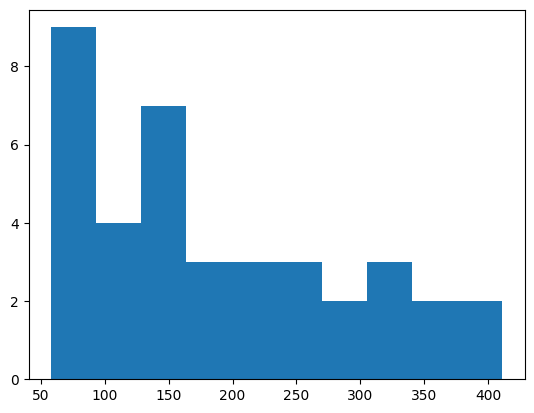

In [121]:
plt.hist(good_units_saved['num_good_units'])

### Plot example recording

In [ ]:
def get_trial_data(eid, one, event, var):
    # ---------------------------------------------------
    # Load trial data
    sl = SessionLoader(eid=eid, one=one)
    sl.load_trials()

    events = sl.trials[event]

    # If event == NaN, remove the trial from the analysis
    nan_index = np.where(np.isnan(events))[0]
    events = events.drop(index=nan_index).to_numpy()
    contrast_R = sl.trials.contrastRight.drop(index=nan_index).to_numpy()
    contrast_L = sl.trials.contrastLeft.drop(index=nan_index).to_numpy()
    choice = sl.trials.choice.drop(index=nan_index).to_numpy()
    block = sl.trials.probabilityLeft.drop(index=nan_index).to_numpy()
    side = np.copy(contrast_R)
    side[np.isnan(side)] = -1  # Left side
    side[np.isnan(contrast_L)] = 1 # Right side

    # Find "trials" that go in one direction and the other direction
    # Note: This is not a pure indexing on the *task trials* as we removed trials with nan values previously
    if var == 'side':
        indx_a = np.where(side == -1)[0]
        indx_b = np.where(side == 1)[0]
    elif var == 'choice':
        indx_a = np.where(choice == -1)[0]
        indx_b = np.where(choice == 1)[0]
    if var == 'feedback':
        indx_a = np.where(choice != side)[0]
        indx_b = np.where(choice == side)[0]

    return events, indx_a, indx_b


def plot_psths(stack_psth, area, var_name):

    # ---------------------------------------------------
    # Plot stacked PSTHs
    fig, ax = plt.subplots(2, figsize=[6, 6])
    # fig.set_size_inches(6.5, 5.5)
    
    ax[0].imshow(stack_psth[0, :, :], vmax=stack_psth.max(), vmin=stack_psth.min(), aspect='auto')
    ax[1].imshow(stack_psth[1, :, :], vmax=stack_psth.max(), vmin=stack_psth.min(), aspect='auto')
    ax[0].set_xlabel('')
    ax[1].set_xlabel('time bin')
    ax[0].set_ylabel(var_name + ' left')
    ax[1].set_ylabel(var_name + ' right')
    ax[0].set_title(area)

    ytick_loc = [0]
    ax[0].set_yticks(ytick_loc)
    ax[1].set_yticks(ytick_loc)
    ax[0].set_yticklabels(['unit #1'])
    ax[1].set_yticklabels(['unit #1'])
    plt.show()

def plot_psth_lines(stack_psth, area, var_name):

    # ---------------------------------------------------
    # Plot stacked PSTHs
    fig, ax = plt.subplots(1, figsize=[6, 4])
    # fig.set_size_inches(6.5, 5.5)
    
    ax.plot(np.nanmean(stack_psth[0, :, :], axis=0), color='blue', label=var_name)
    ax.plot(np.nanmean(stack_psth[0, :, :], 
                       axis=0)+np.nanstd(stack_psth[0, :, :], 
                                         axis=0)/np.sqrt(np.shape(stack_psth)[1]), 
                                         linewidth=.5, color='blue')
    ax.plot(np.nanmean(stack_psth[0, :, :],
                        axis=0)-np.nanstd(stack_psth[0, :, :], 
                                          axis=0)/np.sqrt(np.shape(stack_psth)[1]), 
                                          linewidth=.5, color='blue')
    ax.plot(np.nanmean(stack_psth[1, :, :], axis=0), color='orange', label=var_name)
    ax.plot(np.nanmean(stack_psth[1, :, :], 
                       axis=0)+np.nanstd(stack_psth[0, :, :], 
                                         axis=0)/np.sqrt(np.shape(stack_psth)[1]), 
                                         linewidth=.5, color='orange')
    ax.plot(np.nanmean(stack_psth[1, :, :],
                        axis=0)-np.nanstd(stack_psth[0, :, :], 
                                          axis=0)/np.sqrt(np.shape(stack_psth)[1]), 
                                          linewidth=.5, color='orange')
    max_a = np.nanmax(np.nanstd(stack_psth[0, :, :], 
                                          axis=0)/np.sqrt(np.shape(stack_psth)[1]))
    max_b = np.nanmax(np.nanstd(stack_psth[1, :, :], 
                                          axis=0)/np.sqrt(np.shape(stack_psth)[1]))
    max_data = np.max([np.max(np.nanmean(stack_psth[0, :, :],
                        axis=0)), np.max(np.nanmean(stack_psth[1, :, :],
                        axis=0))])
    
    ax.set_xlabel('time bin')
    ax.set_title(area)
    if np.shape(stack_psth)[1] == 1:
        ax.set_ylim([0, max_data])
    else:
        ax.set_ylim([0, max_data+np.max([max_a, max_b])])
    plt.show()


['root' 'SPVC' 'SPVC' 'SPVC' 'SPVC' 'SPVC' 'SPVC' 'SPVI' 'SPVI' 'SPVI'
 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI'
 'SPVI' 'root' 'void' 'root' 'root' 'root' 'root' 'PRM' 'PRM' 'PRM' 'PRM'
 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'root' 'root' 'ANcr2' 'SPVI' 'SPVI' 'SPVI'
 'SPVI' 'void' 'PRM' 'PRM']


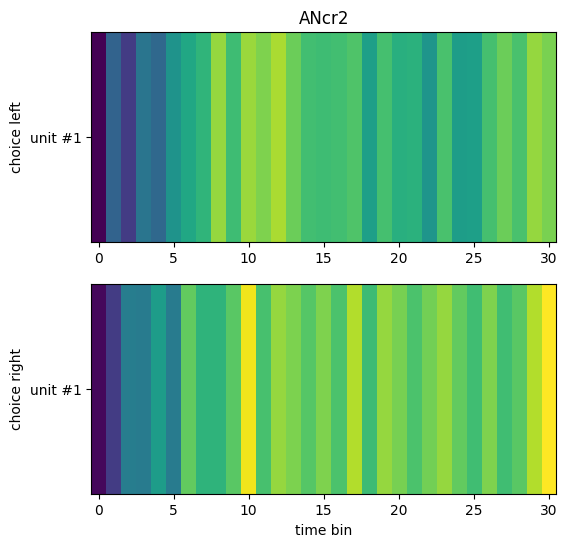

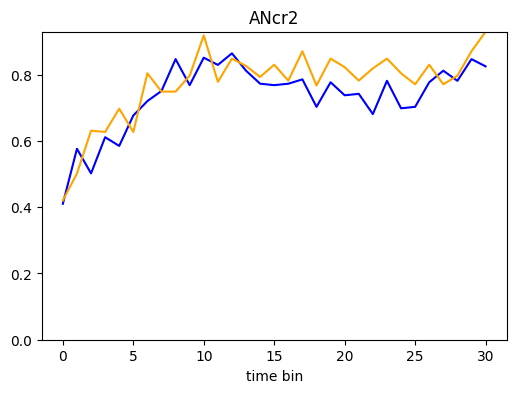

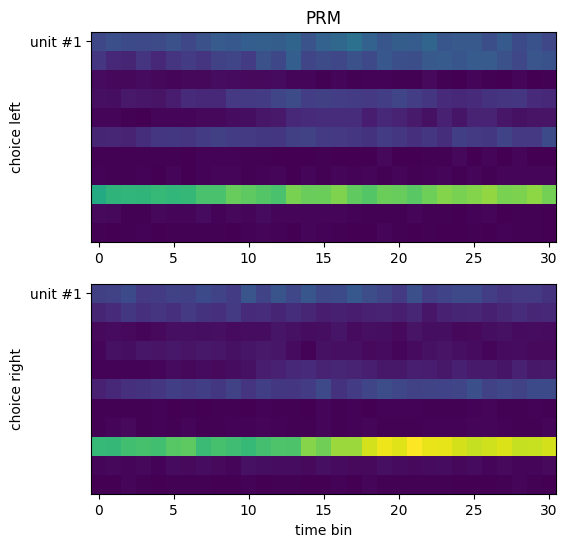

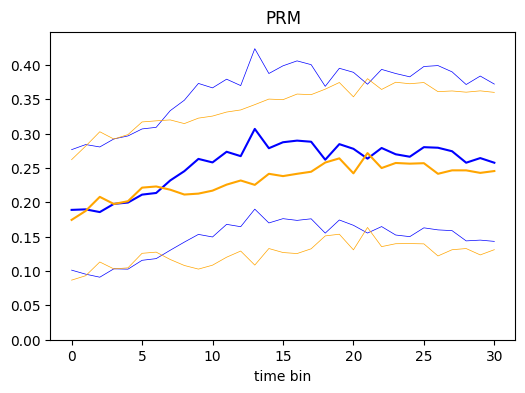

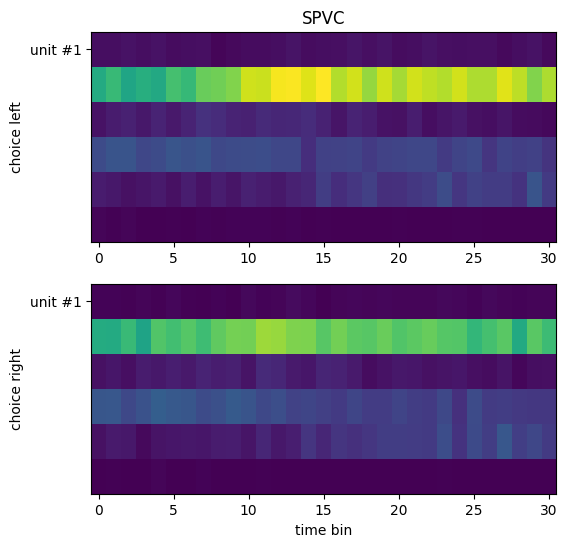

...

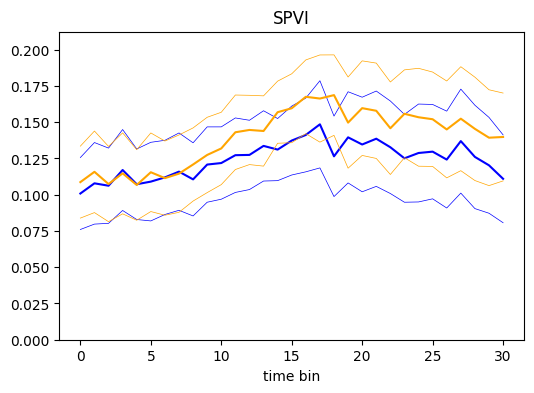

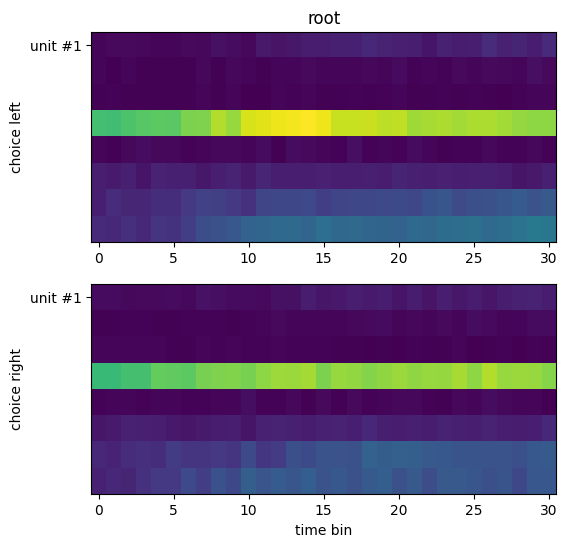

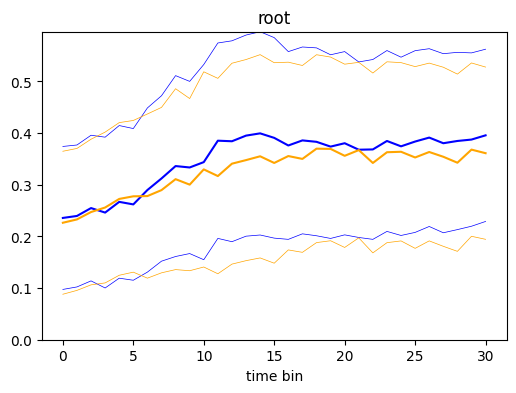

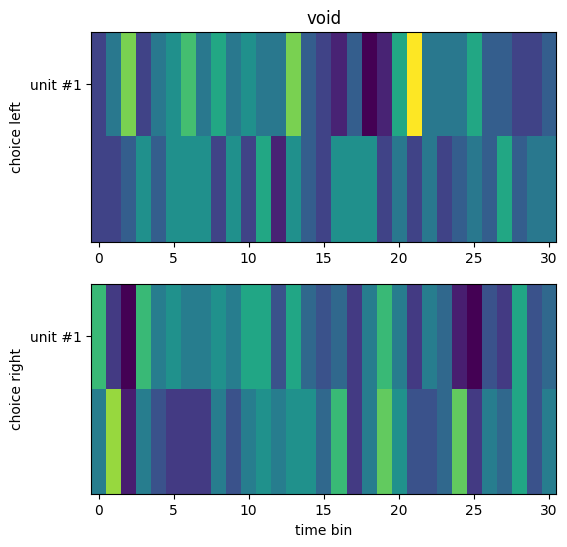

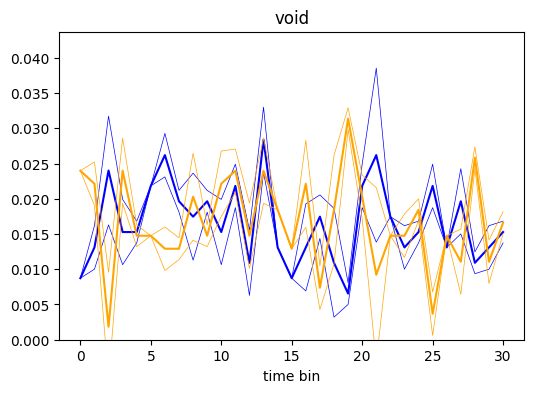

['RT' 'RT' 'RT' 'RT' 'RT' 'RT' 'RT' 'RT' 'RT' 'CP' 'SSp-ul' 'SSp-ul']


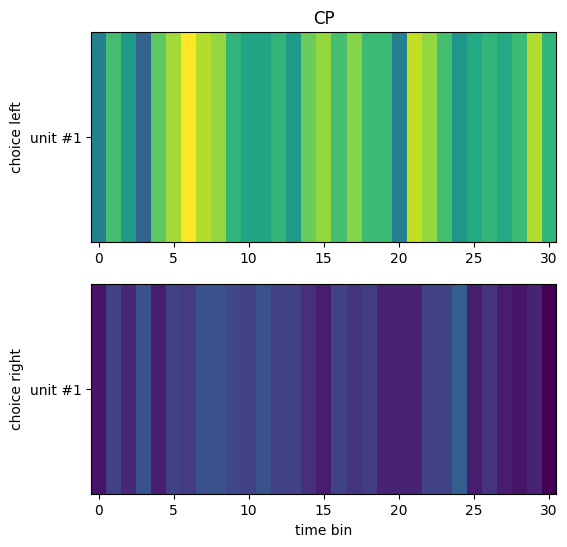

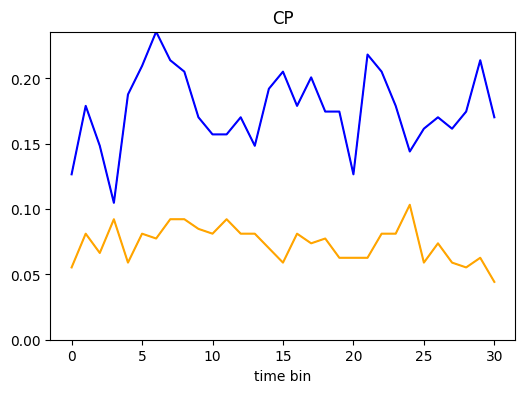

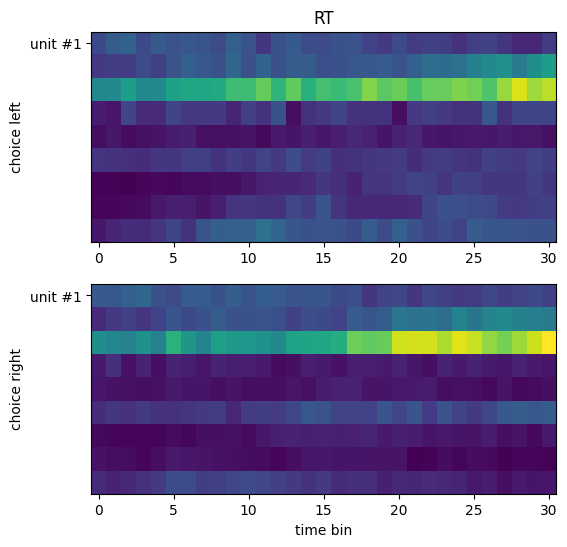

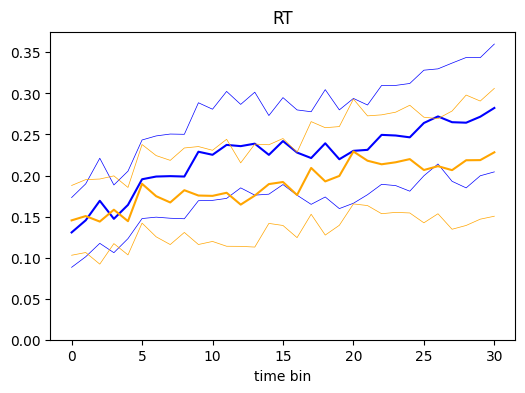

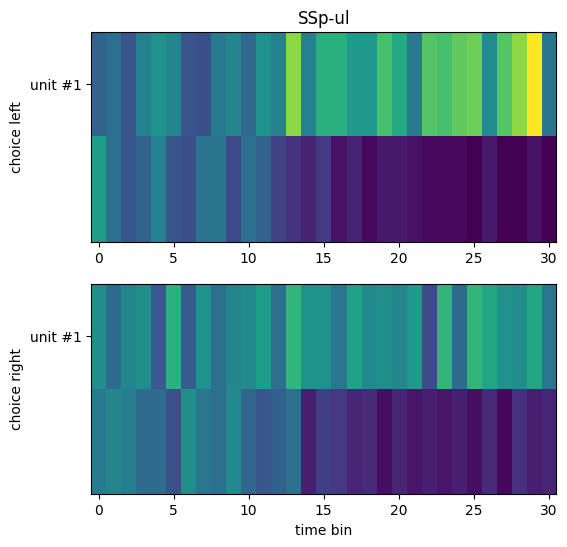

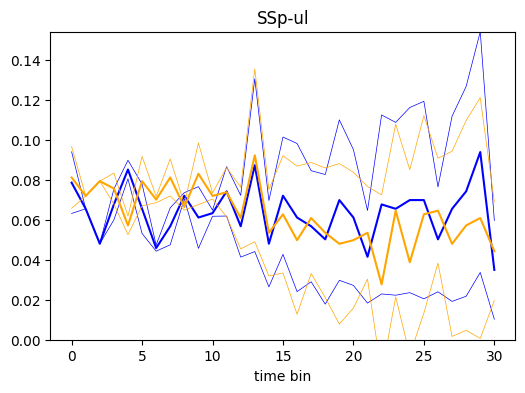

['VPM' 'VPM' 'VPM' 'VPM' 'VPM' 'VPM' 'VPM' 'VPM' 'VPM' 'VPM' 'VPM' 'VPM'
 'VPM' 'VPM' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'VPM' 'VPM' 'VPM' 'VPM' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'LD' 'PO' 'PO' 'LD' 'LD' 'LD' 'LD'
 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD'
 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD'
 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD'
 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD' 'LD

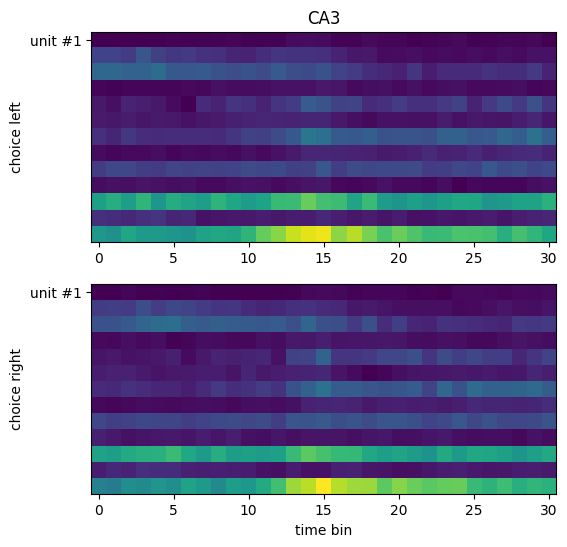

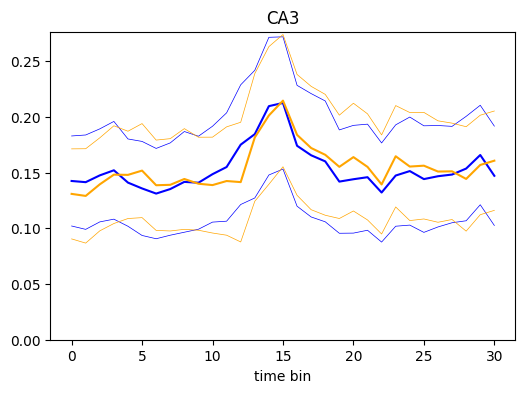

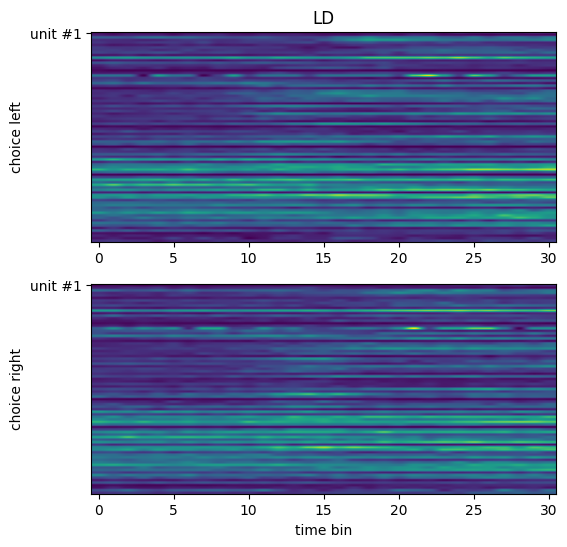

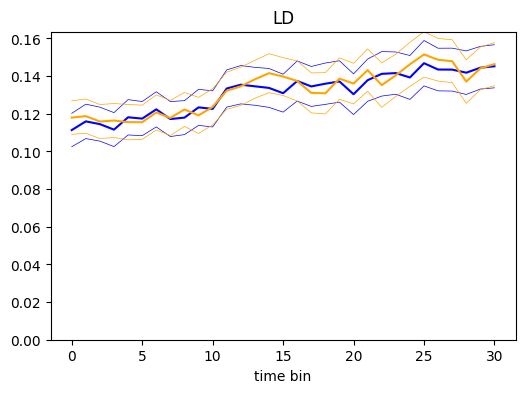

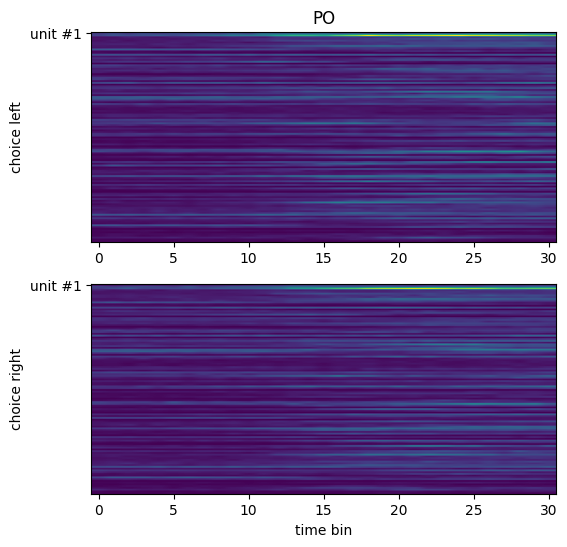

...

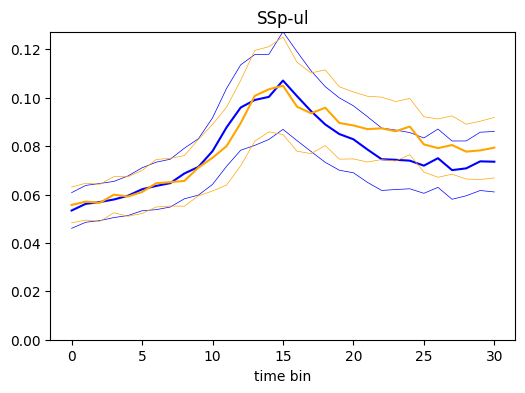

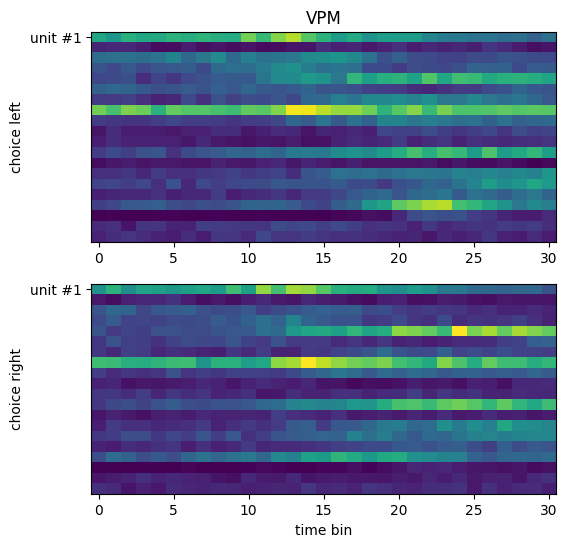

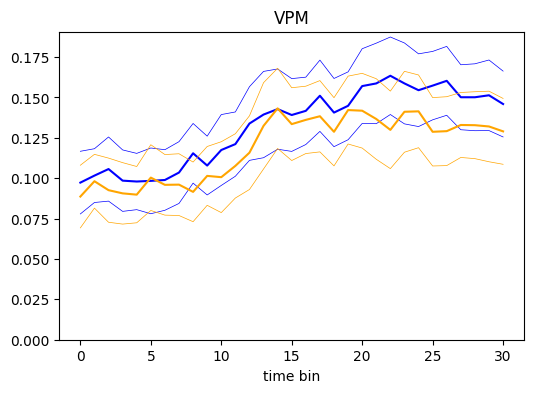

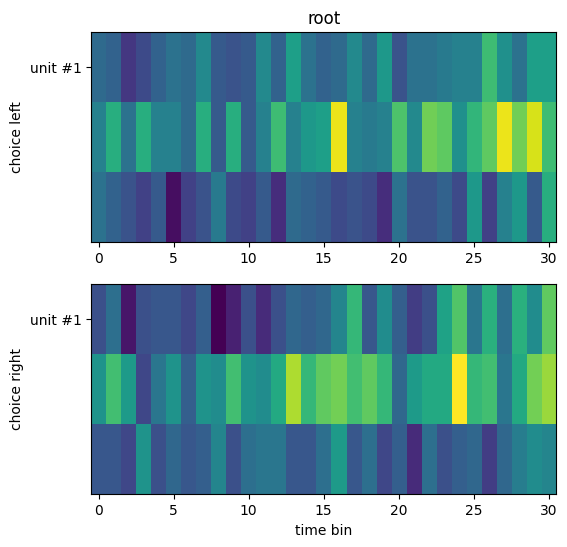

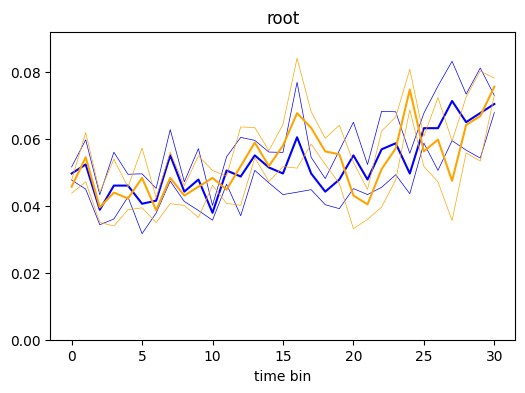

['root' 'root' 'root' 'root' 'root' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'root'
 'root' 'root' 'root' 'root' 'root' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'DT' 'DT' 'DT' 'DT' 'DT' 'root' 'DG' 'SUB' 'SUB' 'SUB' 'SUB' 'SUB' 'SUB'
 'ProS' 'ProS' 'ProS' 'ProS' 'ProS' 'ProS' 'ProS' 'ProS' 'ProS' 'ProS'
 'ProS' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'VISp' 'VISp'
 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp'
 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp'
 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'root'
 'MRN' 'ProS' 'ProS' 'root' 'root' 'root' 'VISp' 'VISp' 'VISp']


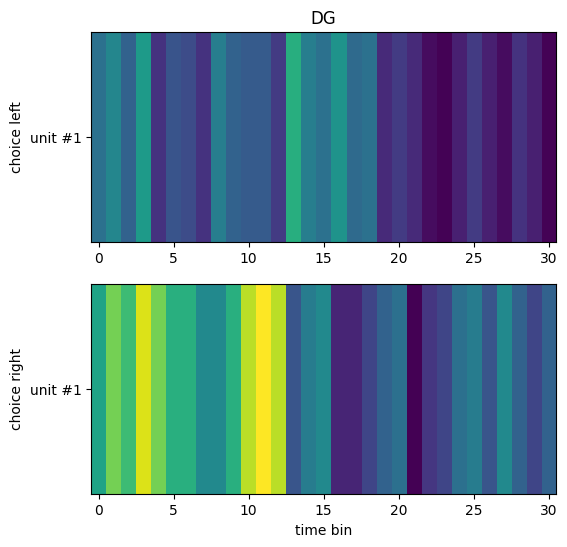

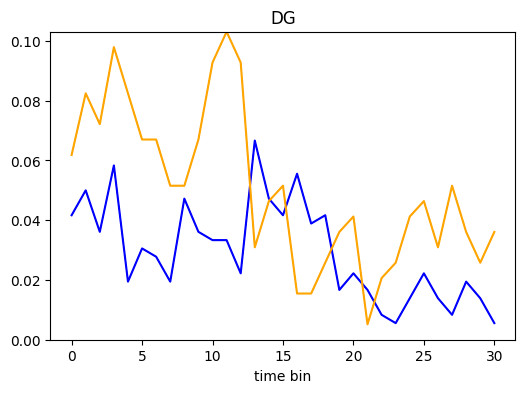

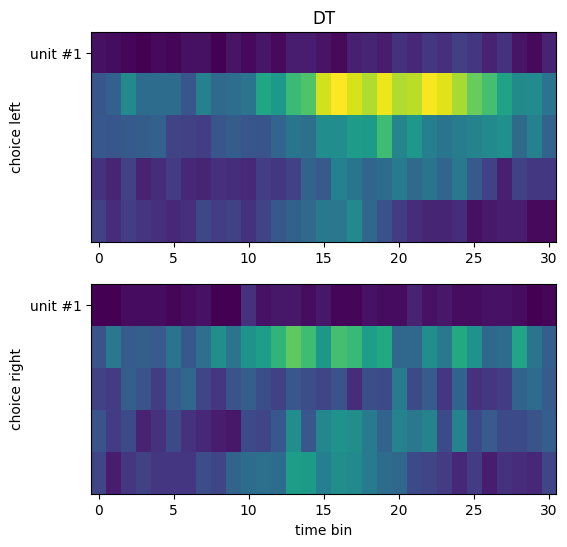

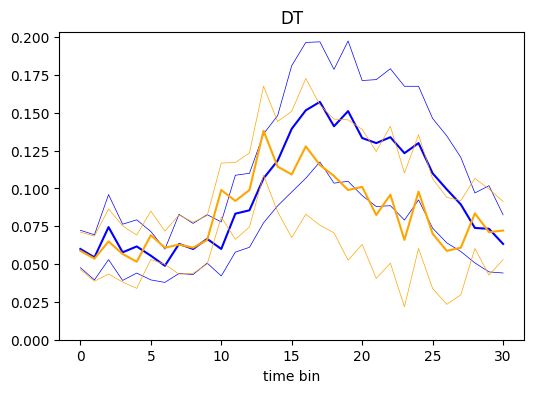

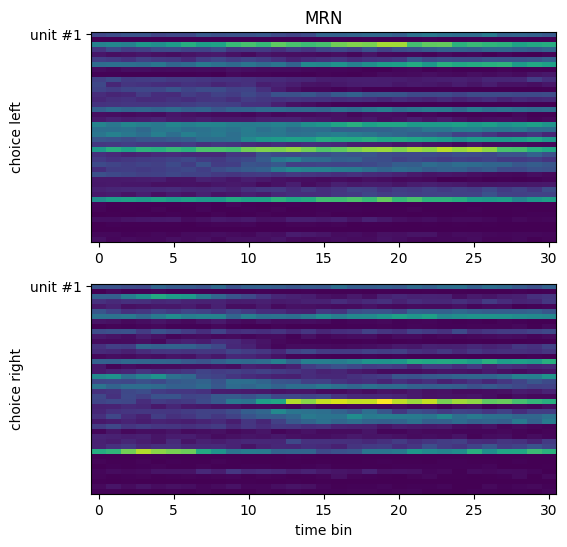

...

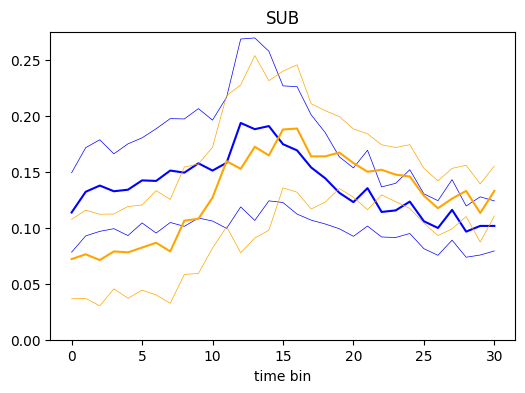

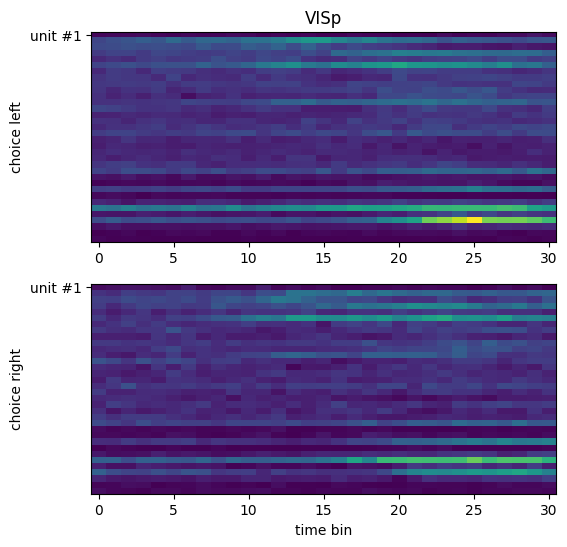

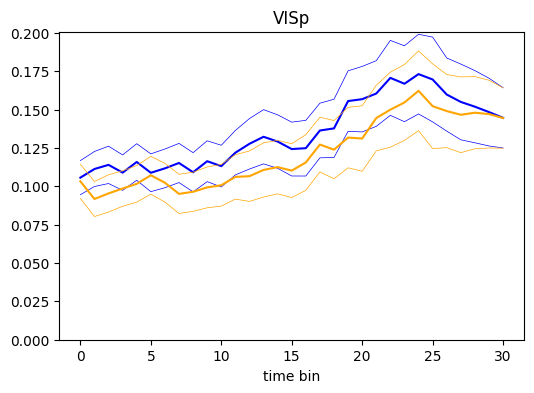

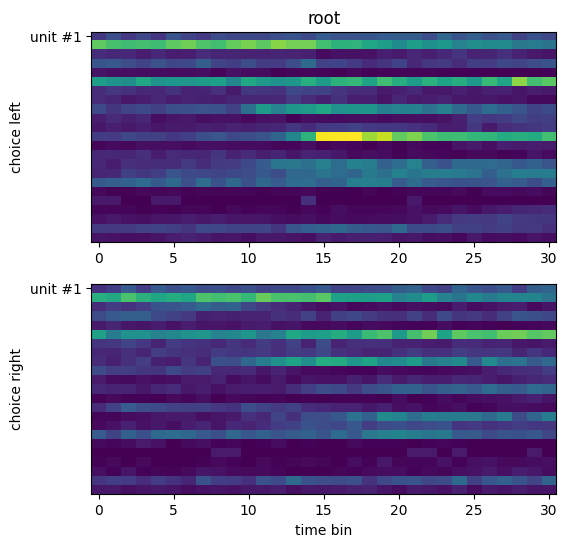

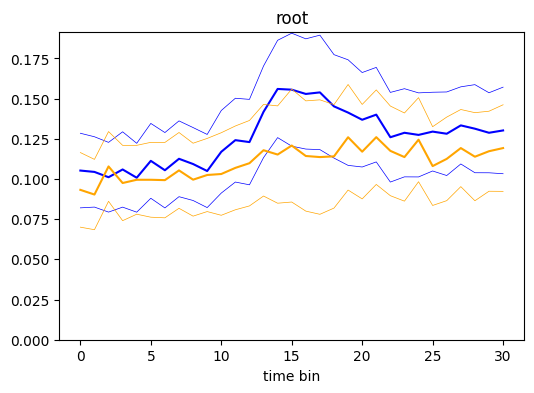

['PIR' 'PIR' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'SSp-m' 'SSp-m' 'SSp-m'
 'SSp-m' 'SSp-m' 'SSp-m' 'SSp-m' 'SSp-m' 'SSp-m' 'SSp-m' 'PIR' 'root'
 'root'

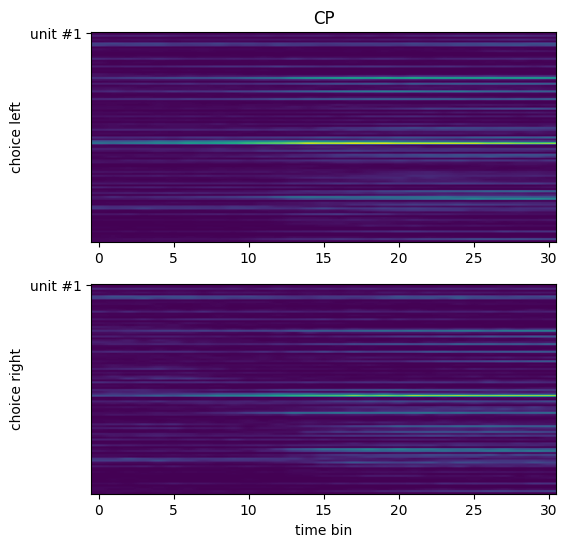

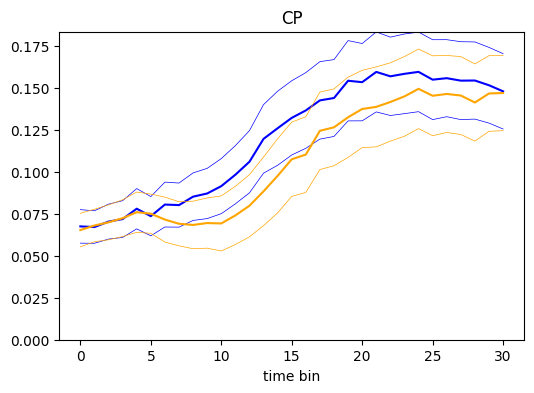

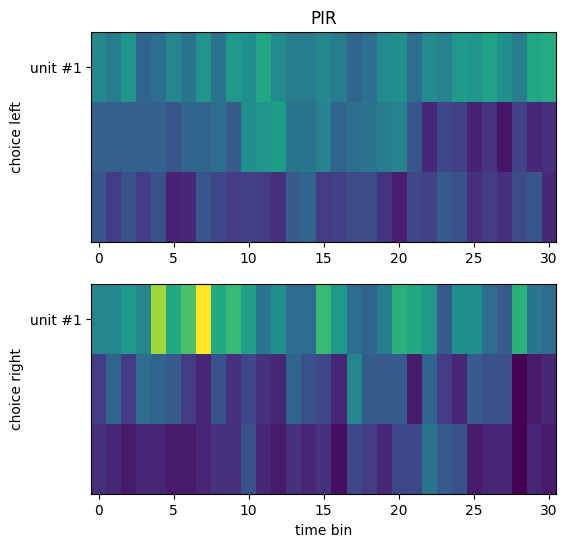

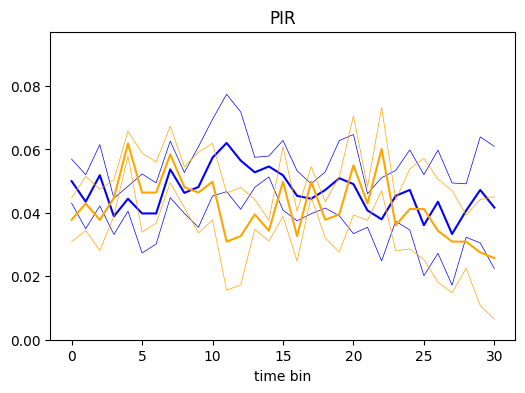

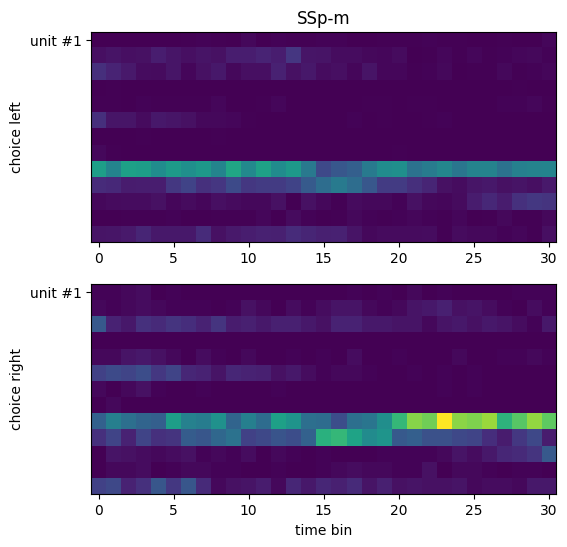

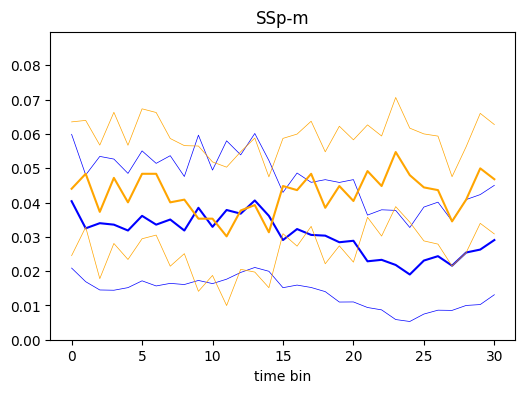

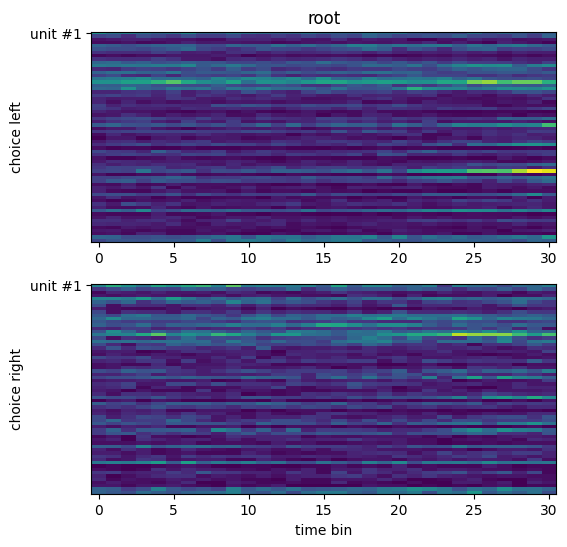

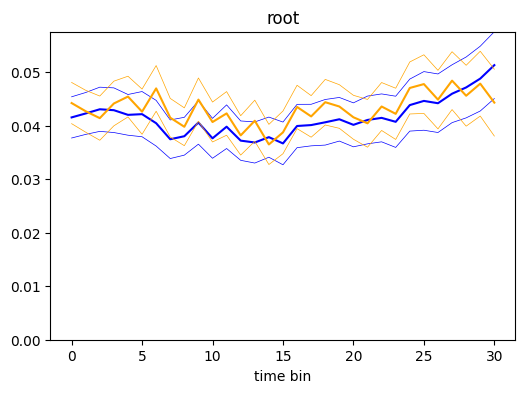

['PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr'
 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr'
 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'PRNr' 'root'
 'root' 'root' 'CS' 'CS' 'CS' 'CS' 'CS' 'CS' 'CS' 'CS' 'CS' 'CS' 'CS' 'CS'
 'CS' 'CS' 'CS' 'CS' 'CS' 'CS' 'CS' 'AT' 'AT' 'AT' 'AT' 'AT' 'AT' 'AT'
 'AT' 'AT' 'AT' 'AT' 'AT' 'AT' 'AT' 'AT' 'AT' 'AT' 'AT' 'AT' 'root' 'AT'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'DR' 'DR' 'DR' 'DR' 'DR' 'DR' 'DR' 'DR' 'DR' 'DR' 'DR' 'DR' 'DR' 'PAG'
 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG'
 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG'
 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'PRNr' 'PRNr' 'PRNr' 'AT'
 'root' 'SCm']


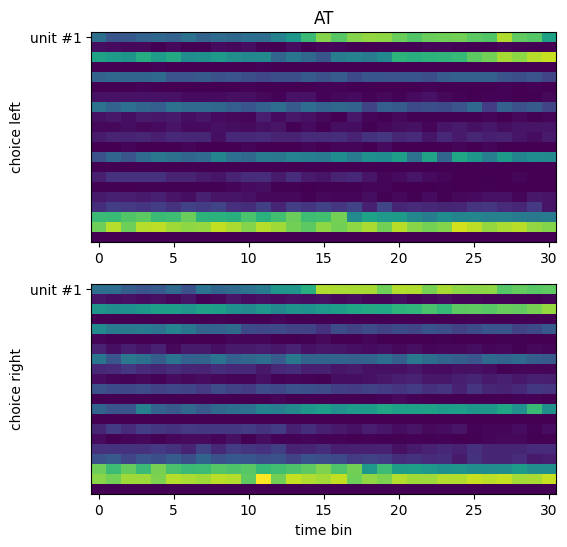

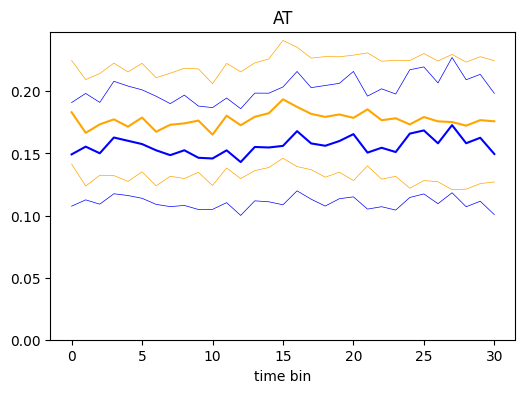

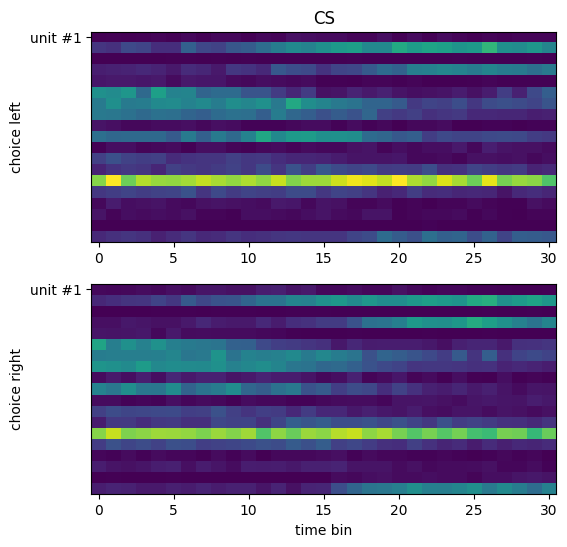

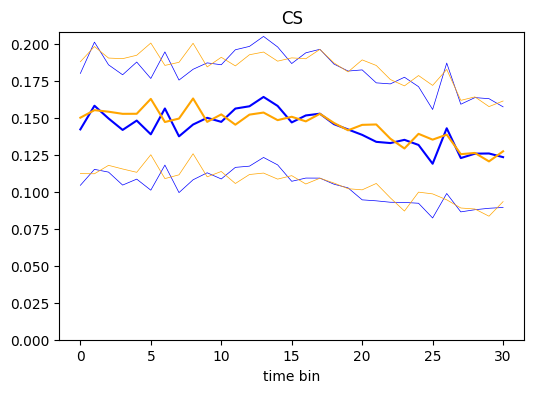

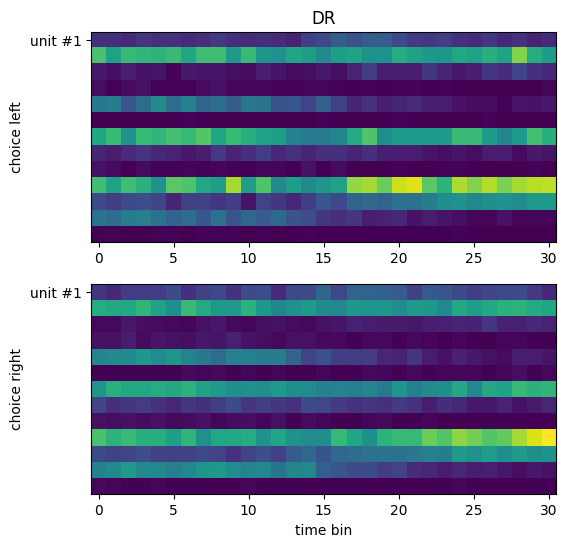

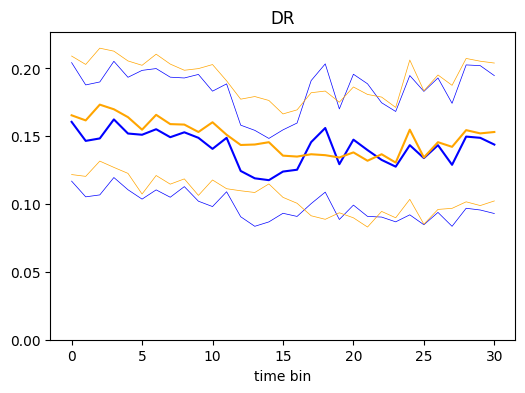

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/brainbox/task/trials.py:196: RuntimeWarning: Mean of empty slice
  mean = np.nanmean(raster, axis=0)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


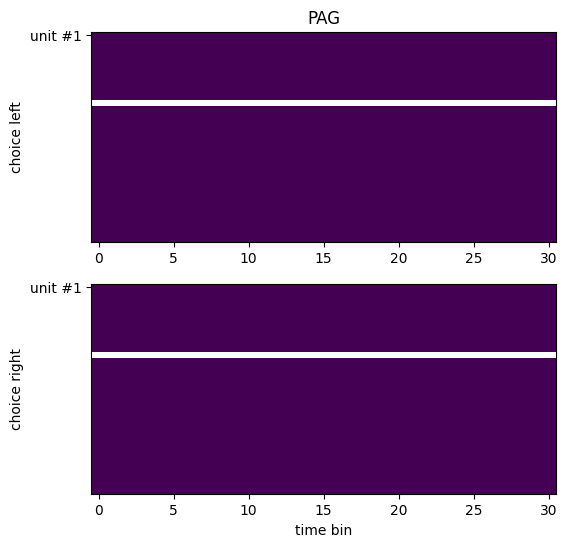

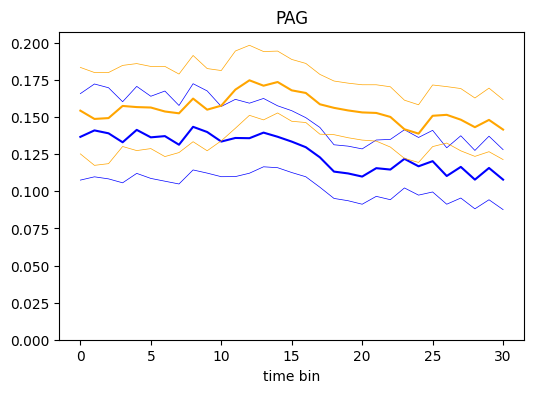

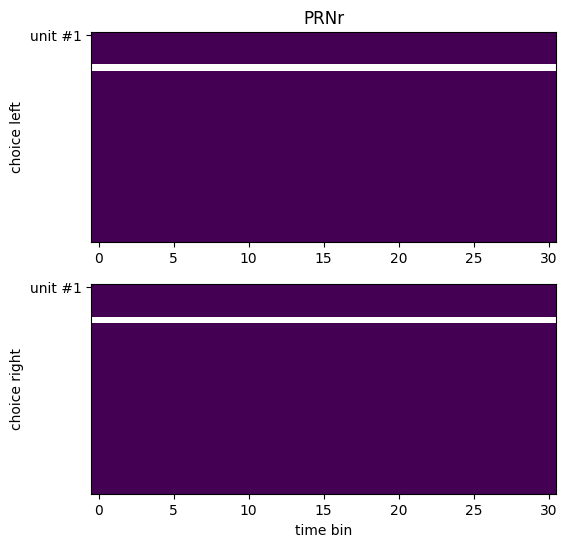

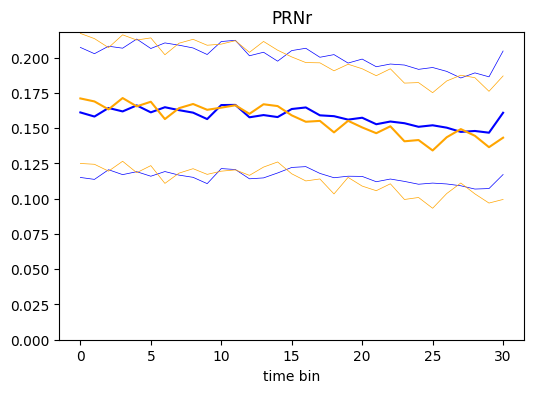

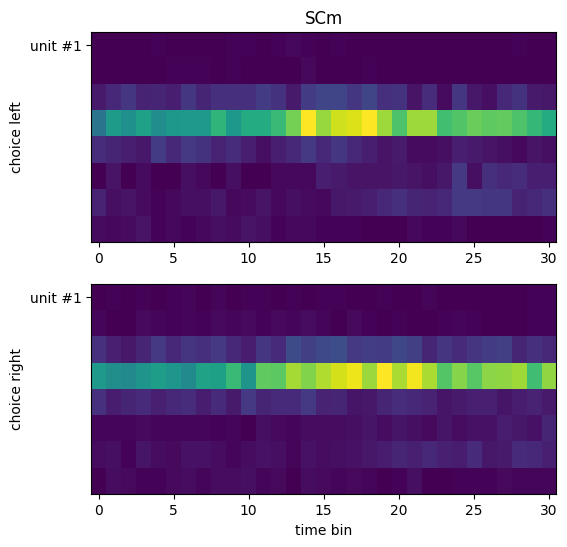

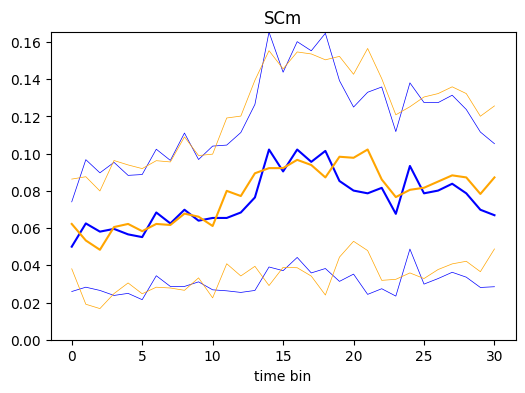

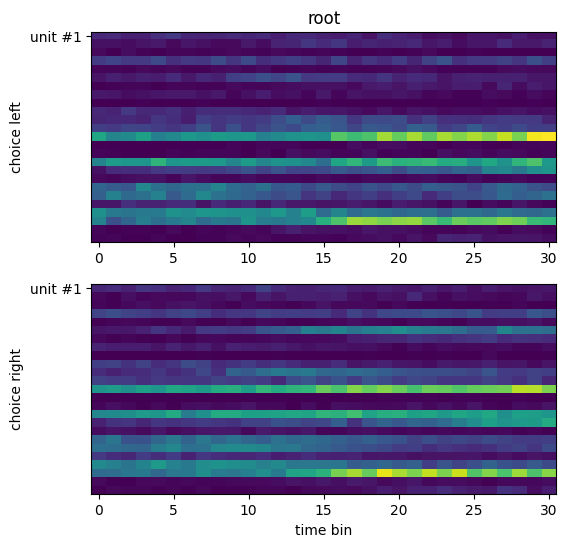

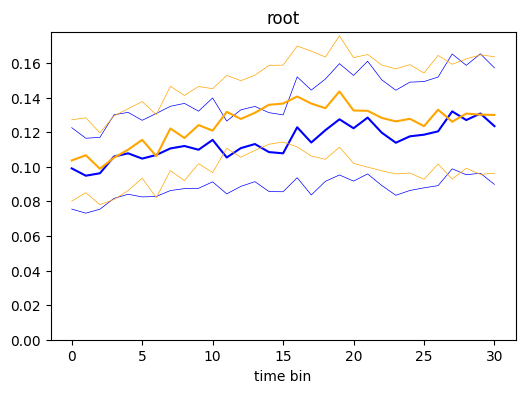

['MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'POL' 'root' 'root' 'root' 'root' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN'
 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN'
 'APN' 'APN' 'APN' 'APN' 'APN' 'POL' 'POL' 'POL' 'POL' 'POL' 'POL' 'POL'
 'POL' 'POL' 'POL' 'POL' 'POL' 'POL' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP'
 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP'
 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'root' 'DG' 'DG' 'DG' 'DG'
 'DG' 'DG' 'DG' 'DG' 'DG' 'DG' 'DG' 'DG' 'DG' 'CA1' 'CA1' 'CA1' 'CA1'
 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'root' 'root' 'root'
 'root' 'VISa' 'VISa' 'VISa' 'VISa' 'VISa' 'VISa' 'VISa' 'VISa' 'VISa'
 'VISa' 'VISa' 'VISa' 'VISa' 'VISa' 'VISa' 'VISa' 'VISa' 'VISa' 'VISa'
 'VISa' 'VISa' 'VISa' 'VISa' 'MRN' 'MRN' 'POL' 'POL' 'LP' 'LP' 'LP' 'LP'
 'LP' 'LP' 'LP' 'LP' 'LP' 'VISa' 'VISa' 'VISa' 'VISa' 'VISa' 'VISa']


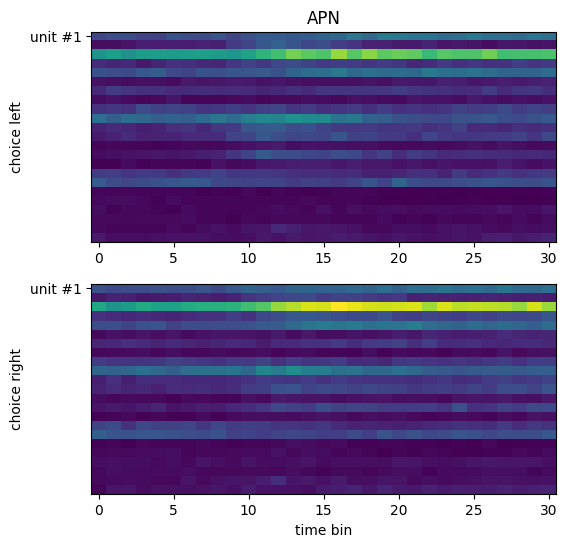

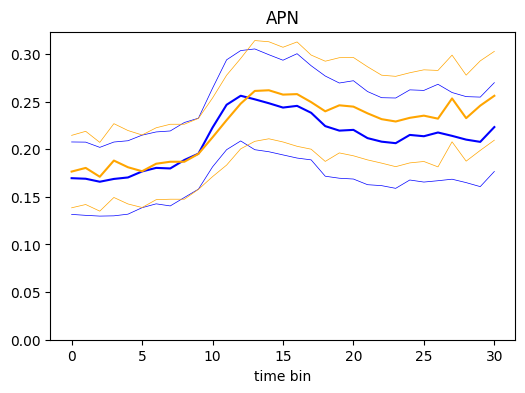

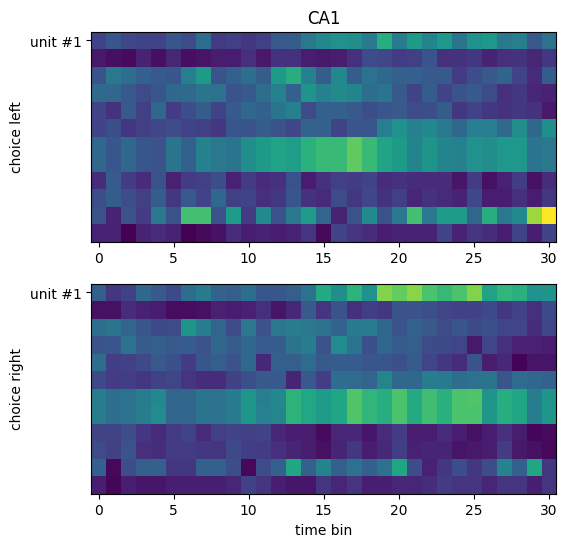

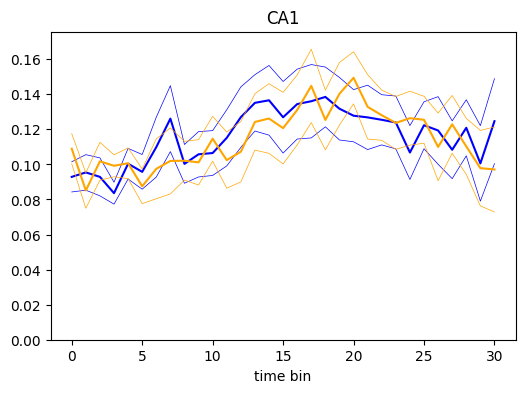

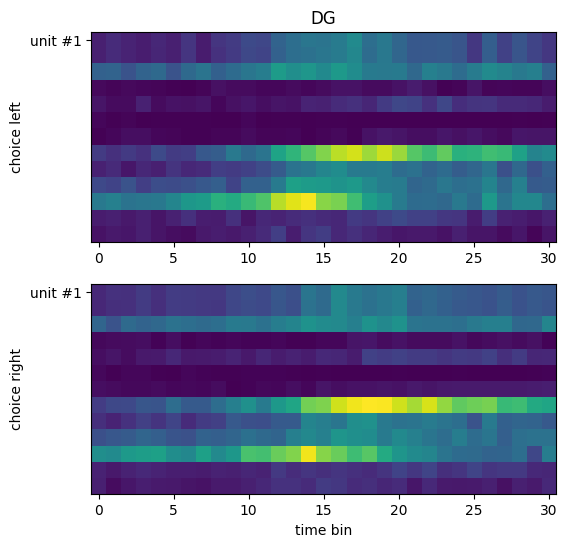

...

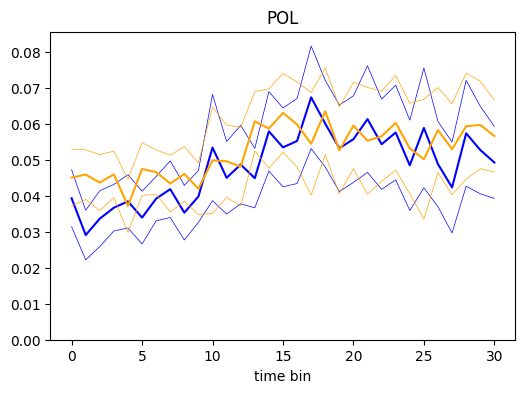

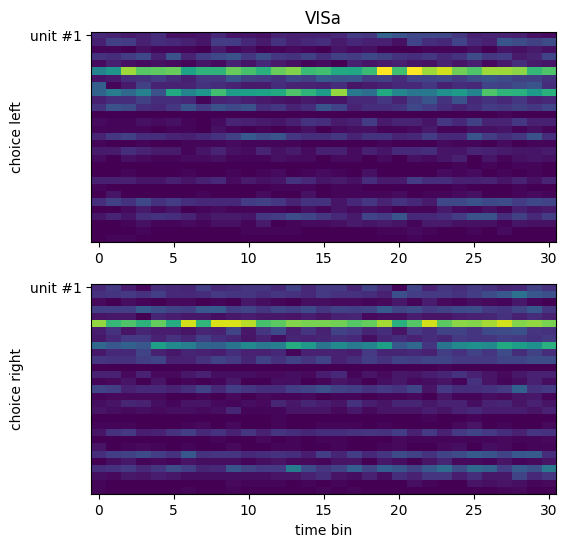

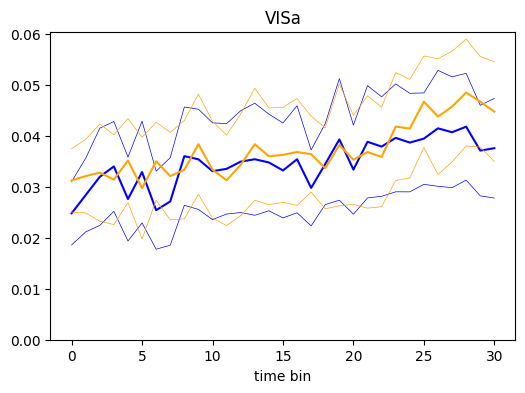

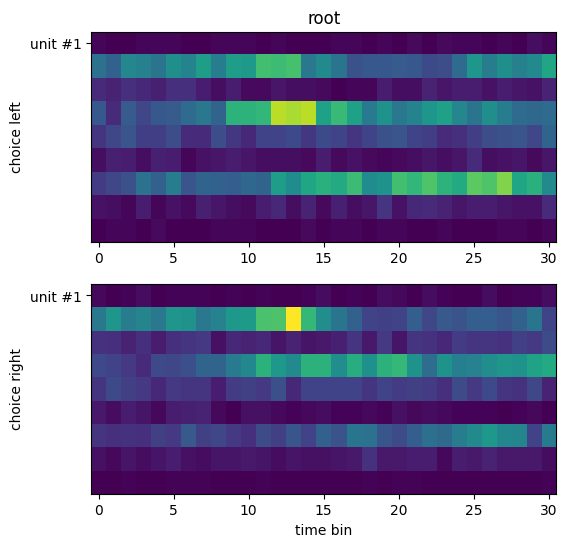

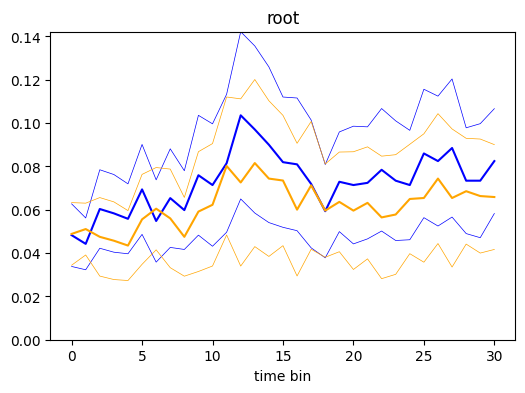

['MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN'
 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN'
 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN'
 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'root' 'root' 'DG' 'DG' 'DG' 'CA1'
 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'VISam' 'VISam' 'VISam' 'VISam'
 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam'
 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam'
 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam'
 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam'
 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam'
 'VISam' 'VISam' 'VISam' 'void' 'void' 'void' 'APN' 'APN' 'CA1' 'CA1'
 'CA1' 'root' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'VIS

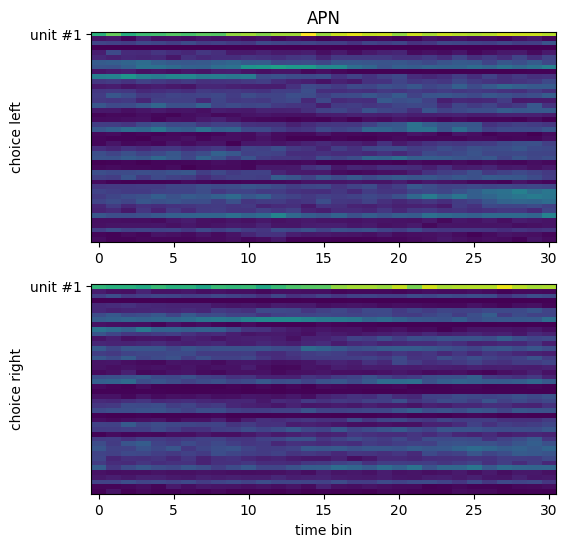

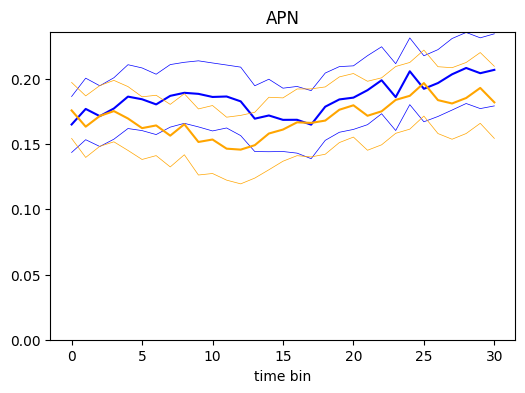

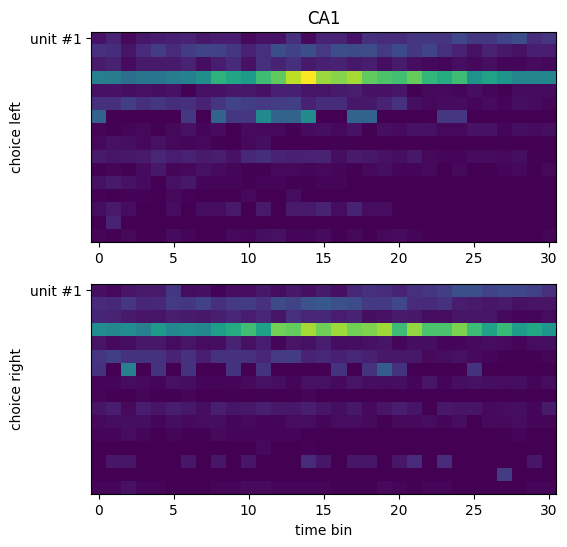

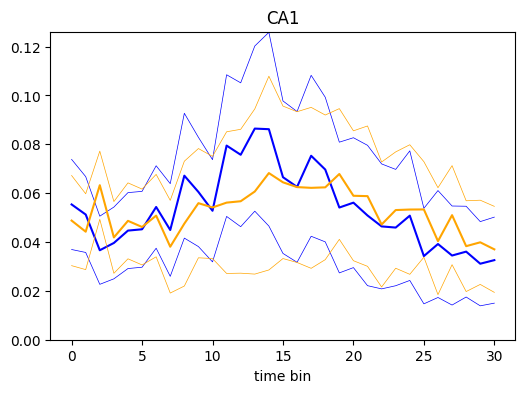

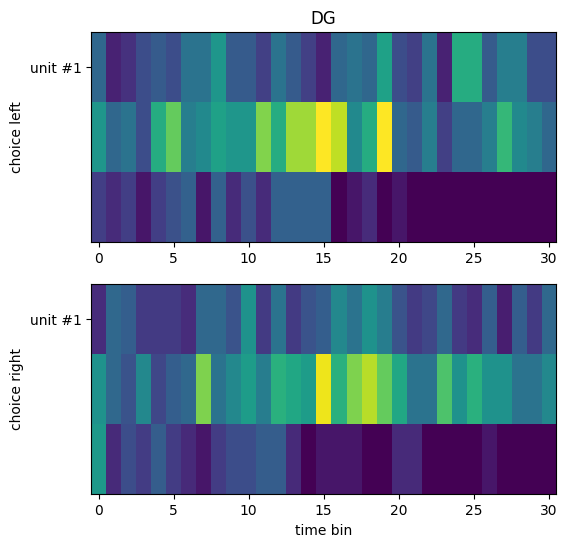

...

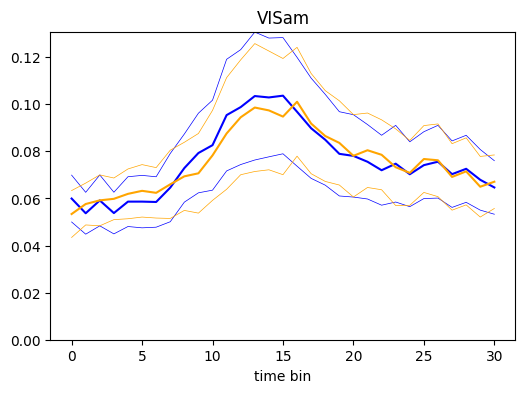

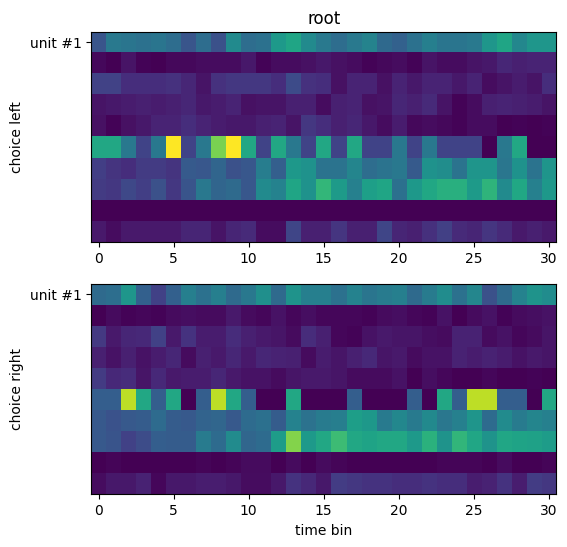

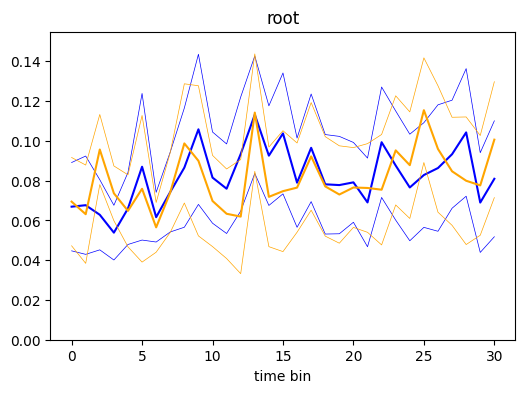

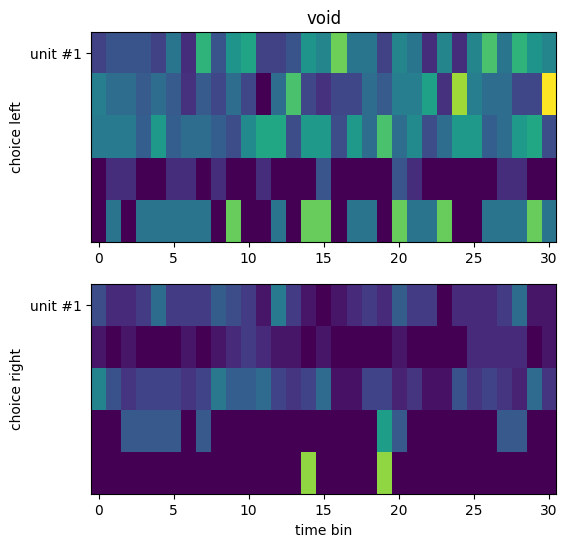

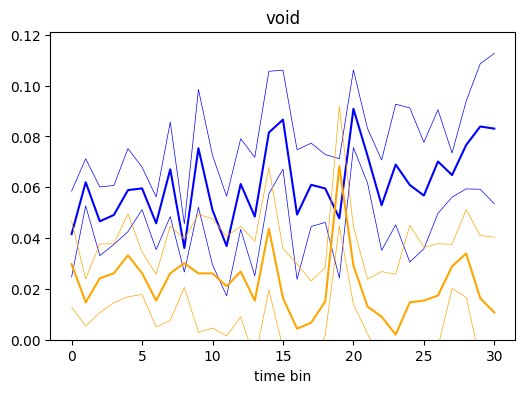

['GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN'
 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN'
 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'GRN' 'IRN' 'IRN' 'IRN'
 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN'
 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN'
 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'MV'
 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV'
 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV'
 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV'
 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV'
 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'PB' 'PB' 'root' 'PB' 'root' 'CENT3'
 'CENT3' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'CUN' 'CUN' 'GRN' 'MV' 'MV' 'MV' 'MV' 'MV' 'PB']


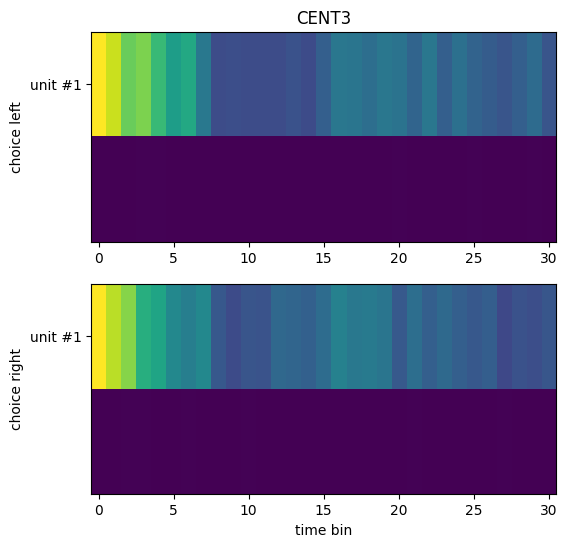

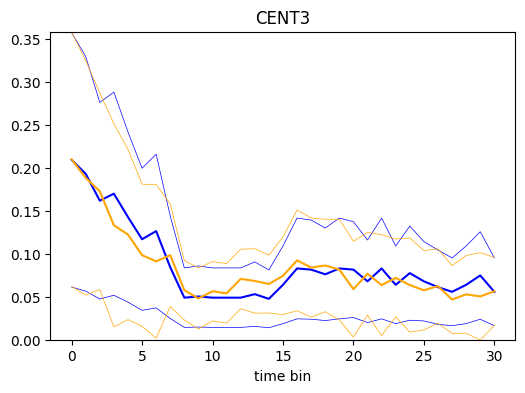

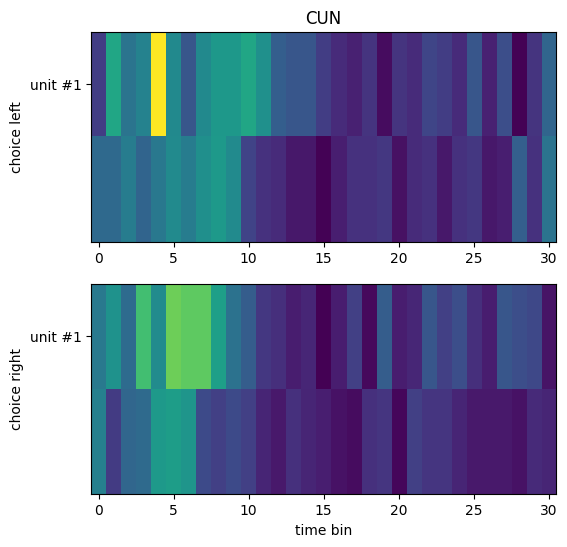

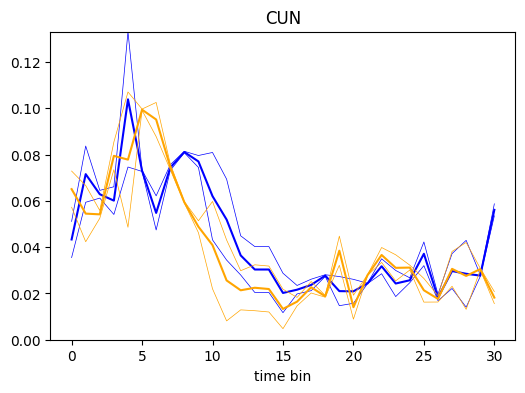

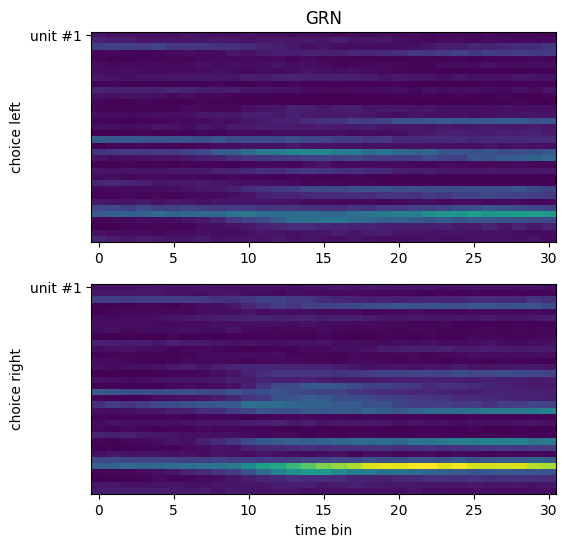

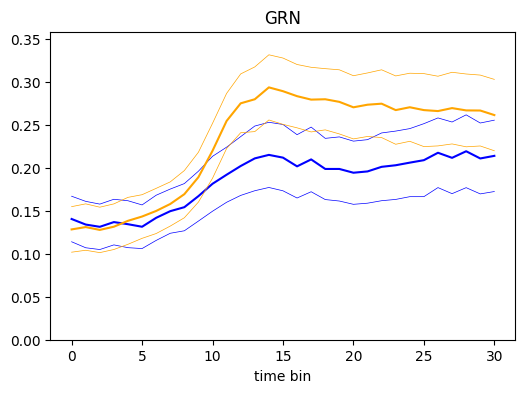

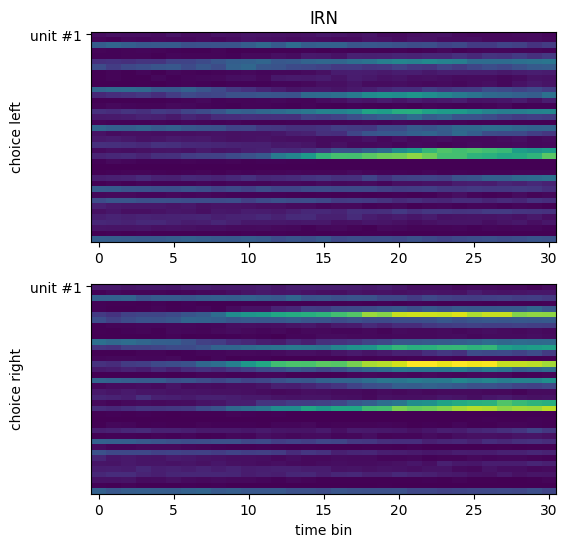

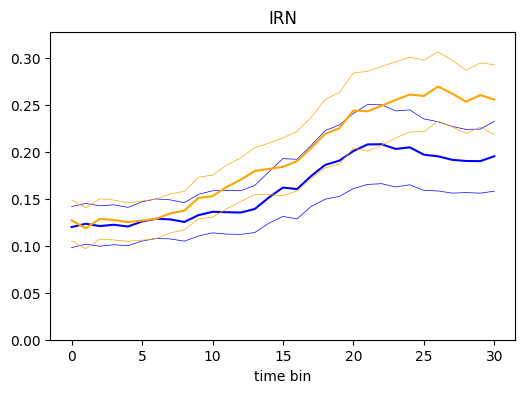

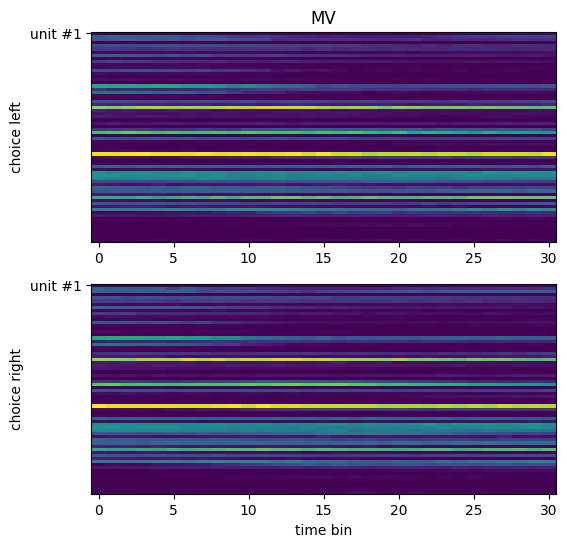

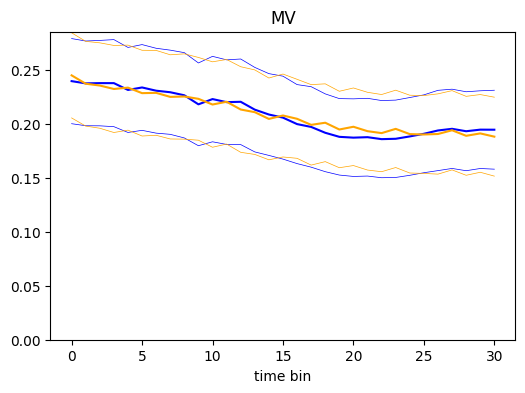

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/brainbox/task/trials.py:196: RuntimeWarning: Mean of empty slice
  mean = np.nanmean(raster, axis=0)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


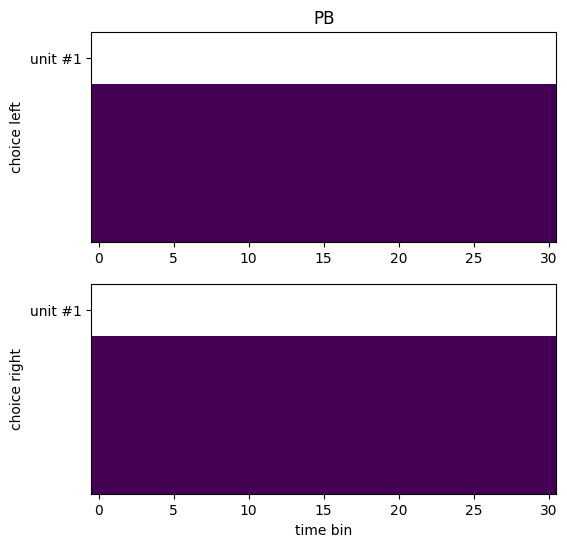

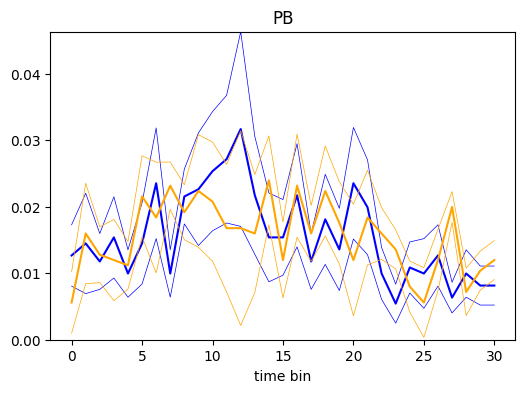

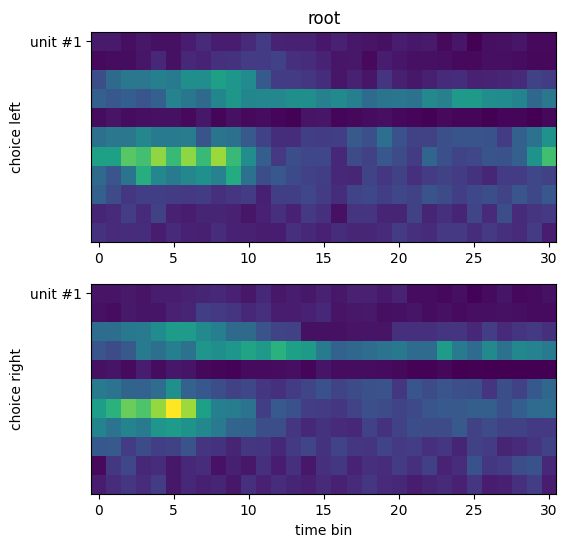

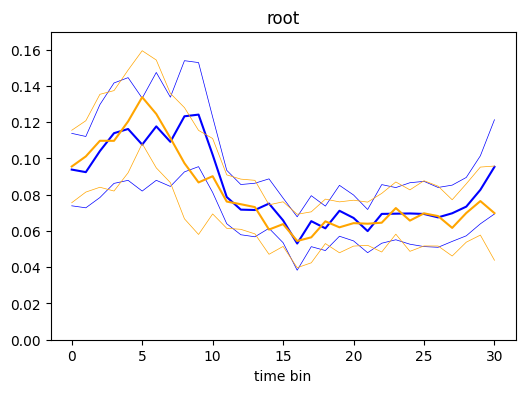

100%|██████████| 3/3.0 [00:03<00:00,  1.03s/it]
100%|██████████| 3/3.0 [00:02<00:00,  1.49it/s]
100%|██████████| 3/3.0 [00:02<00:00,  1.10it/s]


['MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'root' 'root'
 'root' 'root' 'root' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'root' 'root' 'root' 'root' 'root' 'root' 'POST' 'POST'
 'POST' 'POST' 'POST' 'POST' 'POST' 'POST' 'POST' 'POST' 'POST' 'POST'
 'POST' 'POST' 'POST' 'POST' 'POST' 'POST' 'POST' 'POST' '

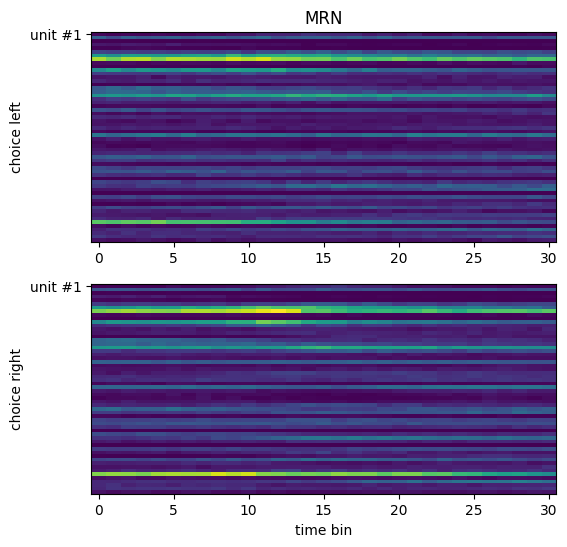

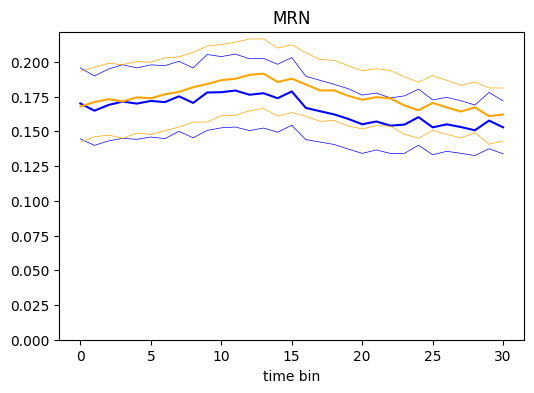

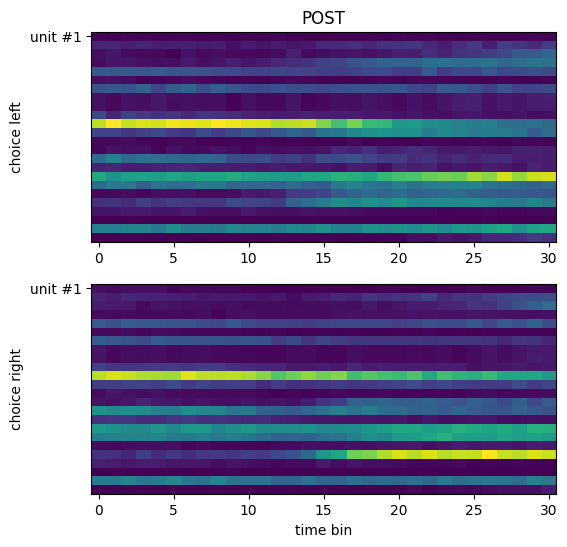

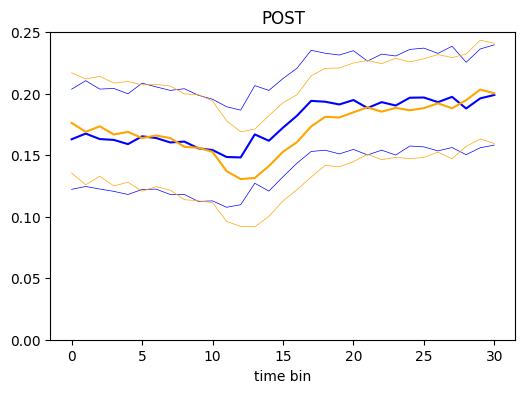

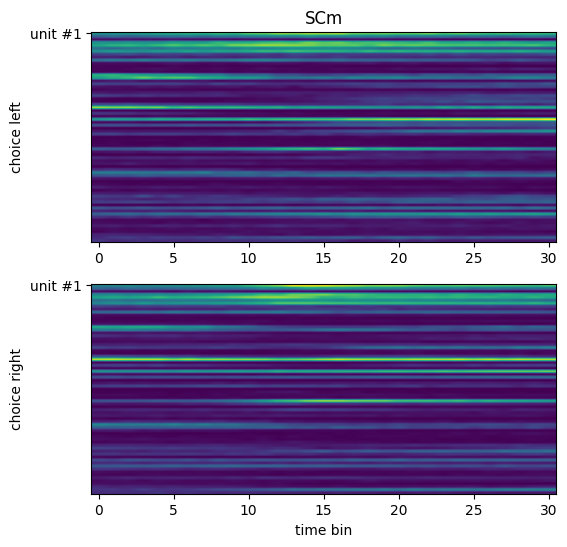

...

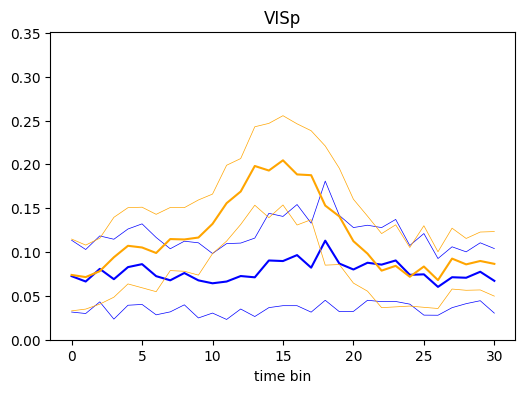

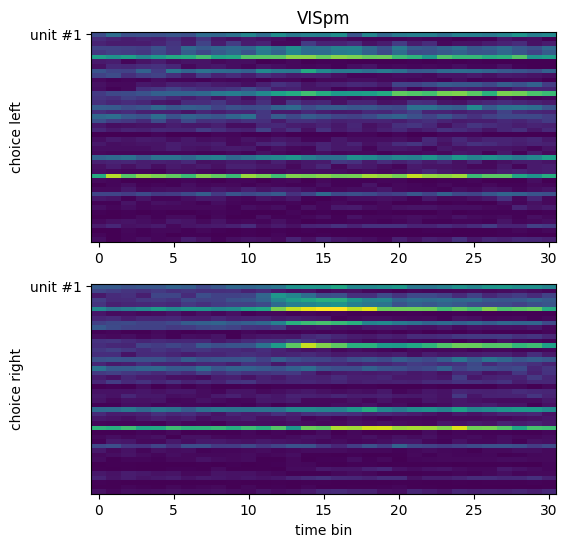

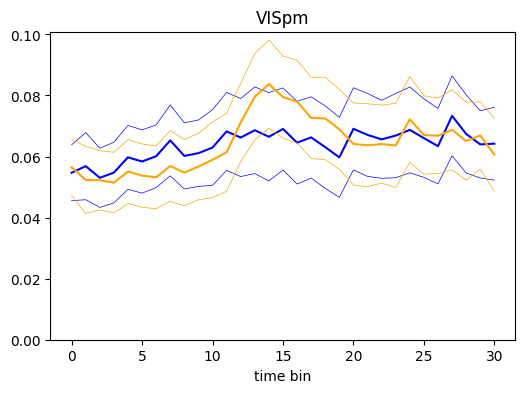

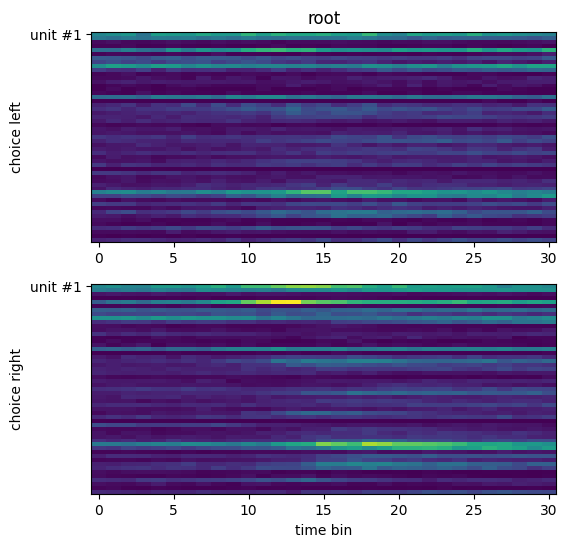

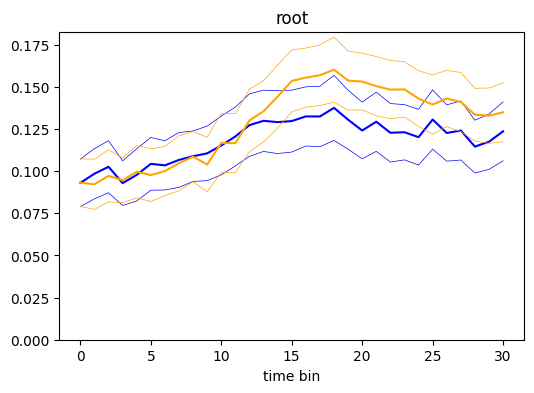

['VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM'
 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VM' 'VAL' 'VAL'
 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL'
 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'VAL' 'PO'
 'PO' 'PO' 'PO' 'LD' 'LD' 'VM' 'VAL']


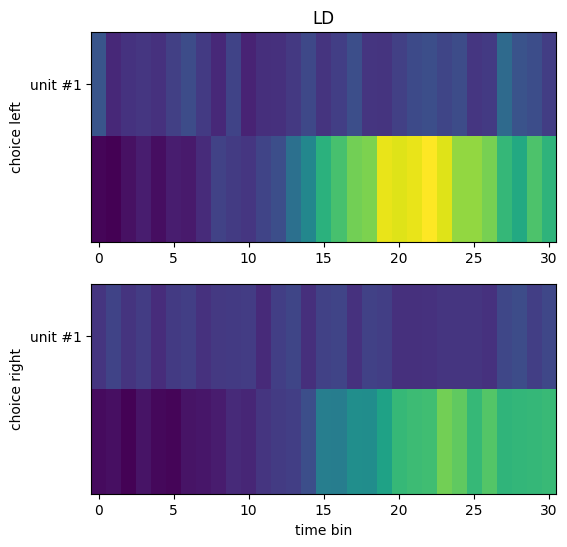

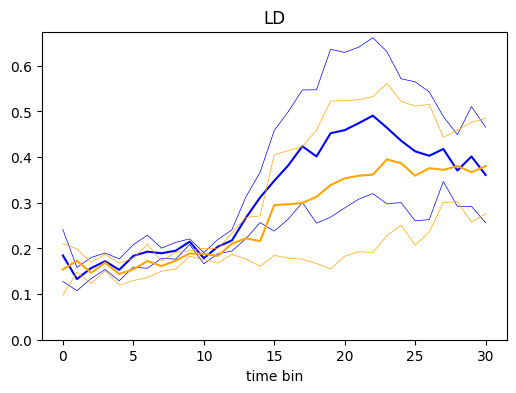

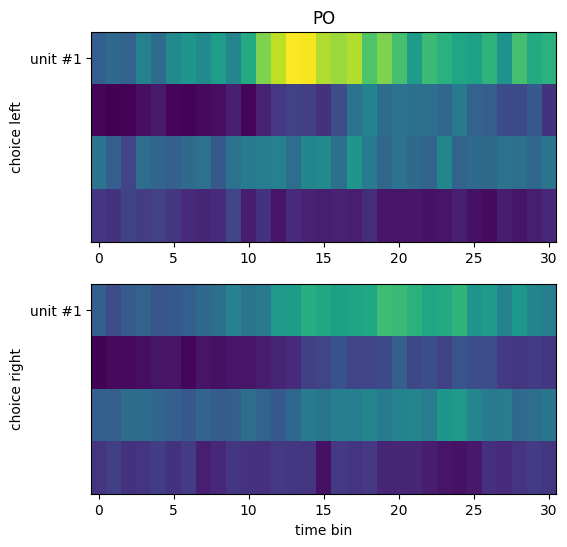

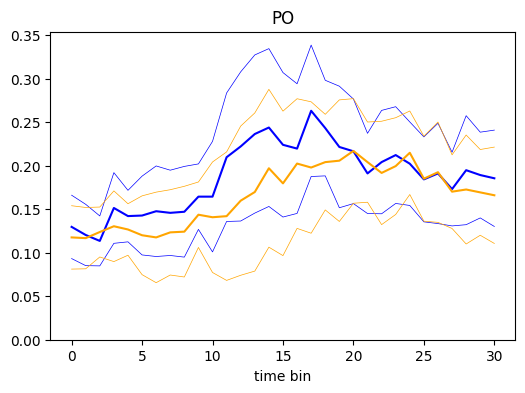

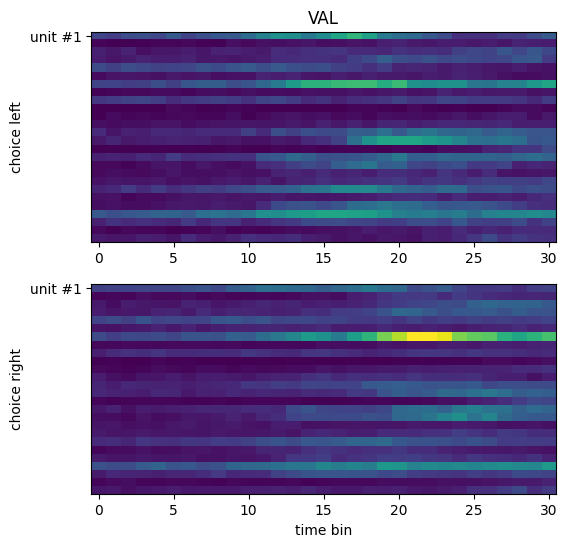

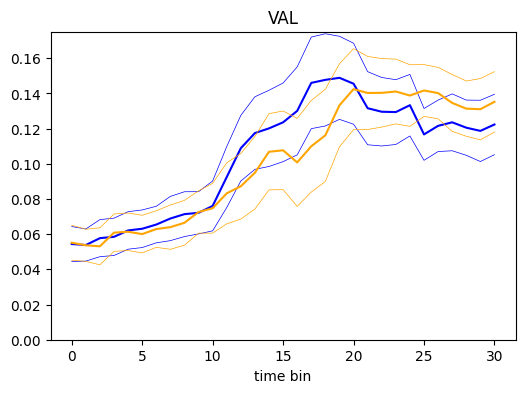

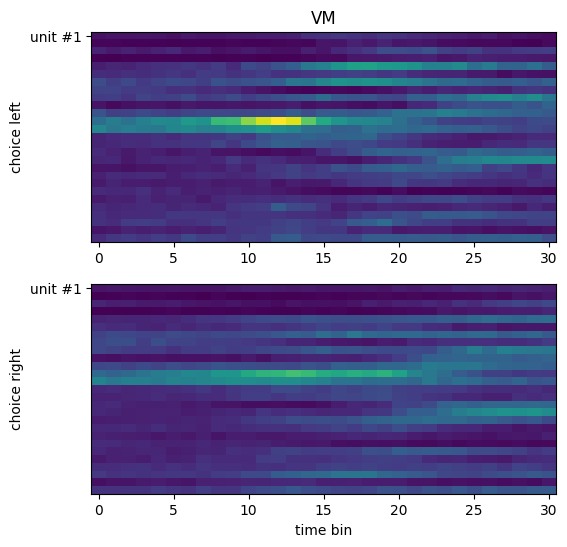

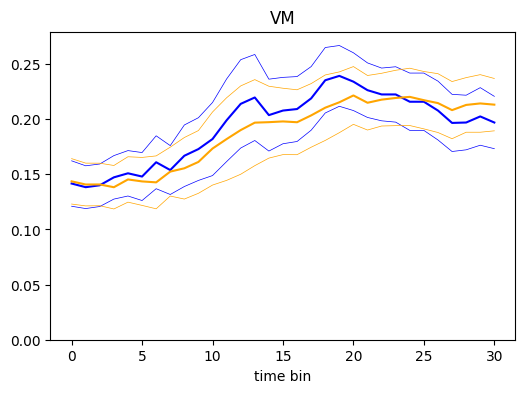

['PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'SCm' 'SCm' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'RSPv' 'RSPv'
 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv'
 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv'
 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv'
 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv'
 'RSPv' 'RSPv' 'RSPv' 'RSPd' 'RSPd' 'RSPd' 'RSPd' 'RSPd' 'RSPd' 'RSPd'
 'RSPd' 'RSPd' 'RSPd' 'RSPd' 'RSPd' 'RSPd' 'RSPd' 'RSPd' 'RSPd' 'RSPd'
 'RSPd' 'PAG' 'PAG' 'SCm' 'SCm' 'RSPv' 'RSPv' 'RSPv' 'RSPv']


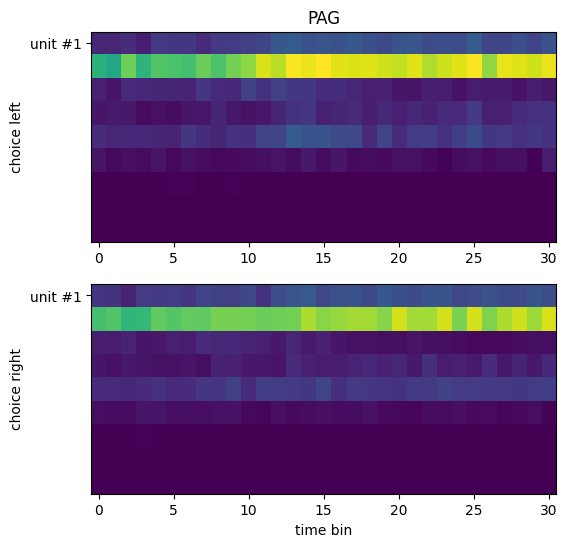

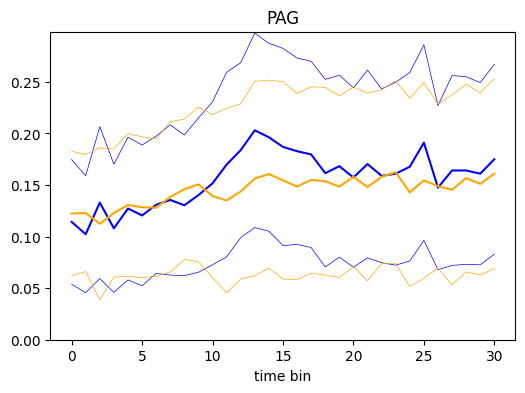

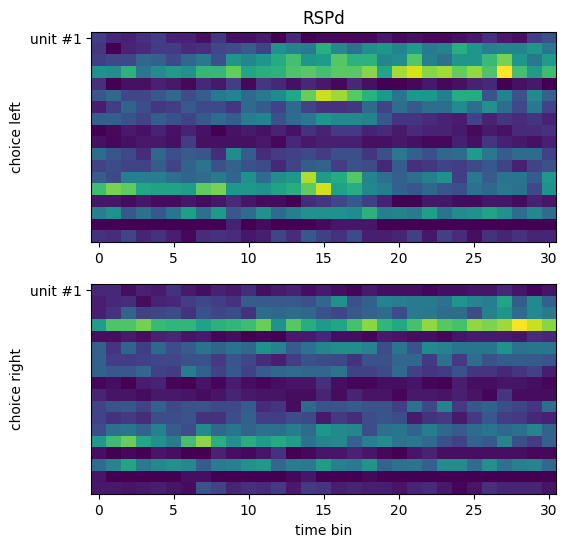

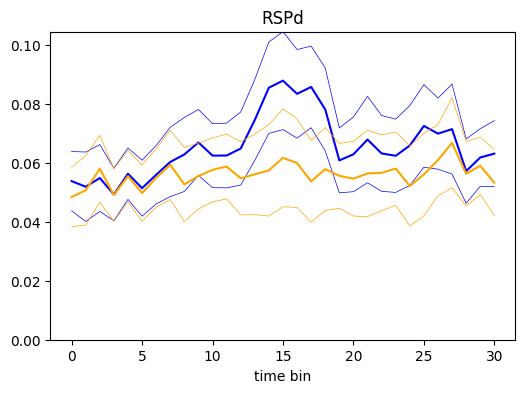

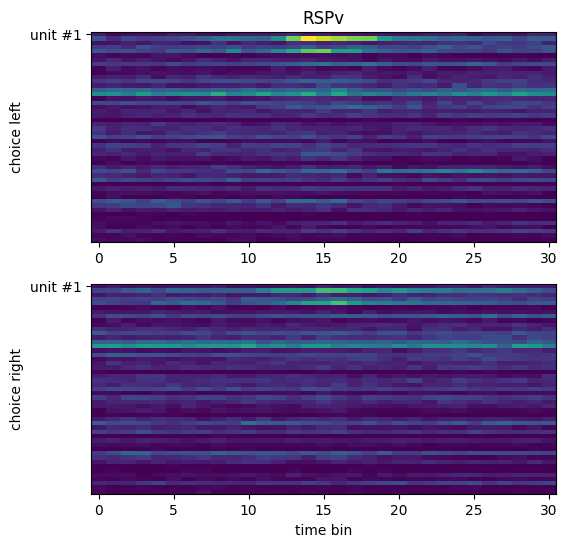

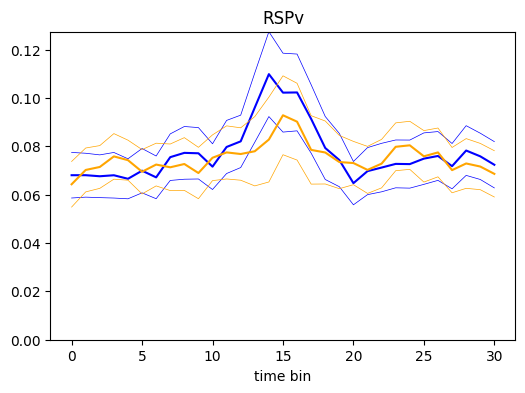

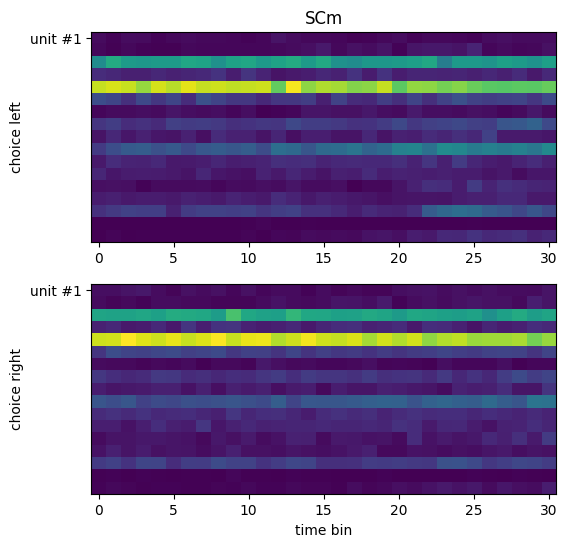

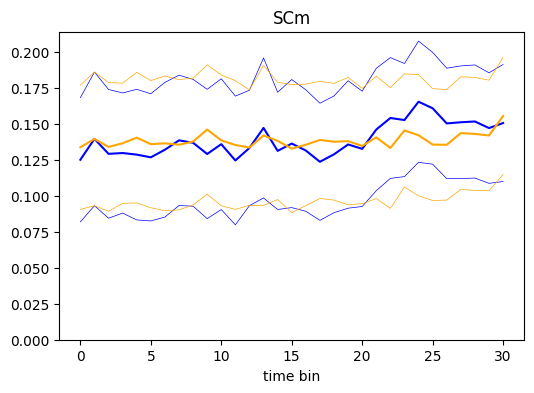

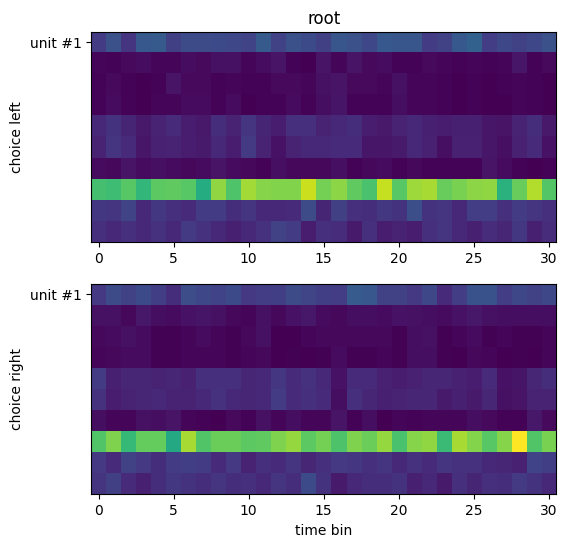

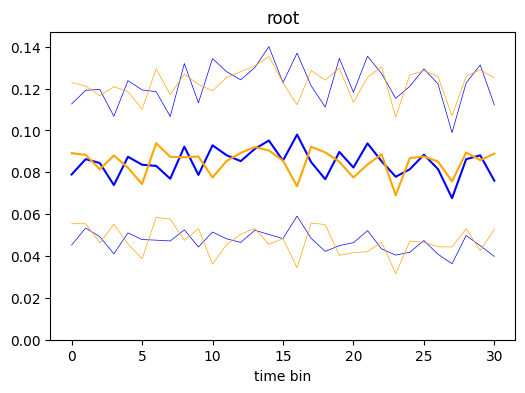

['void' 'void' 'void' 'void' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'PFL' 'PFL' 'PFL' 'PFL' 'PFL' 'PFL' 'PFL' 'PFL' 'PFL' 'PFL' 'PRM'
 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM'
 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM'
 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM' 'PRM'
 'PRM' 'PRM' 'PRM' 'PRM' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2'
 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2'
 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2' 'ANcr2' 'root'
 'root' 'PFL' 'PFL' 'PFL' 'PFL' 'PFL' 'PRM' 'PRM' 'PRM' 'root' 'ANcr2']


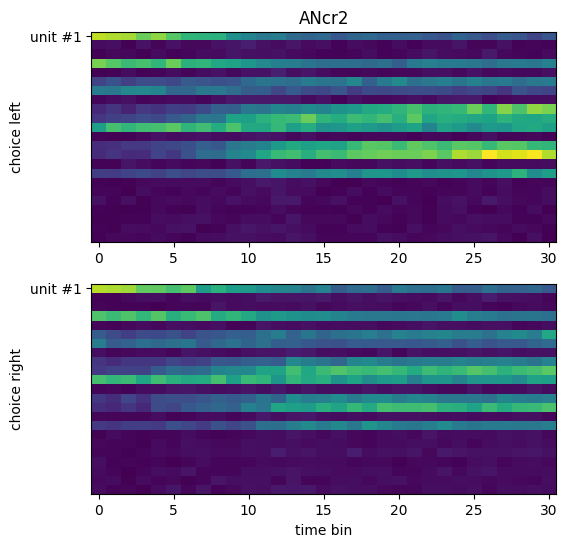

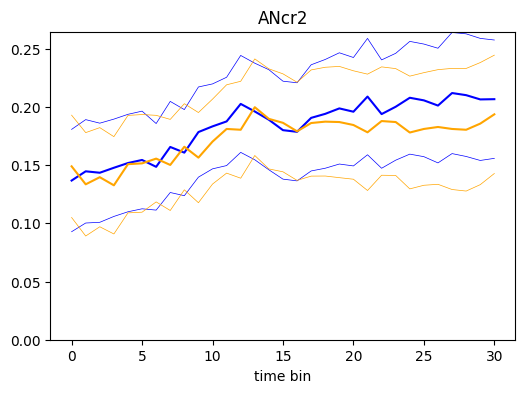

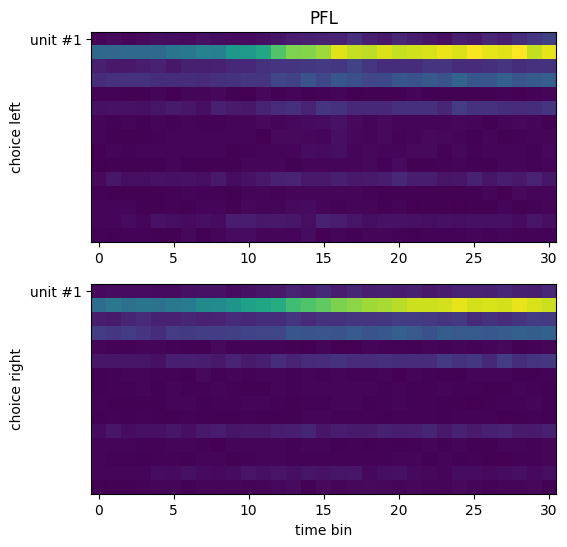

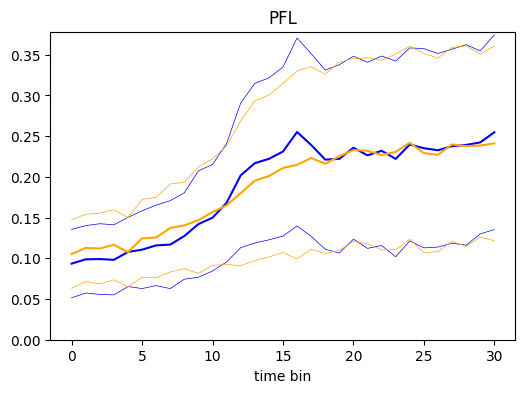

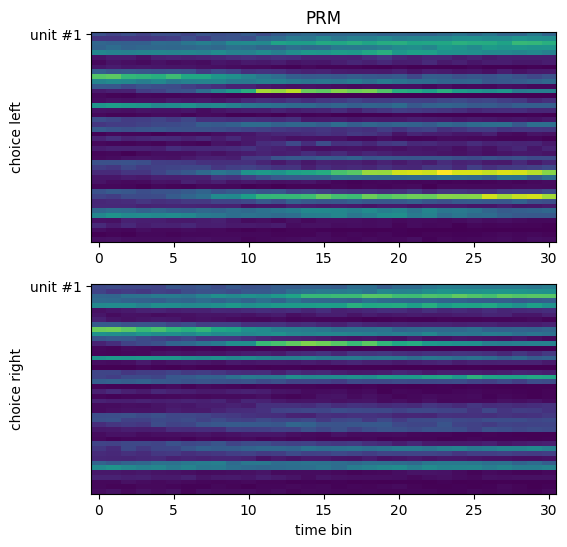

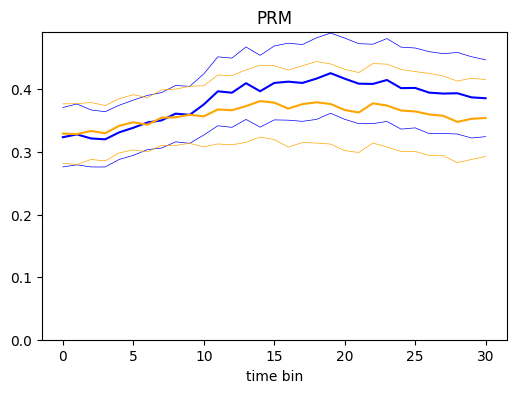

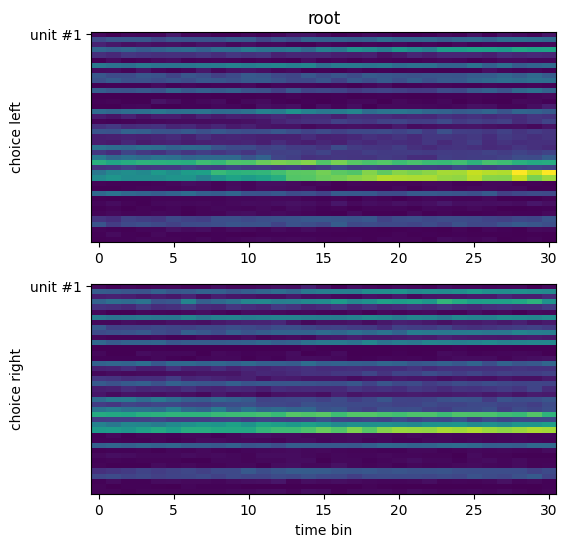

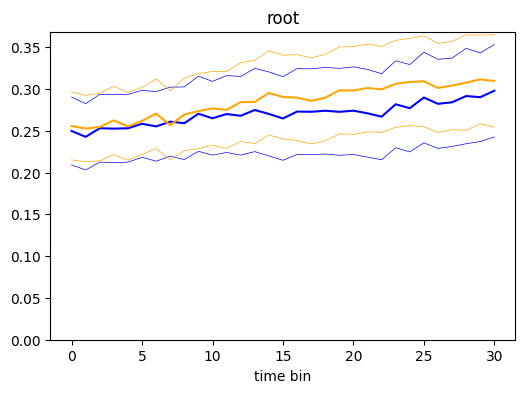

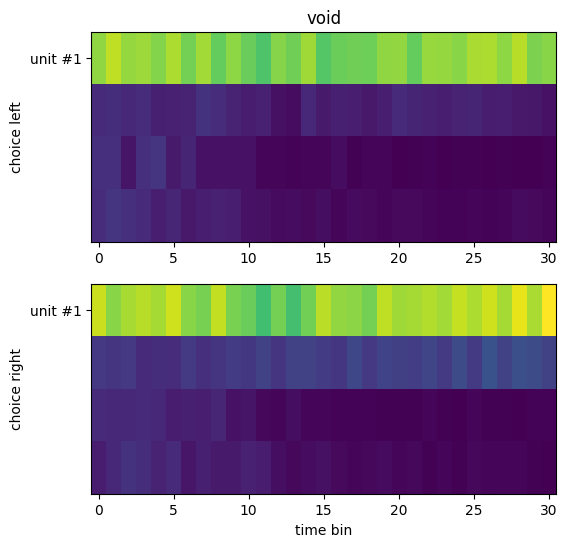

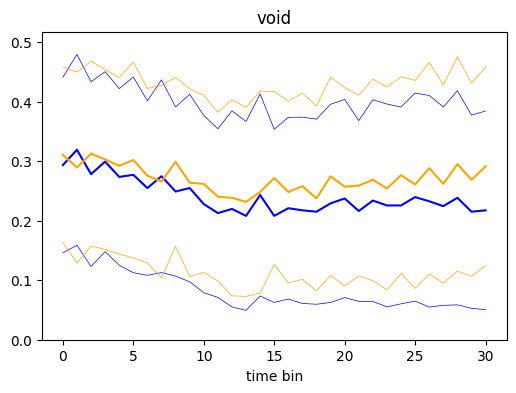

['MA' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI'
 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI' 'SI'
 'SI' 'SI' 'SI' 'SI' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe'
 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe'
 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'GPe' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP']


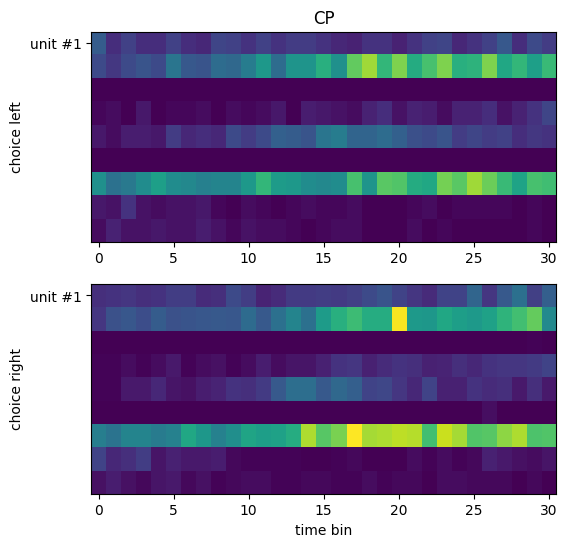

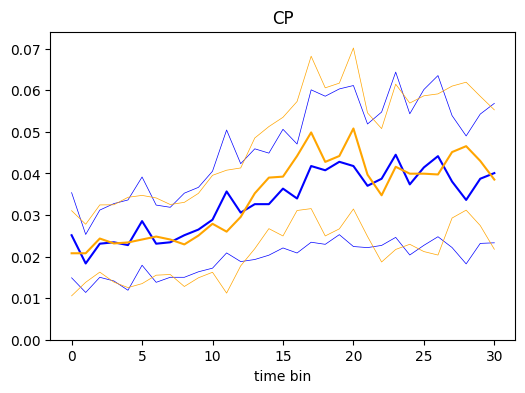

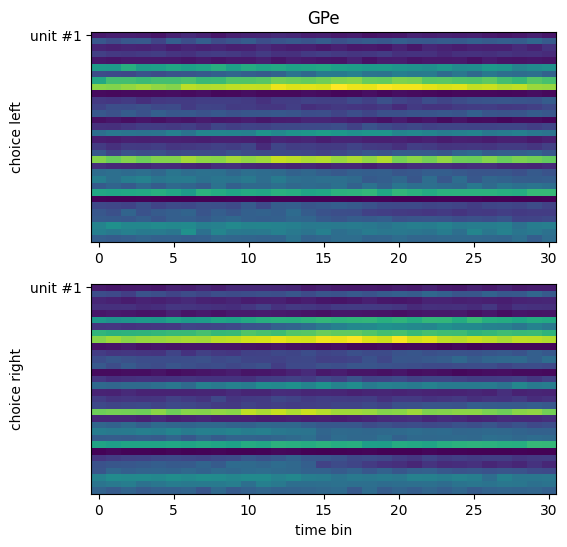

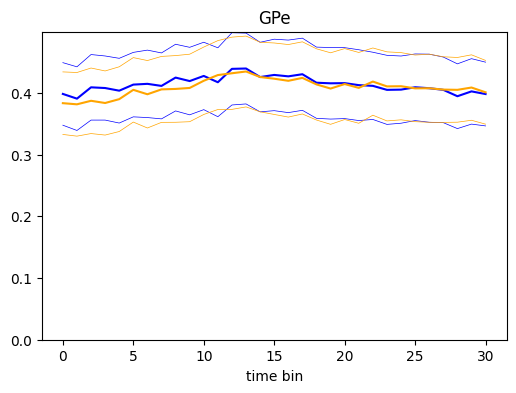

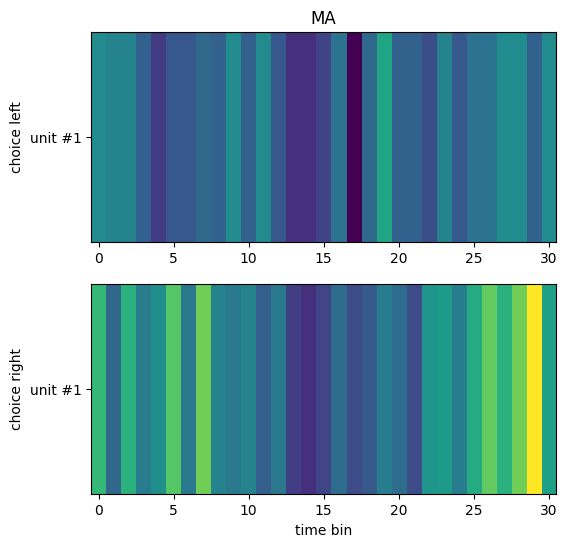

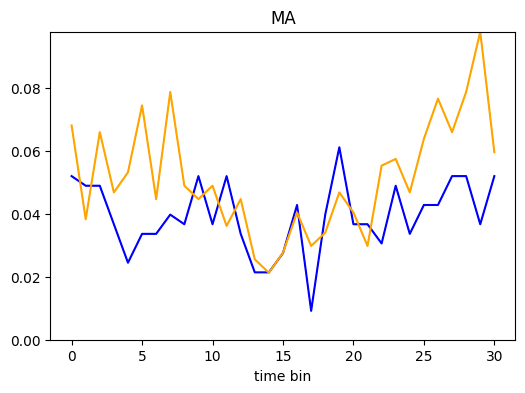

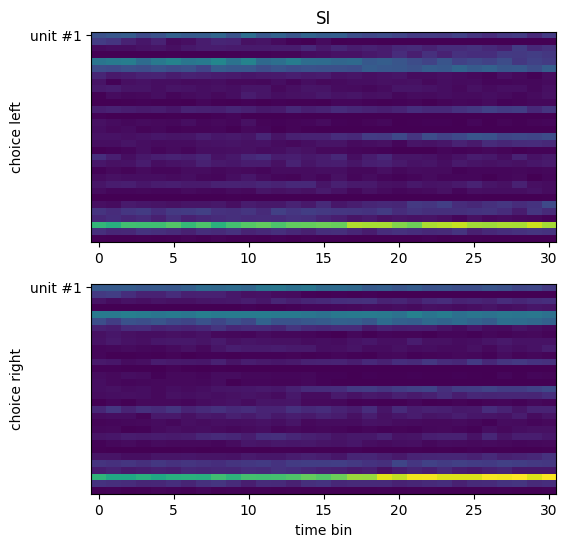

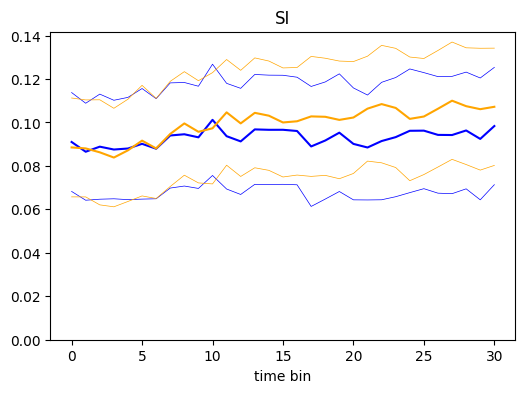

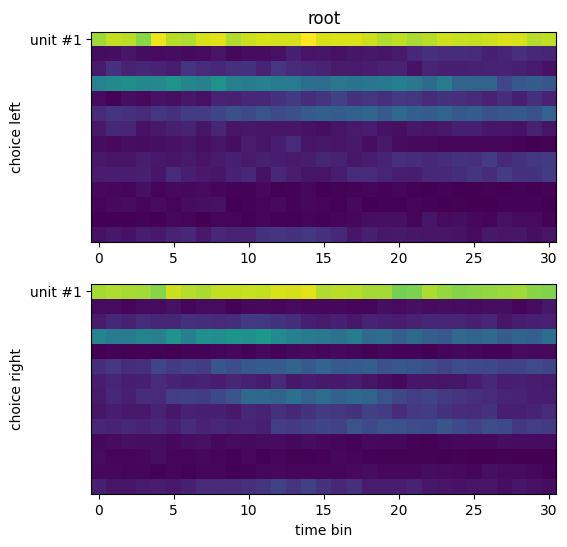

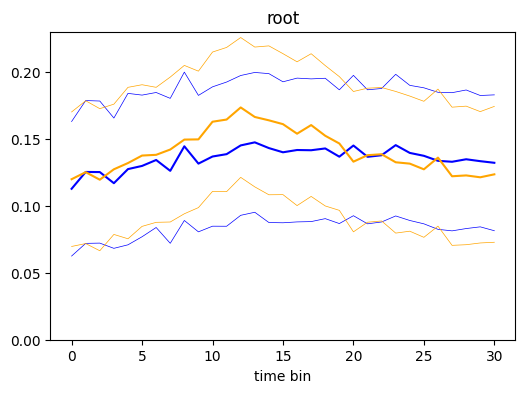

['MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD'
 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD'
 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD'
 'MD' 'MD' 'MD' 'MD' 'LH' 'LH' 'LH' 'CL' 'DG' 'DG' 'CA1' 'CA1' 'CA1' 'CA1'
 'CA1' 'RSPagl' 'RSPagl' 'RSPagl' 'RSPagl' 'RSPagl' 'RSPagl' 'RSPagl'
 'RSPagl' 'RSPagl' 'RSPagl' 'RSPagl' 'RSPagl' 'RSPagl' 'RSPagl' 'RSPagl'
 'RSPagl' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'LH' 'RSPagl'
 'RSPagl' 'RSPagl' 'RSPagl' 'RSPagl']


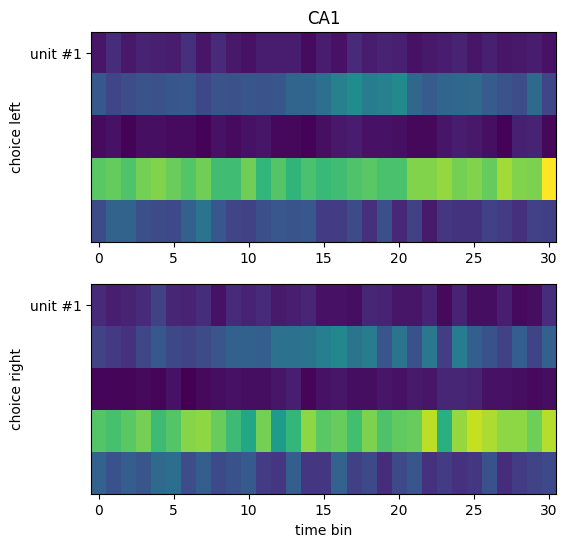

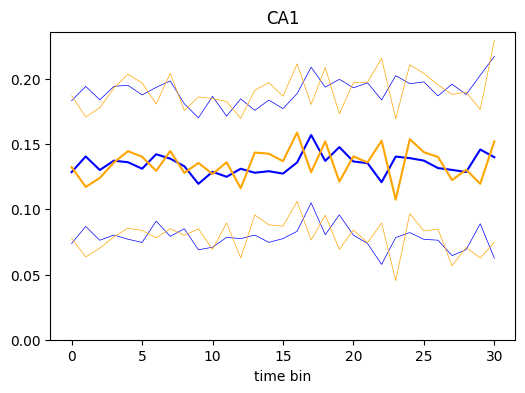

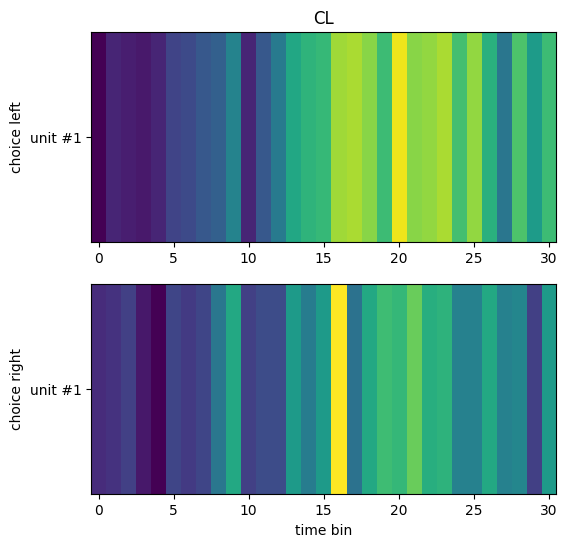

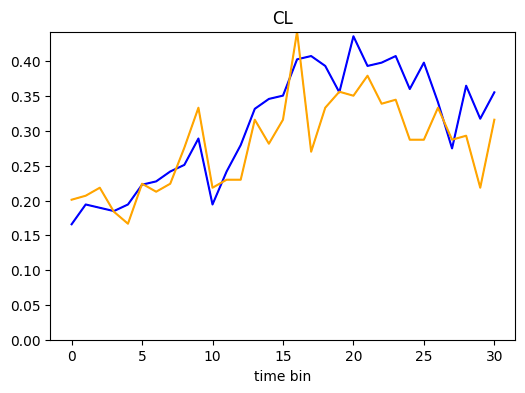

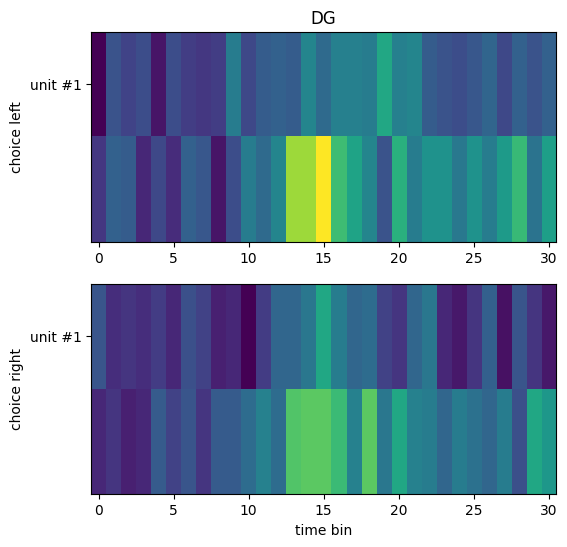

...

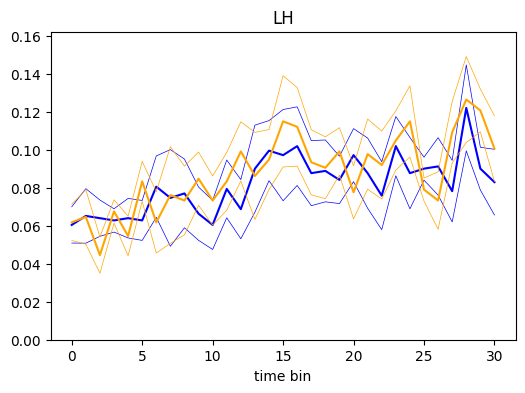

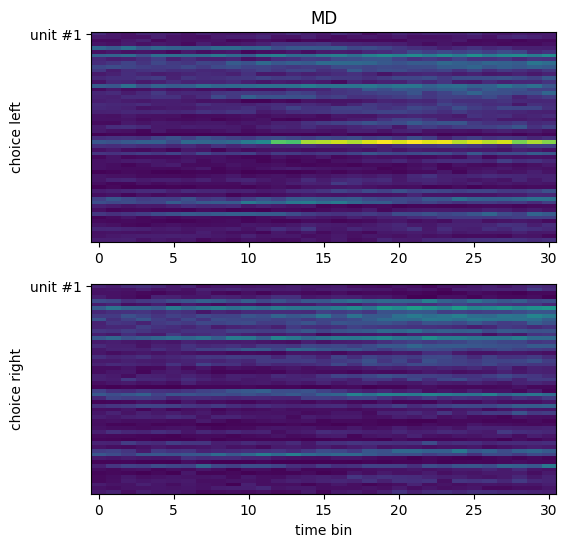

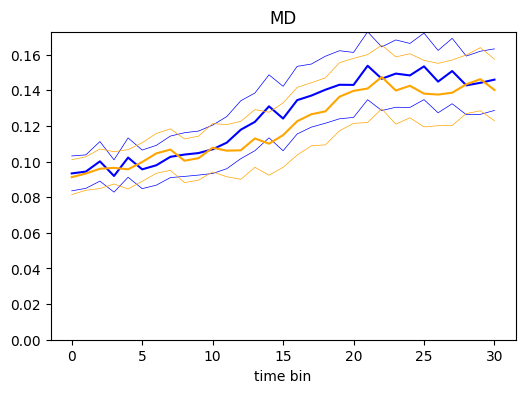

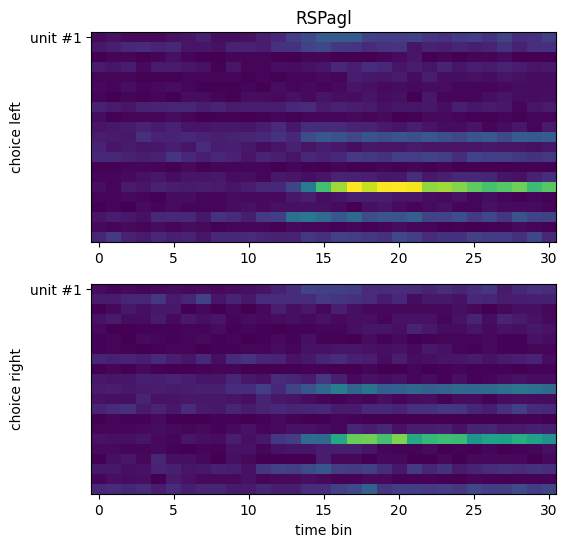

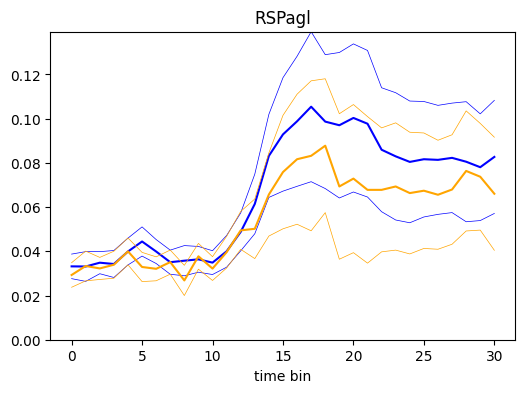

['CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'SSp-ul' 'SSp-ul' 'SSp-ul' 'SSp-ul' 'SSp-ul' 'SSp-ul'
 'SSp-ul' 'SSp-ul' 'SSp-ul' 'SSp-ul' 'SSp-ul' 'SSp-ul' 'SSp-ul' 'SSp-ul'
 'SSp-ul' 'SSp-ul' 'SSp-ul' 'SSp-ul' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'SSp-ul' 'SSp-ul' 'SSp-ul' 'SSp-ul' 'SSp-ul' 'SSp-ul']


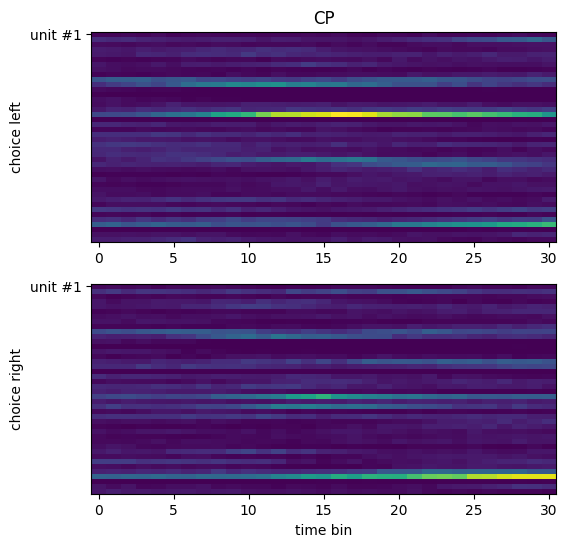

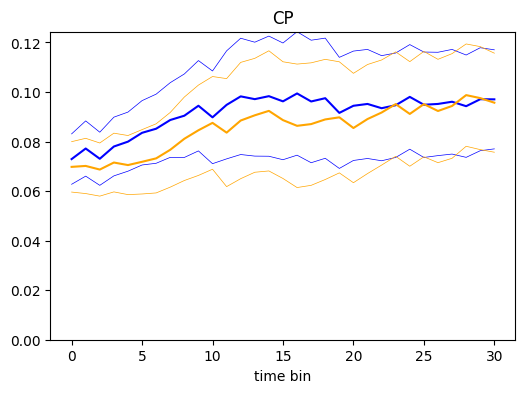

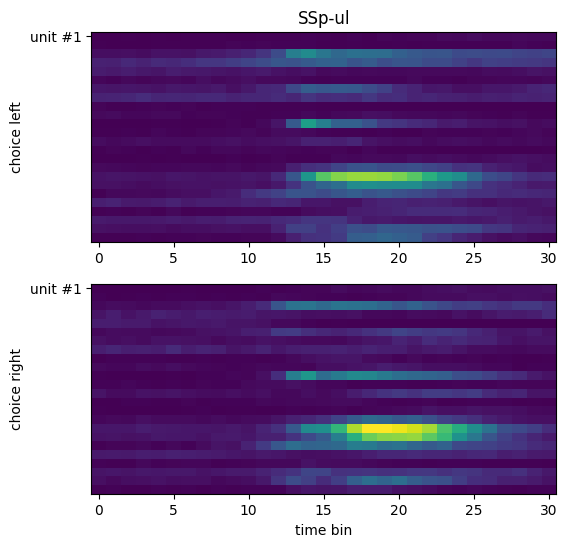

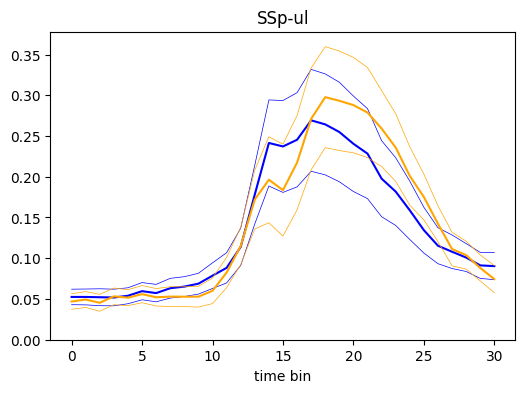

['MPO' 'MPO' 'MPO' 'MPO' 'MPO' 'MPO' 'MPO' 'MPO' 'MPO' 'MPO' 'MPO' 'MPO'
 'MPO' 'MPO' 'MPO' 'MPO' 'BST' 'BST' 'BST' 'BST' 'BST' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv'
 'LSv' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv' 'LSv'
 'LSr' 'LSr' 'LSr' 'LSr' 'LSr' 'LSr' 'LSr' 'LSr' 'LSr' 'LSr' 'LSr' 'LSr'
 'LSr' 'LSr' 'LSr' 'LSr' 'LSr' 'LSr' 'LSr' 'LSr' 'LSr' 'root' 'LSv' 'LSr'
 'LSr']


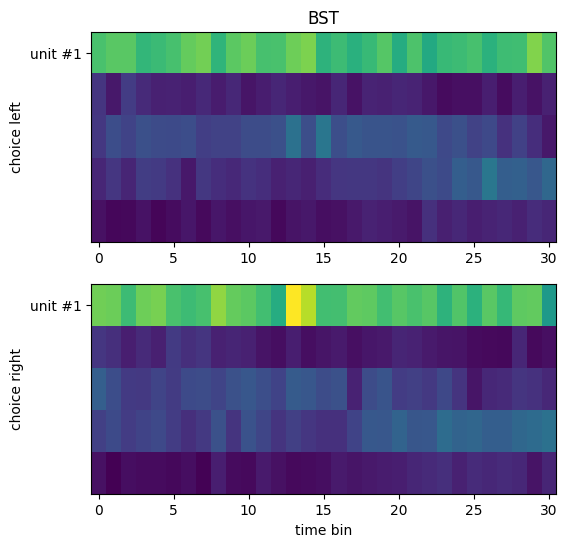

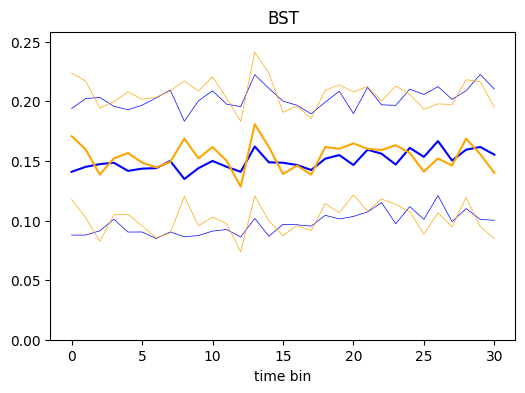

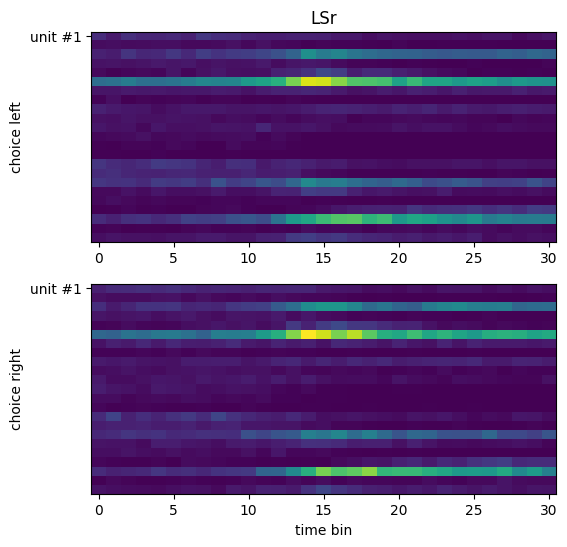

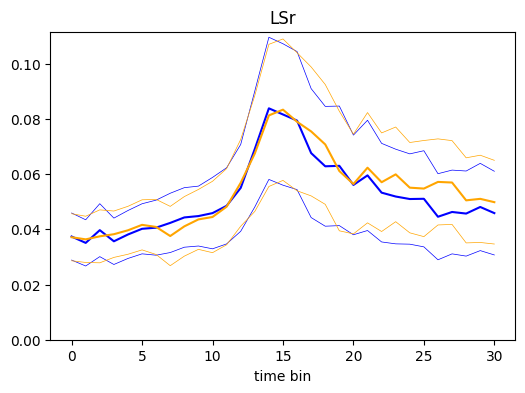

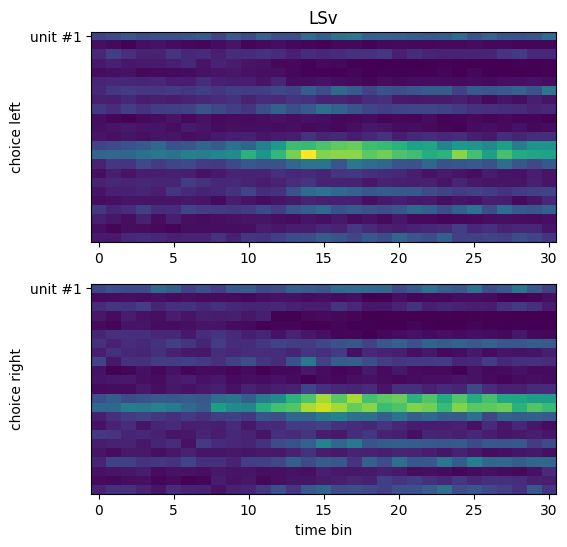

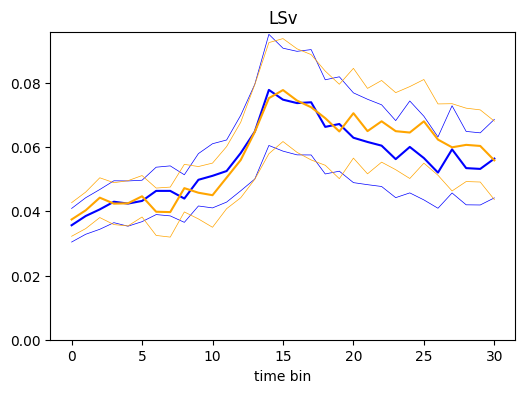

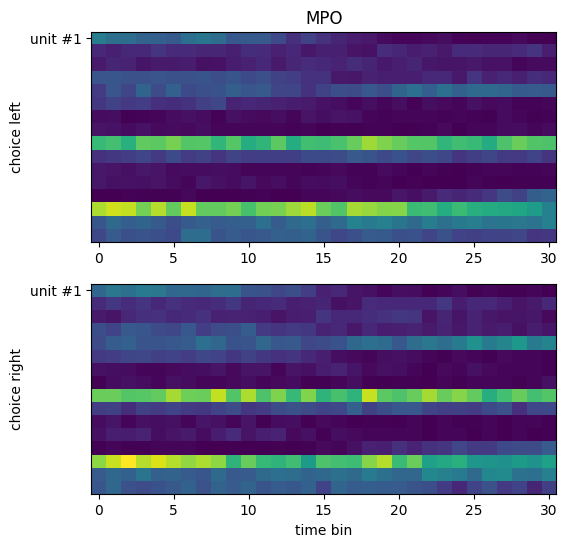

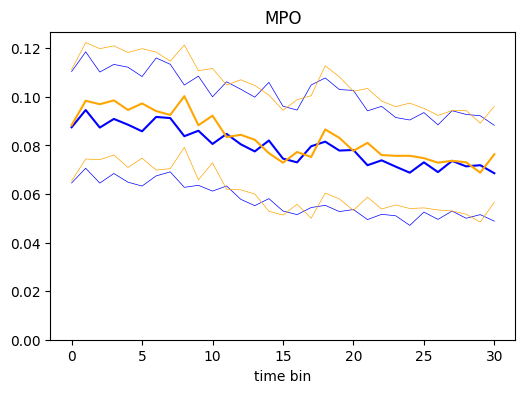

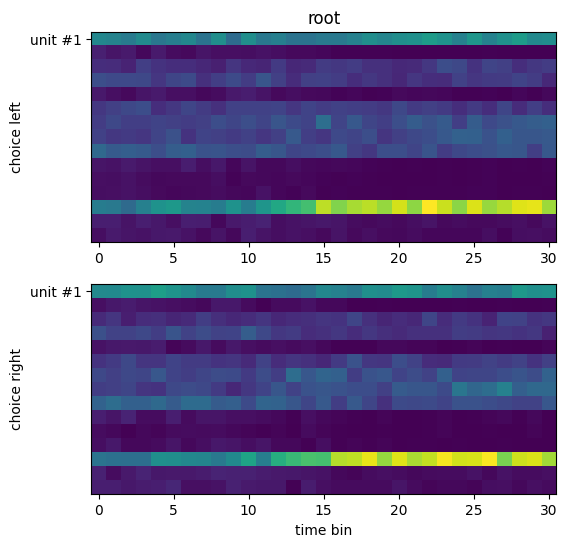

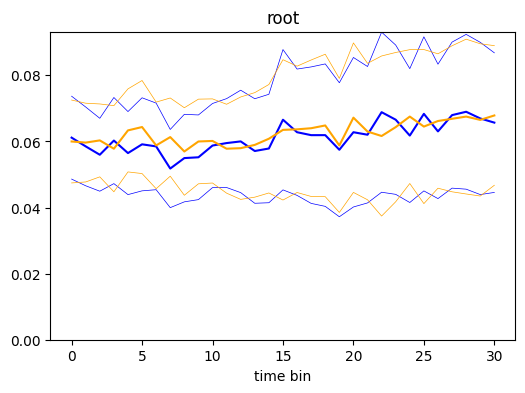

No default revision for dataset alf/probe00/pykilosort/#2024-05-06#/clusters.metrics.pqt; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-05-06#/clusters.metrics.pqt; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-05-06#/clusters.metrics.pqt; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-05-06#/clusters.metrics.pqt; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-05-06#/clusters.metrics.pqt; using most recent


['LRN' 'LRN' 'LRN' 'LRN' 'LRN' 'LRN' 'LRN' 'LRN' 'MDRN' 'MDRN' 'MDRN'
 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN'
 'MDRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN'
 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN'
 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'IRN'
 'IRN' 'IRN' 'IRN' 'IRN' 'IRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN'
 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN' 'MDRN'
 'MDRN' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'root'
 'ECU' 'ECU' 'ECU' 'ECU' 'ECU' 'ECU' 'root' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU'
 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU'
 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU'
 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'UVU'
 'UVU' 'UVU' 'UVU' 'UVU' 'UVU' 'root' 'root' 'root' 'COPY' 'COPY' 'LRN'
 'IRN' 'MDRN' 'MDRN' 'ECU' 'UVU' 'MDRN']


No default revision for dataset alf/probe00/pykilosort/#2024-05-06#/clusters.metrics.pqt; using most recent


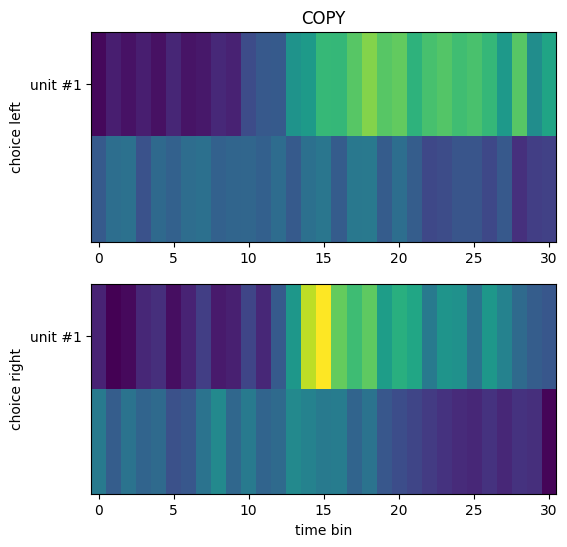

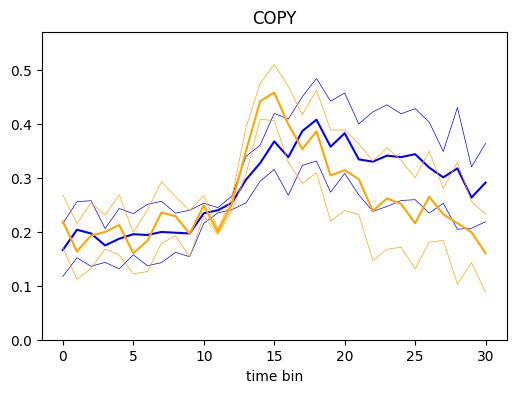

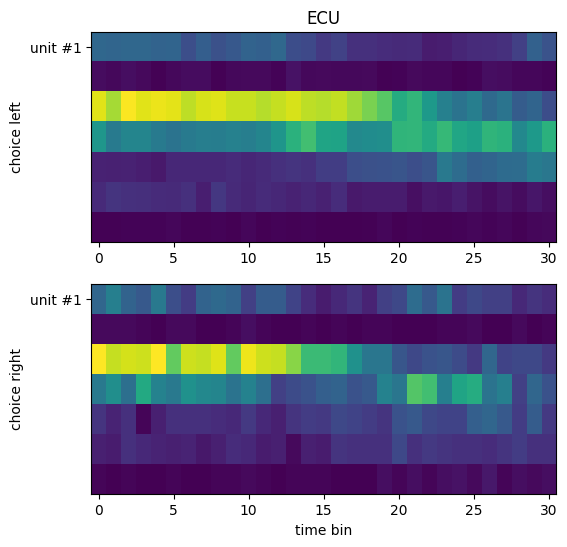

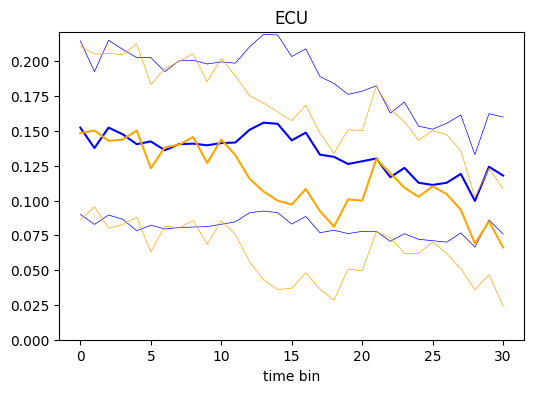

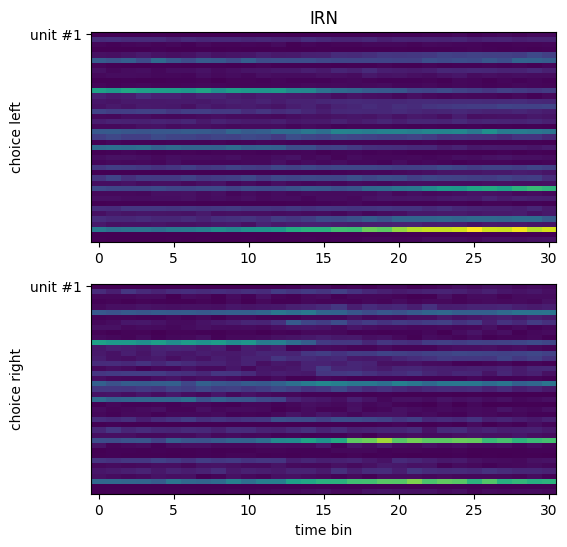

...

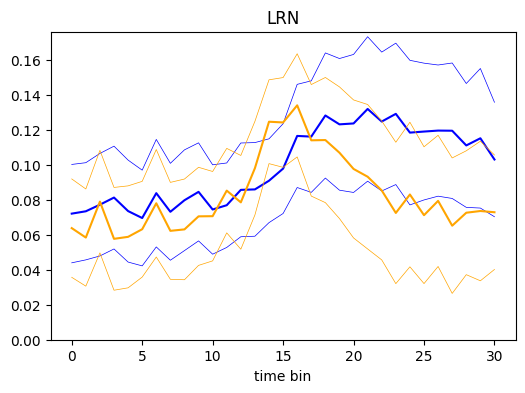

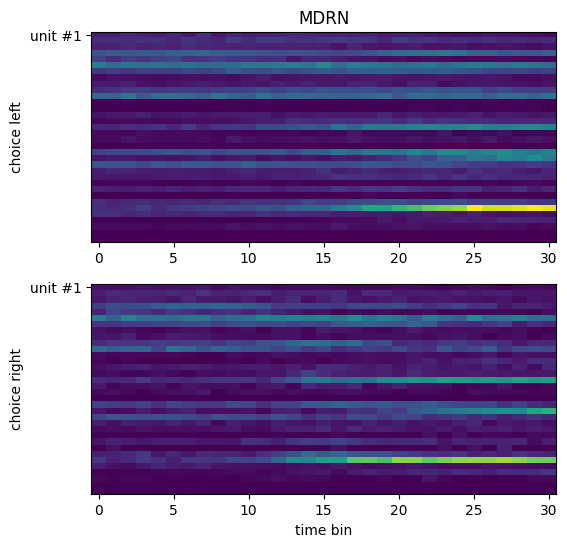

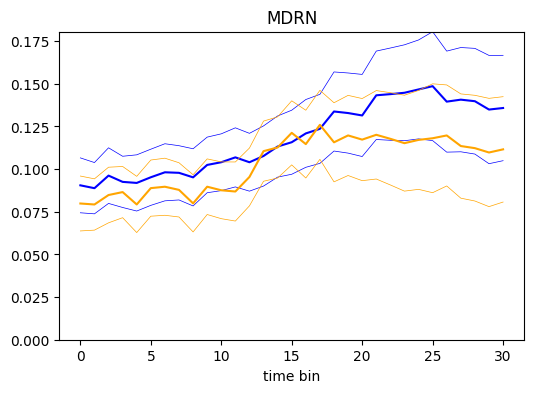

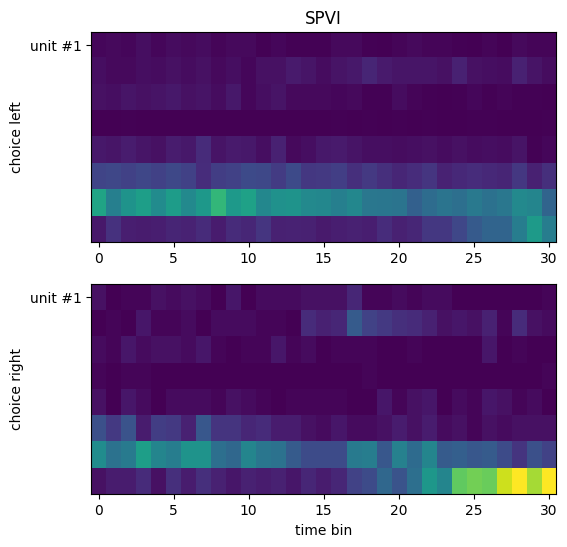

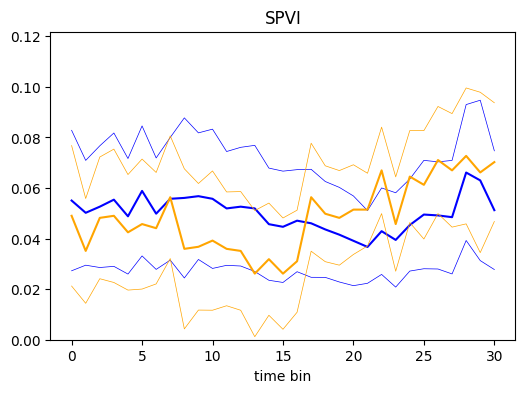

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/brainbox/task/trials.py:196: RuntimeWarning: Mean of empty slice
  mean = np.nanmean(raster, axis=0)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


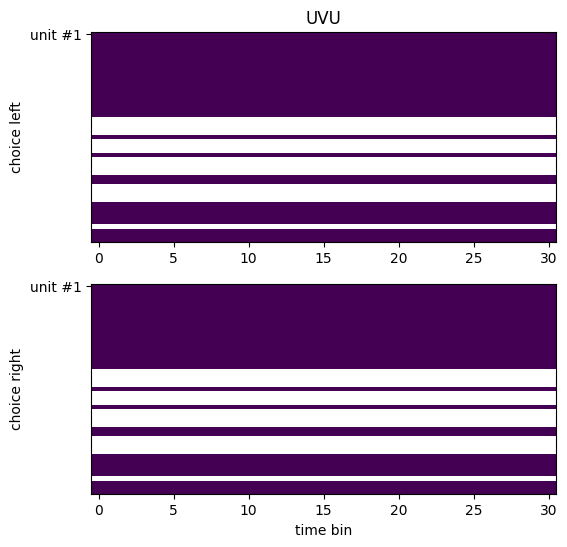

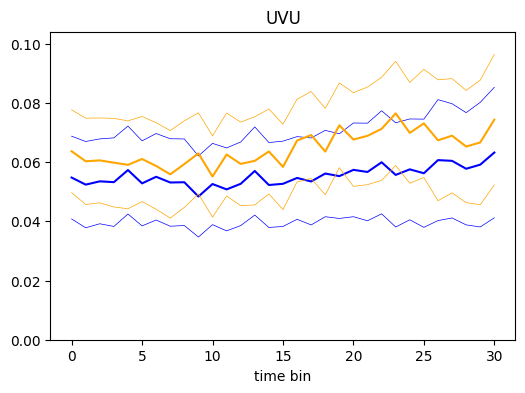

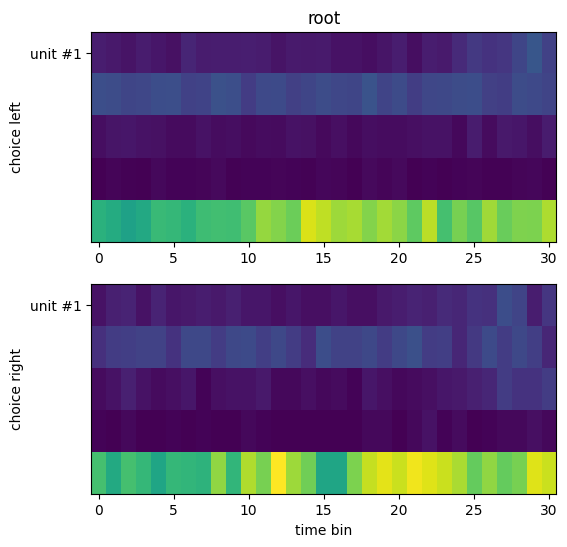

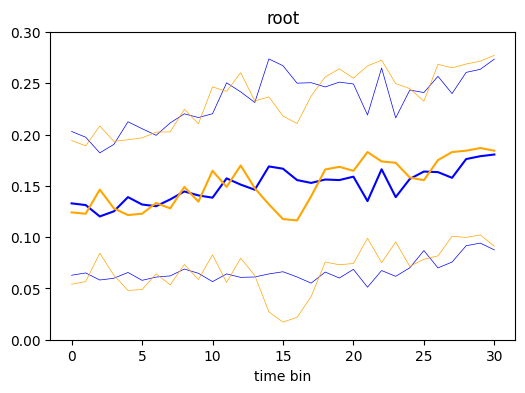

['OT' 'SI' 'ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'root' 'ACB' 'ACB'
 'CP' 'CP' 'CP' 'CP' 'CP' 'ACB' 'ACB' 'ACB' 'CP' 'CP' 'CP']


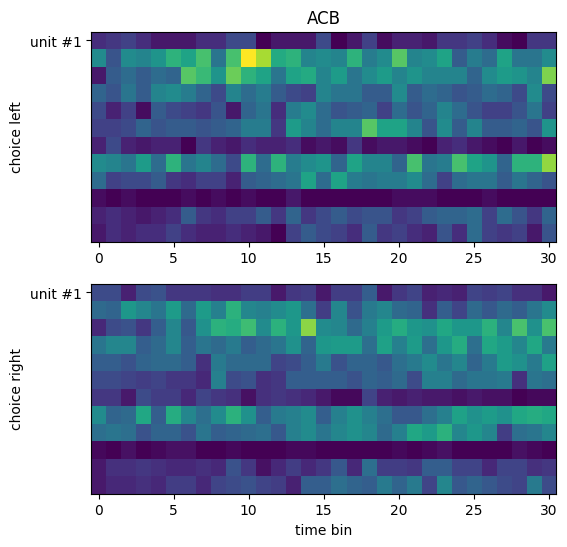

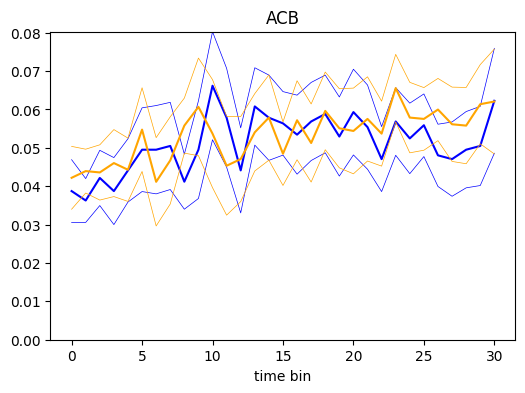

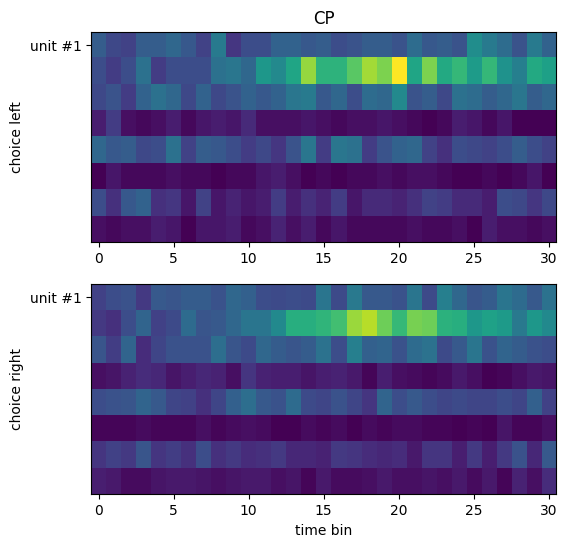

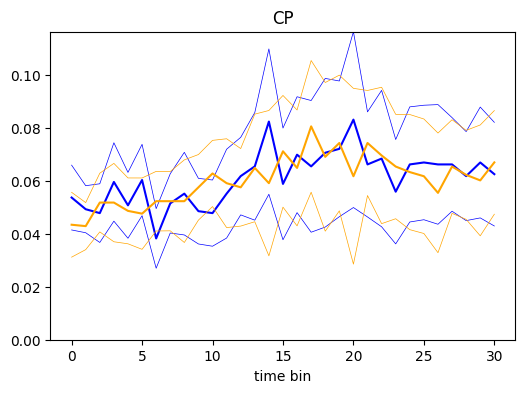

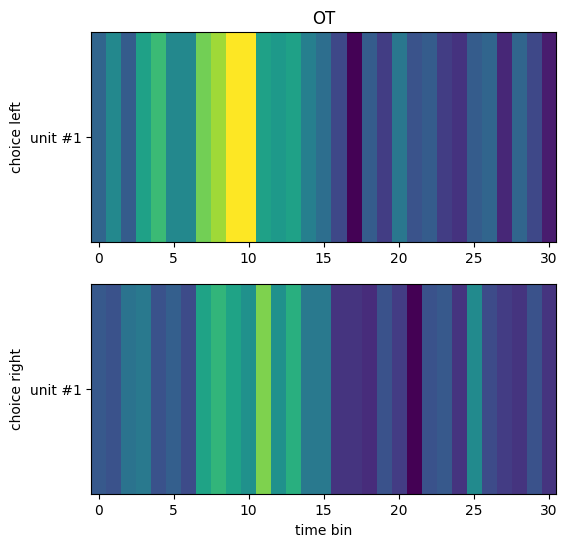

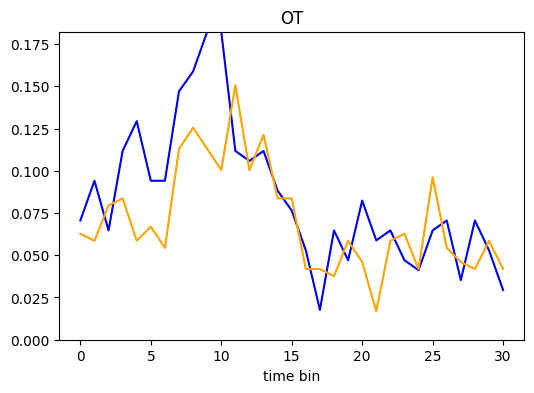

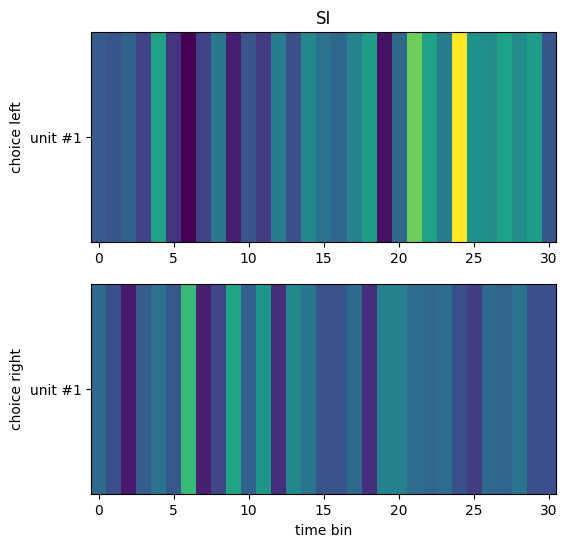

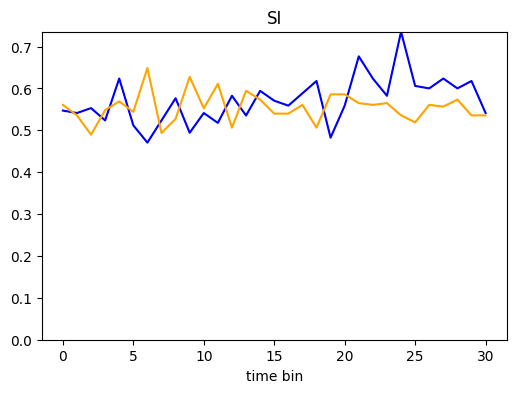

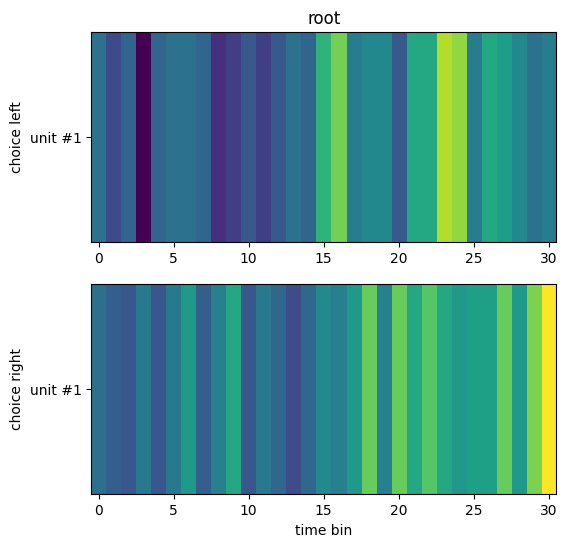

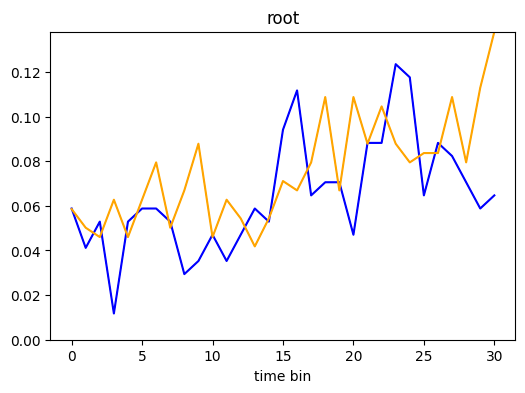

Inconsistent dimensions for object: clusters 
(758,),	channels
(758,),	depths
(783, 16),	metrics
(758,),	uuids


['AON' 'AON' 'AON' 'AON' 'AON' 'AON' 'AON' 'AON' 'AON' 'AON' 'AON' 'AON'
 'AON' 'AON' 'AON' 'root' 'root' 'root' 'root' 'root' 'AON' 'AON' 'AON'
 'AON' 'AON' 'AON' 'AON' 'AON' 'AON' 'AON' 'AON' 'AON' 'AON' 'AON' 'root'
 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl'
 'ORBl' 'ORBl' 'FRP' 'FRP' 'AON' 'AON' 'AON' 'root' 'AON' 'AON' 'AON'
 'AON' 'ORBl' 'ORBl' 'AON' 'root' 'AON']


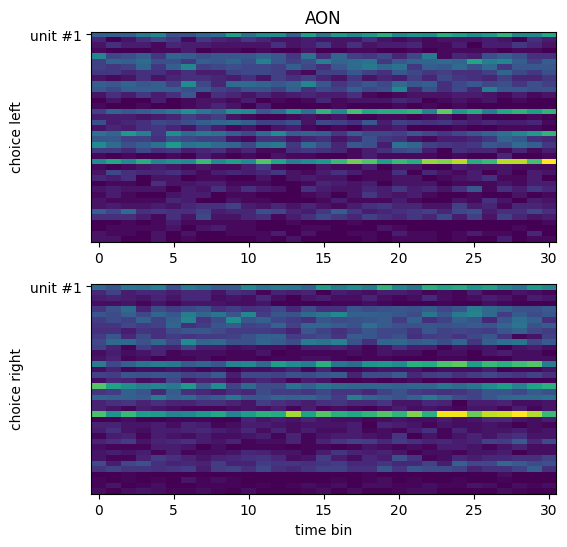

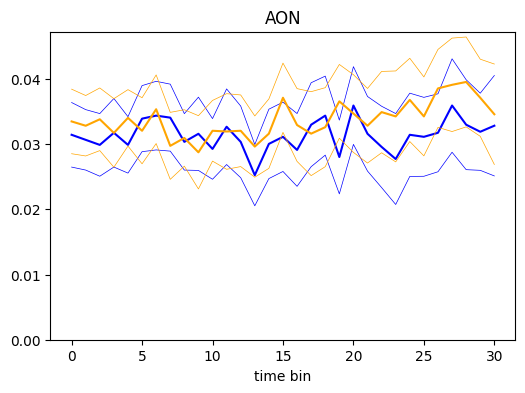

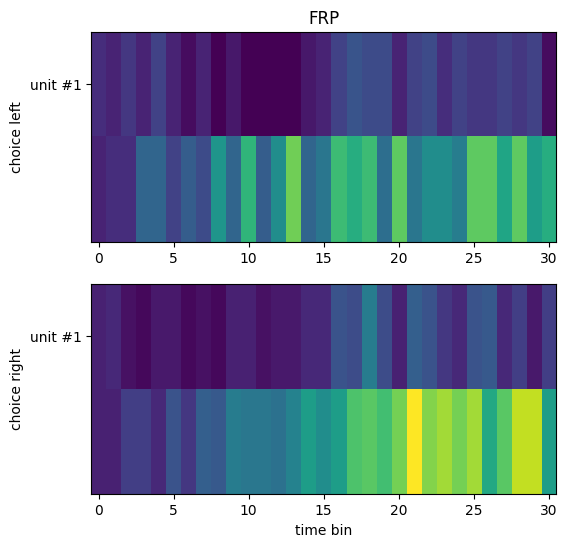

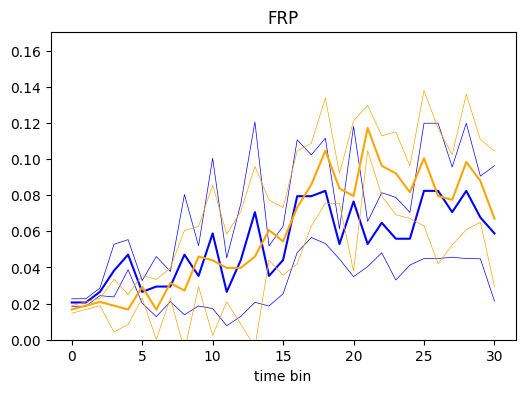

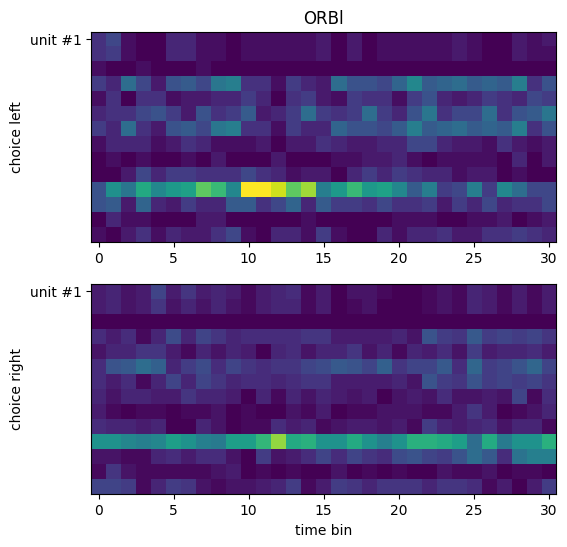

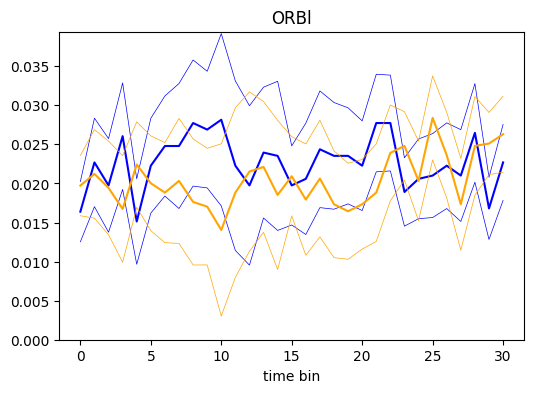

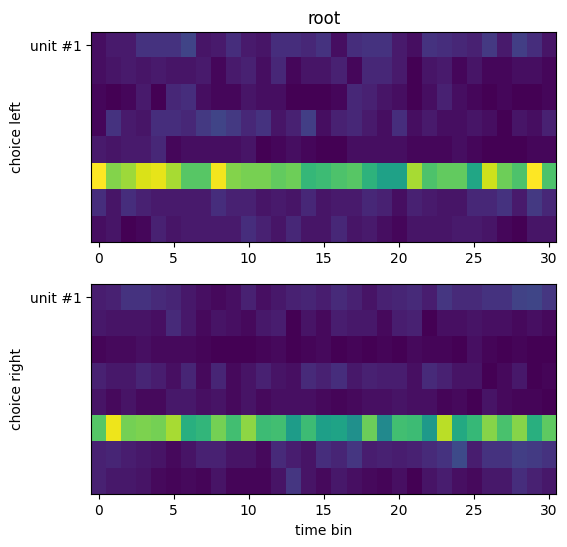

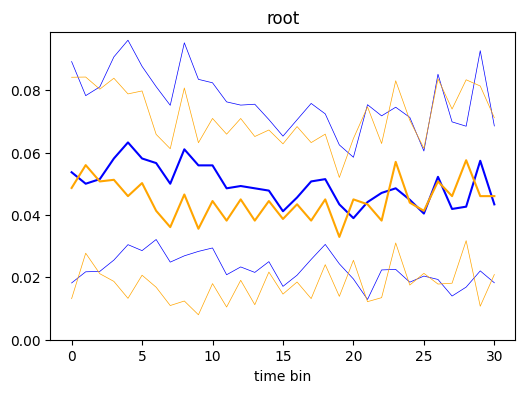

['PARN' 'PARN' 'PARN' 'root' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV' 'MV'
 'MV' 'MV' 'MV' 'MV' 'MV' 'root' 'root' 'PB' 'PB' 'PB' 'PB' 'PB' 'PB' 'PB'
 'PB' 'PB' 'PB' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'CENT3' 'CENT3' 'CENT3' 'CENT3'
 'CENT3' 'root' 'root' 'root' 'CENT3' 'CENT3' 'CUL4 5' 'CUL4 5' 'root'
 'root' 'CUL4 5' 'CUL4 5' 'CUL4 5' 'CUL4 5' 'CUL4 5' 'CUL4 5' 'CUL4 5'
 'CUL4 5' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM'
 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM'
 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'SIM' 'root' 'CUL4 5' 'SIM' 'SIM']


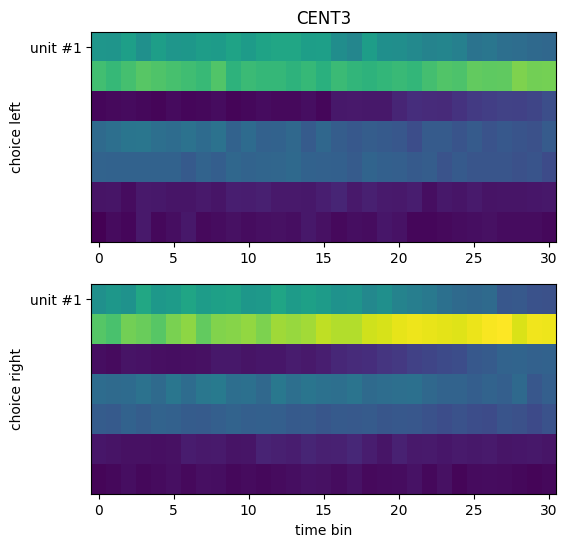

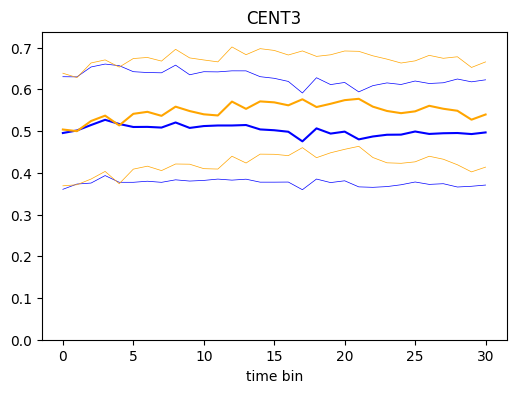

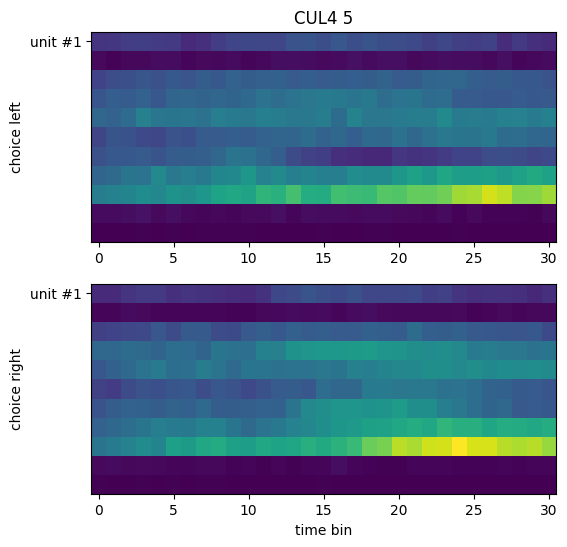

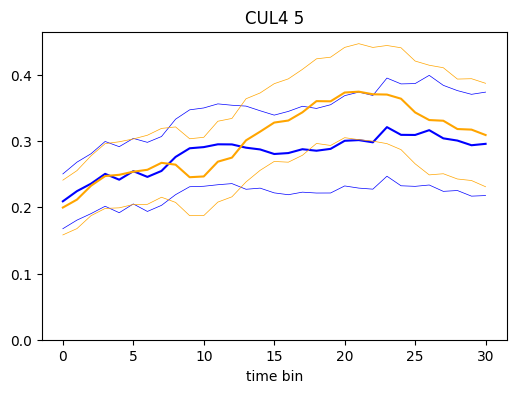

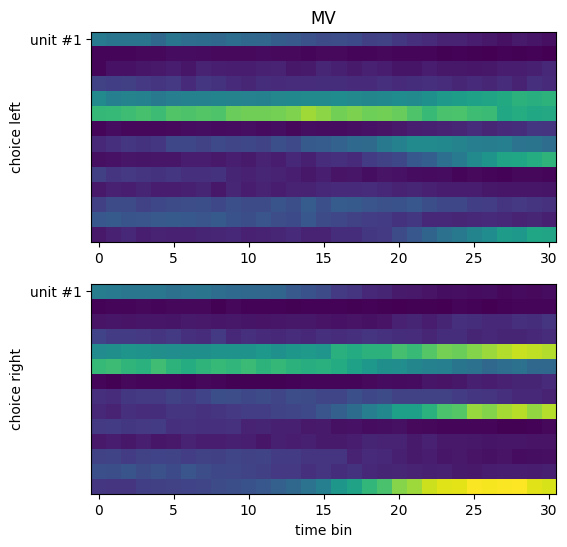

...

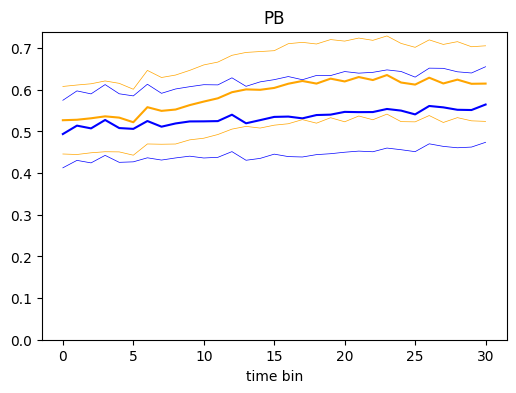

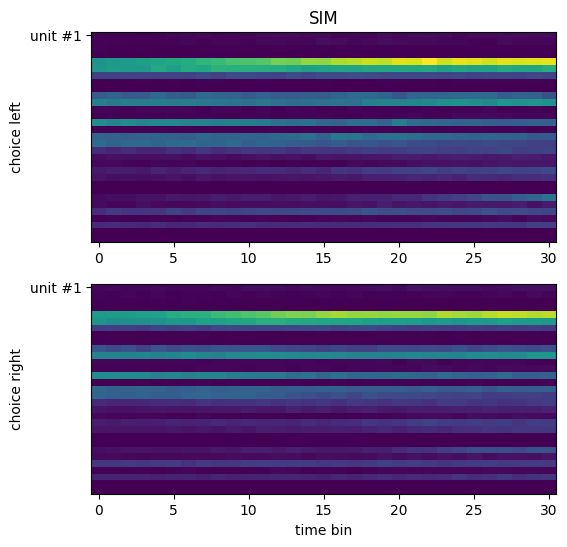

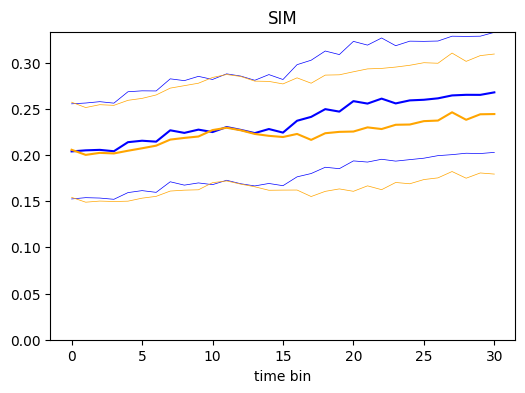

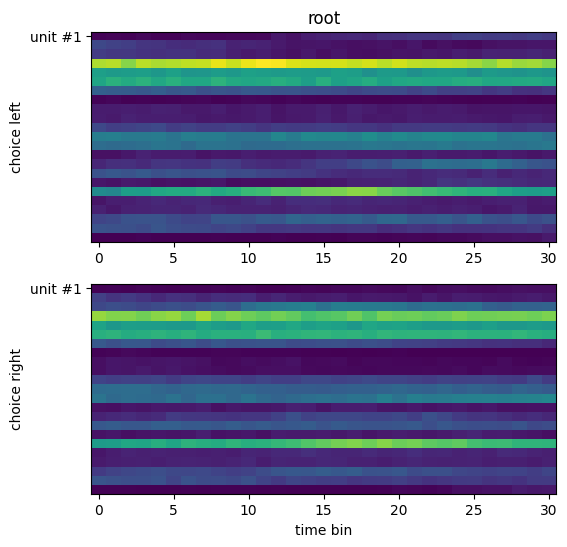

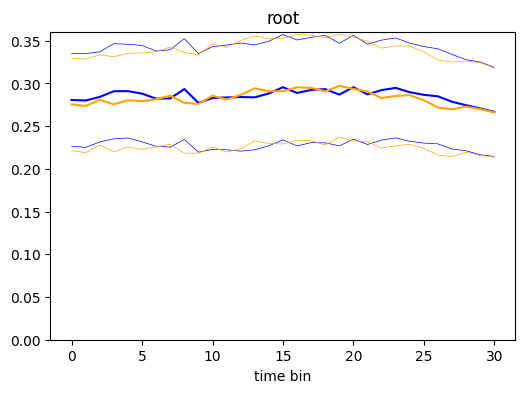

['PG' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN'
 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN'
 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN'
 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'PAG' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm']


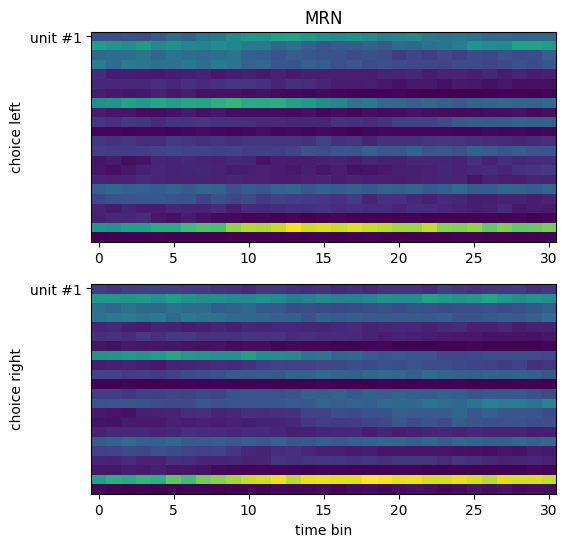

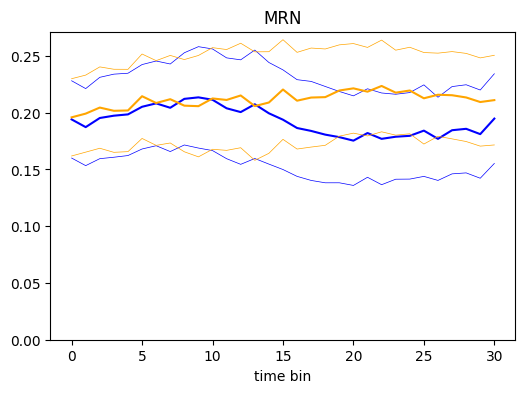

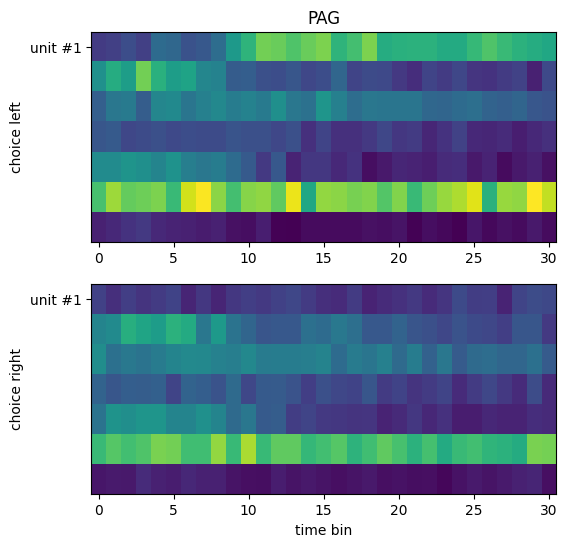

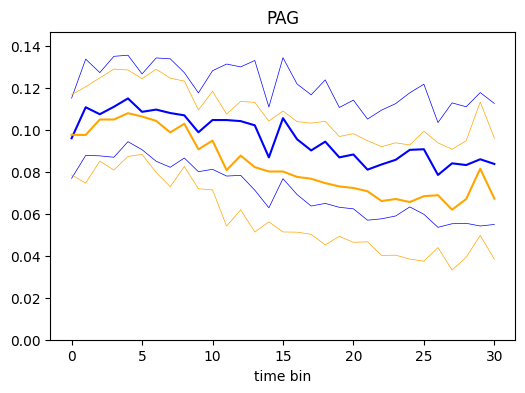

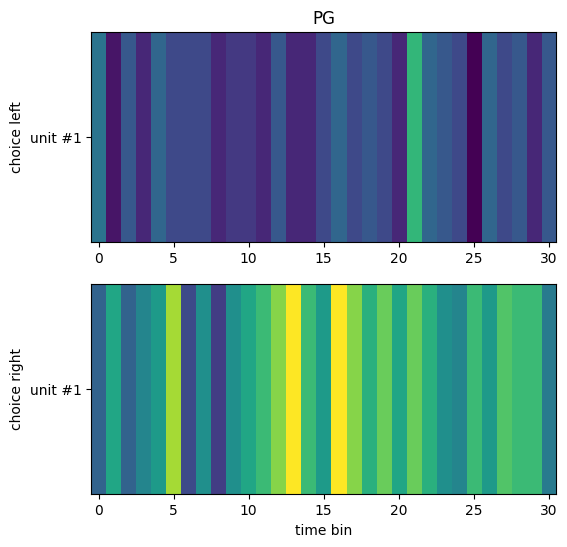

...

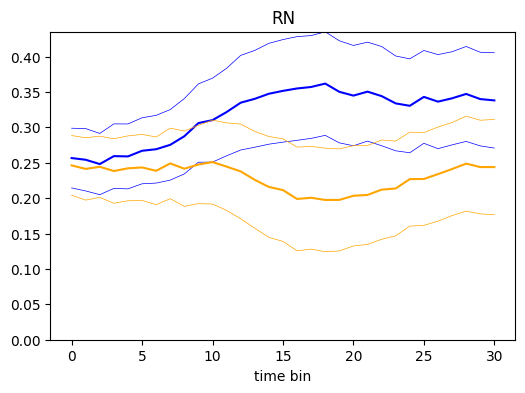

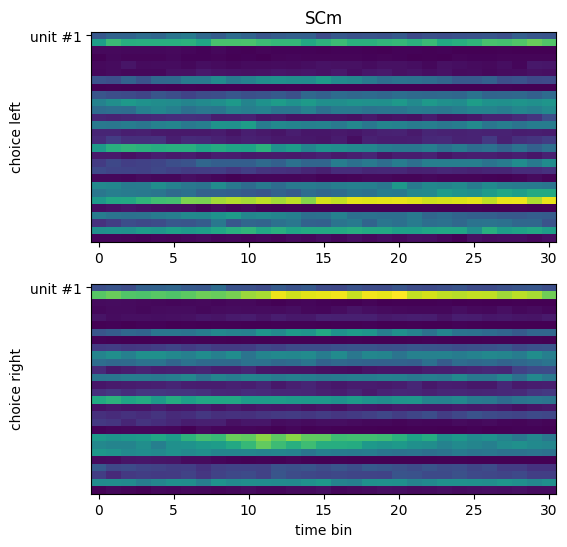

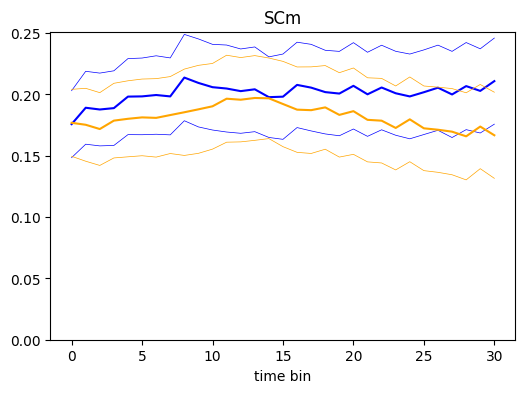

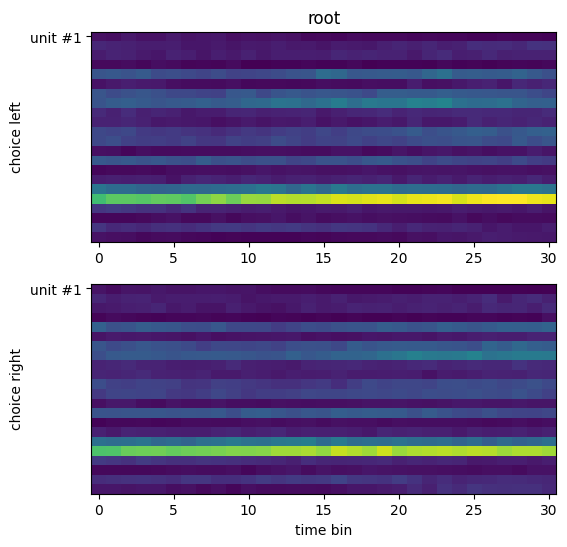

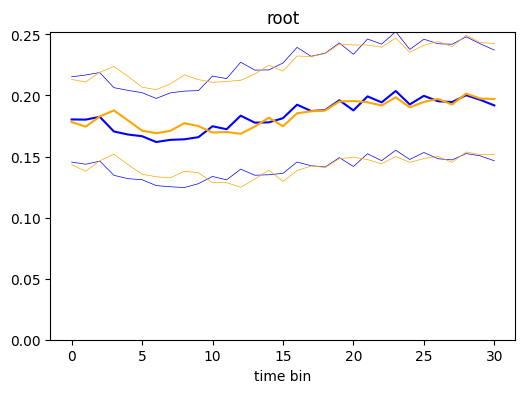

['PARN' 'PARN' 'PARN' 'PARN' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI'
 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI'
 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI'
 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI'
 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI'
 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI'
 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI'
 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'SPVI' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO'
 'DCO' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO' 'DCO'


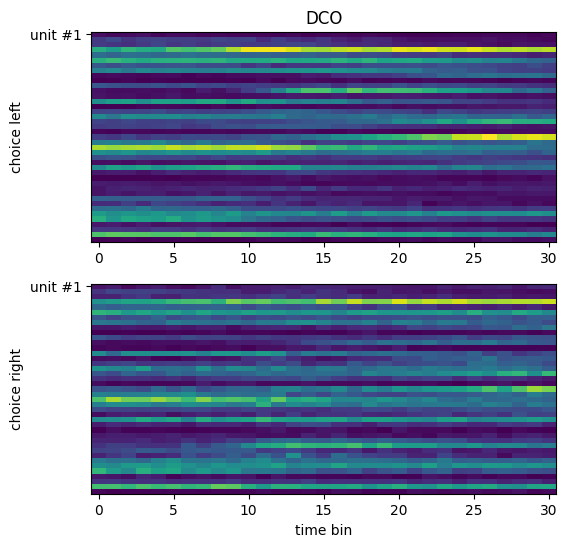

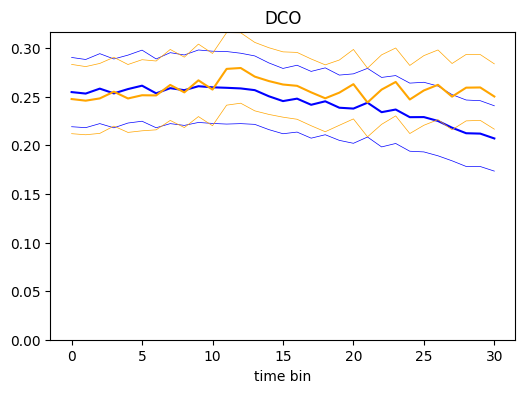

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/brainbox/task/trials.py:196: RuntimeWarning: Mean of empty slice
  mean = np.nanmean(raster, axis=0)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


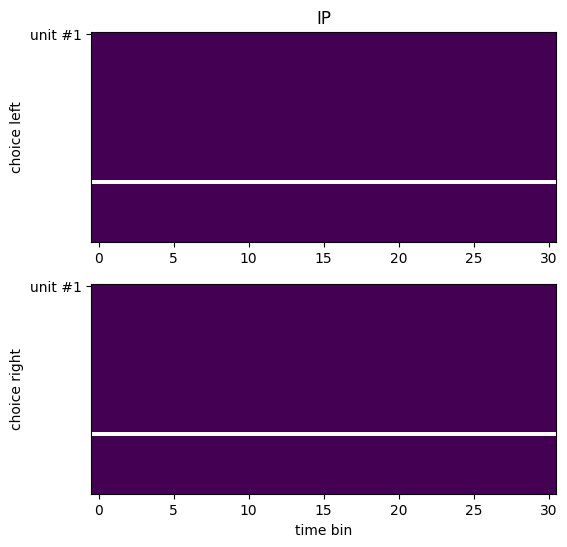

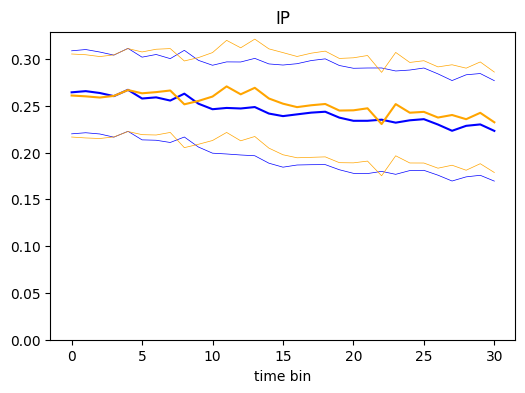

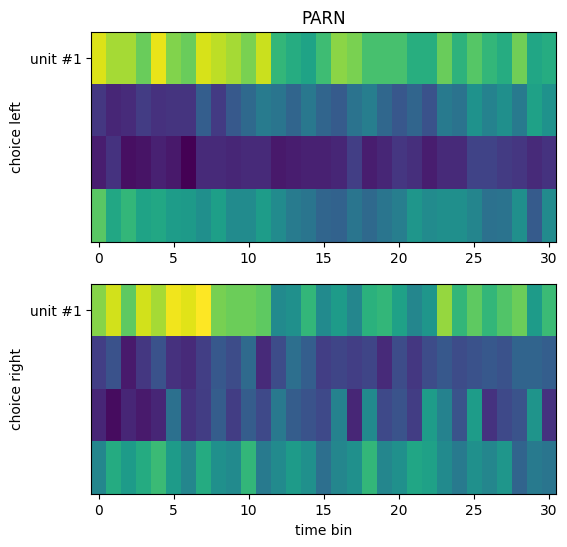

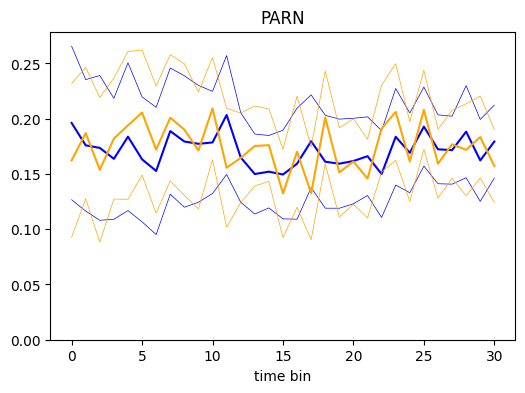

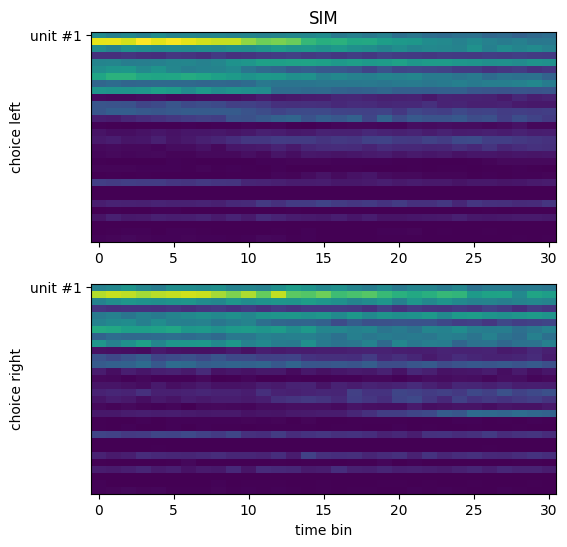

...

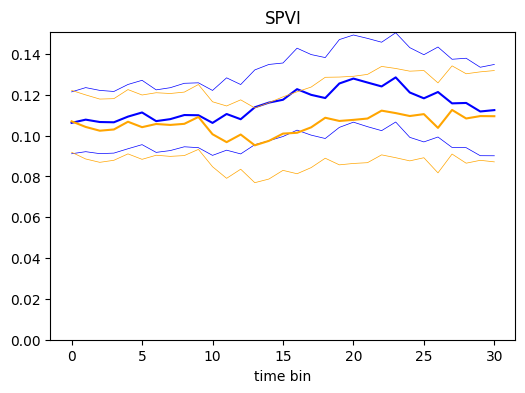

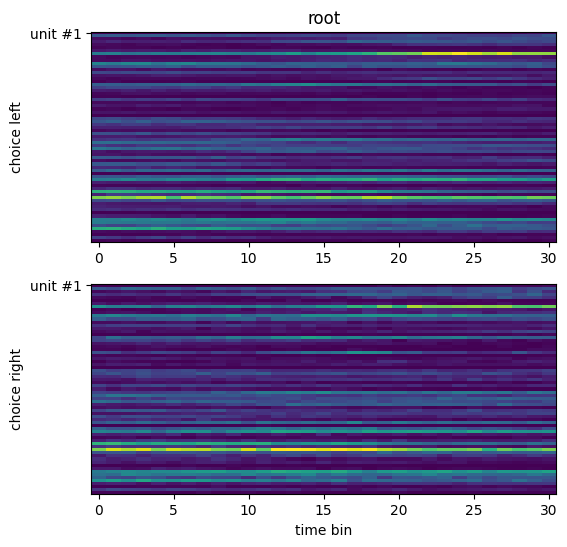

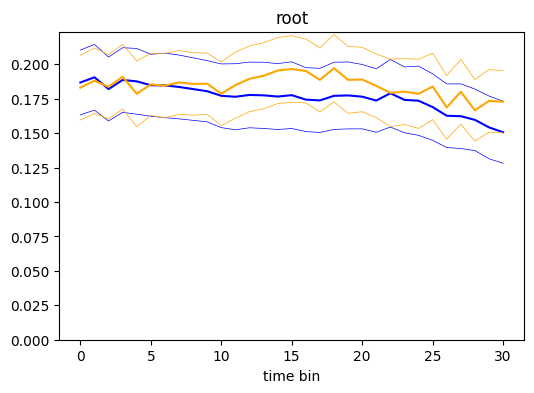

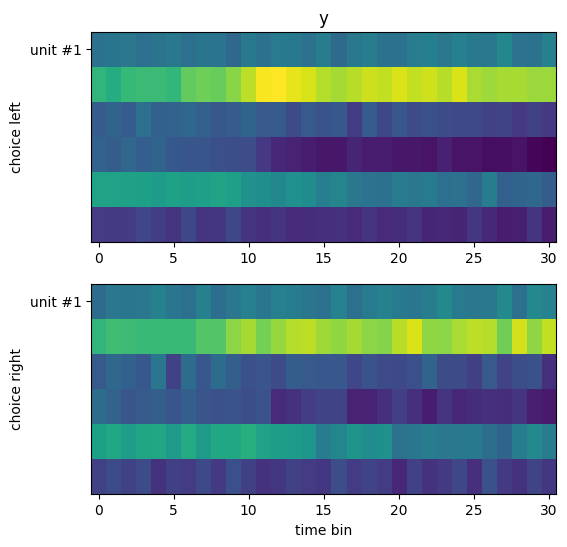

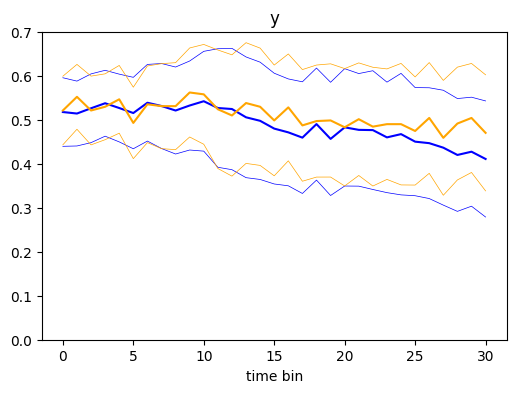

['root' 'root' 'root' 'VPLpc' 'VPLpc' 'VPLpc' 'VPLpc' 'VPLpc' 'VPLpc' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO'
 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'PO' 'Eth' 'Eth' 'Eth'
 'Eth' 'Eth' 'Eth' 'Eth' 'Eth' 'Eth' 'Eth' 'Eth' 'Eth' 'Eth' 'LP' 'LP'
 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP'
 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP' 'DG' 'DG' 'DG' 'DG' 'DG' 'DG'
 'DG' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1'
 'CA1' 'root' 'VISam' 'VISam' 'VISam' 'VISam' 'VISam' 'PO' 'PO' 'PO' 'PO'
 'PO' 'Eth' 'Eth' 'Eth' 'LP' 'LP' 'LP' 'LP' 'CA1' 'VISam' 'PO' 'VISam'
 'VISam']


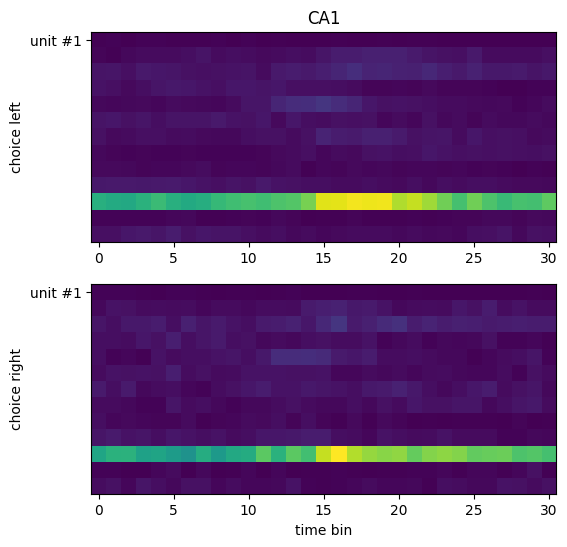

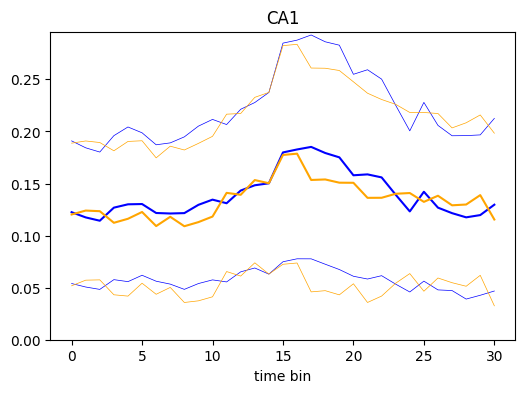

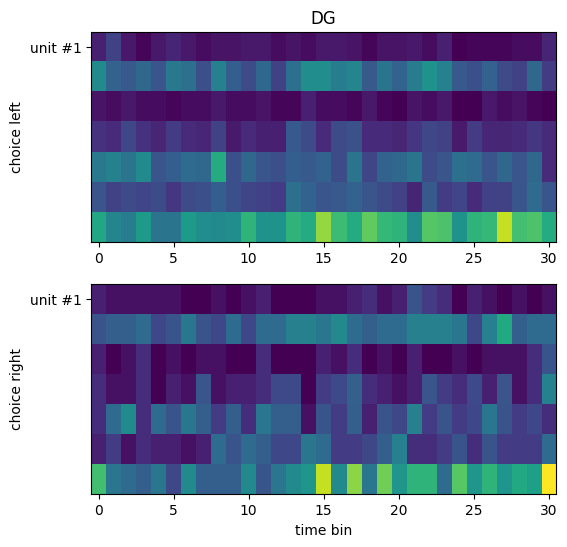

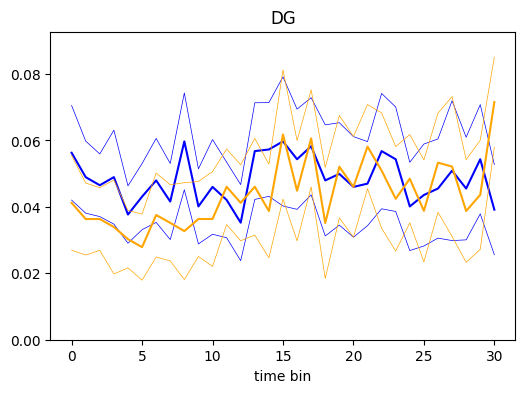

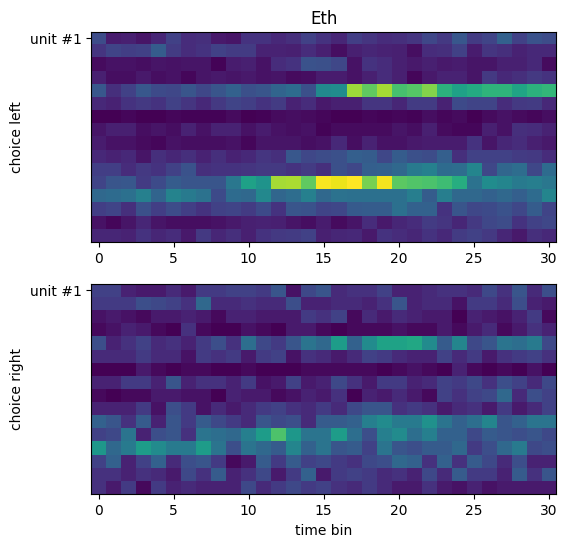

...

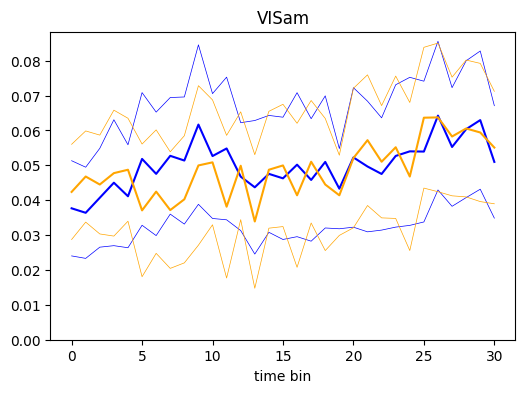

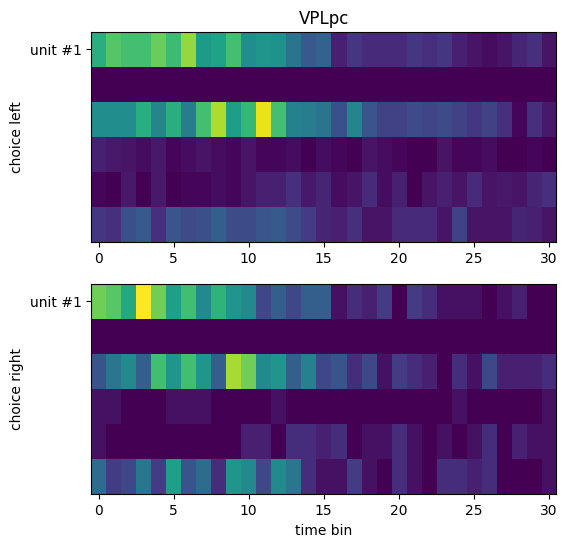

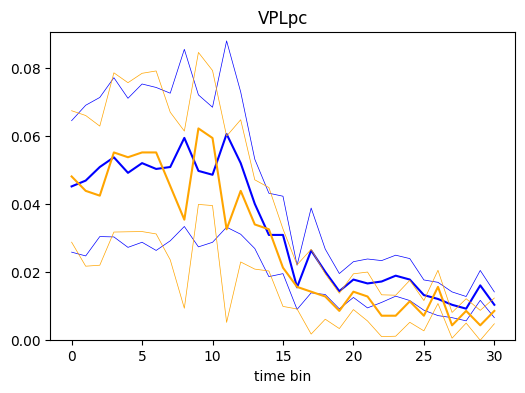

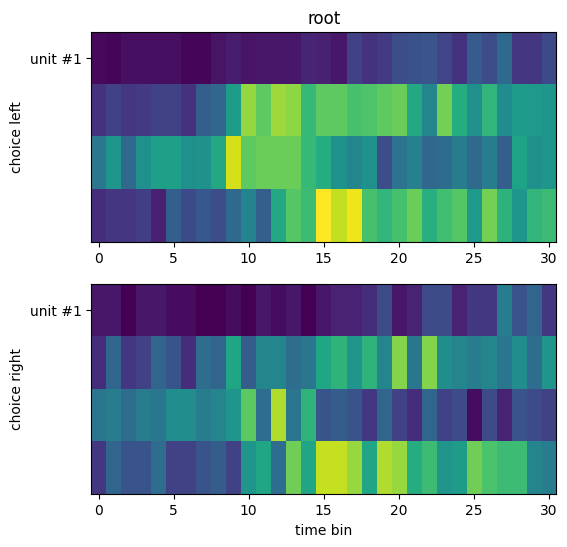

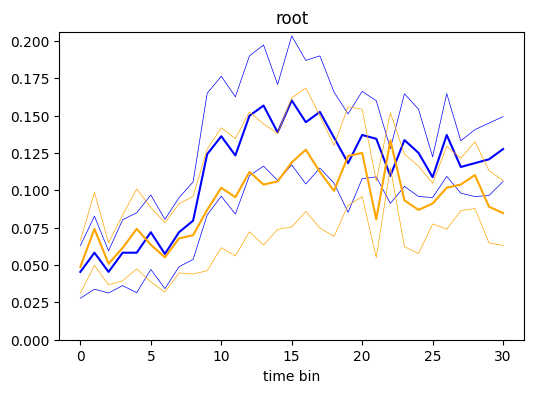

No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent


['SNr' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'MRN' 'root' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'root' 'root' 'POL'
 'POL' 'POL' 'POL' 'POL' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN'
 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN' 'APN'
 'POL' 'POL' 'POL' 'POL' 'POL' 'POL' 'POL' 'POL' 'POL' 'POL' 'POL' 'POL'
 'POL' 'POL' 'POL' 'POL' 'POL' 'POL' 'POL' 'LP' 'LP' 'LP' 'LP' 'LP' 'LP'
 'LP' 'LP' 'LP' 'LP' 'root' 'root' 'root' 'root' 'root' 'DG' 'DG' 'DG'
 'DG' 'DG' 'DG' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1'
 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1'
 'CA1' 'VISp' 'root' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp'
 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp'
 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'VISp' 'root'
 'root' 'MRN' 'MRN' 'MRN' 'APN' 'LP' 'LP' 'CA1' 'CA1' 'root

No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent


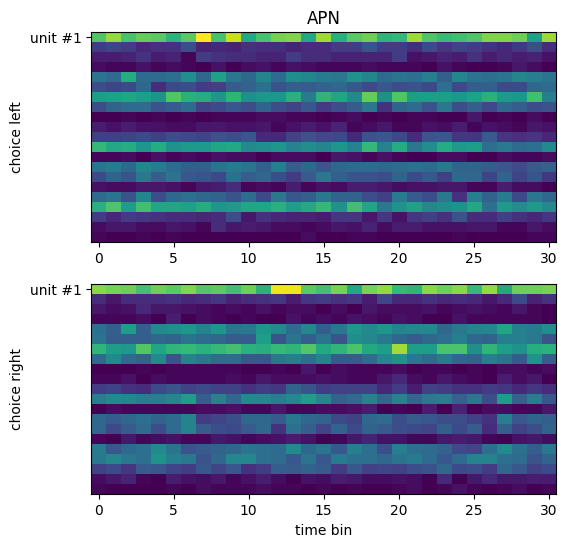

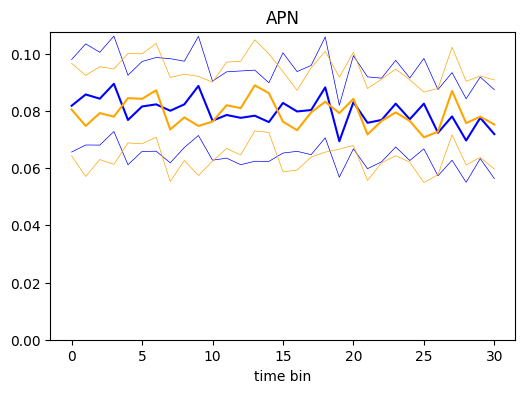

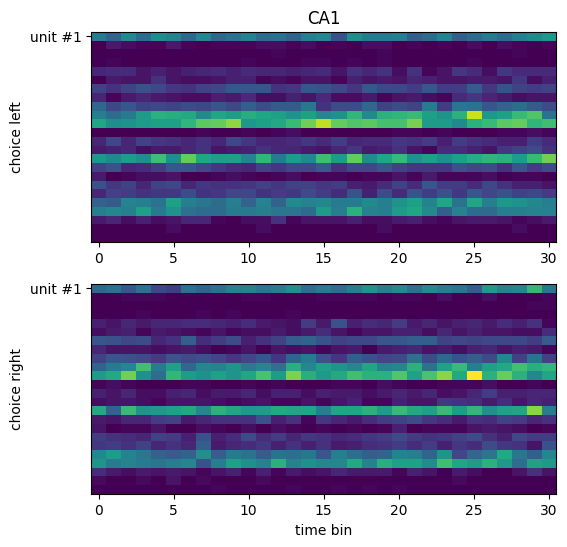

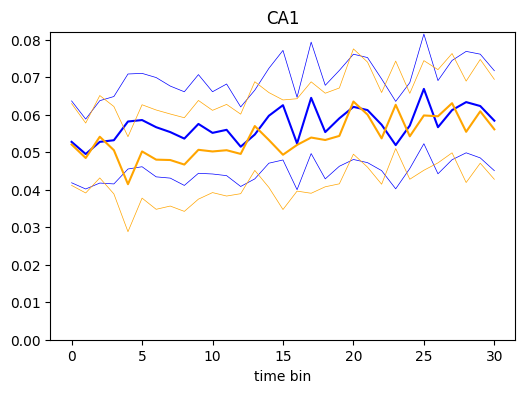

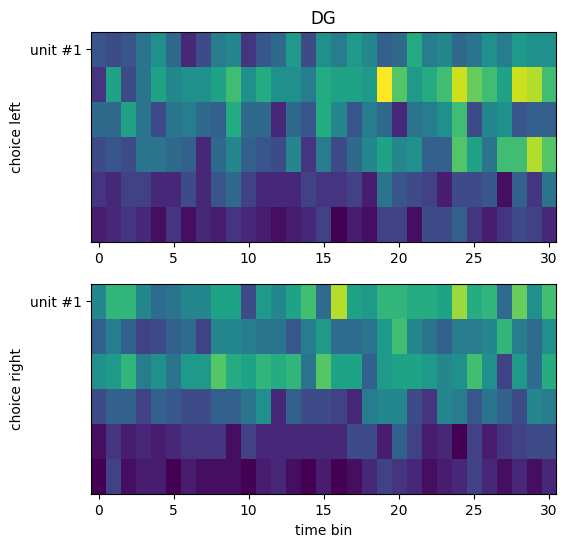

...

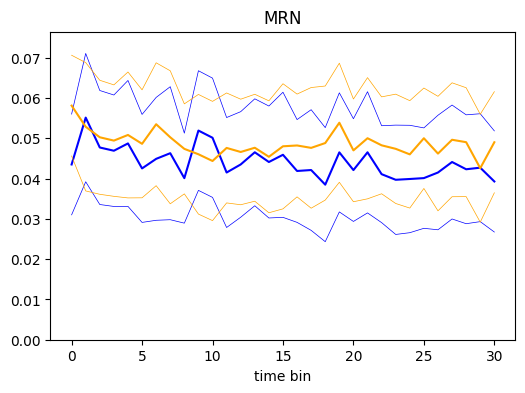

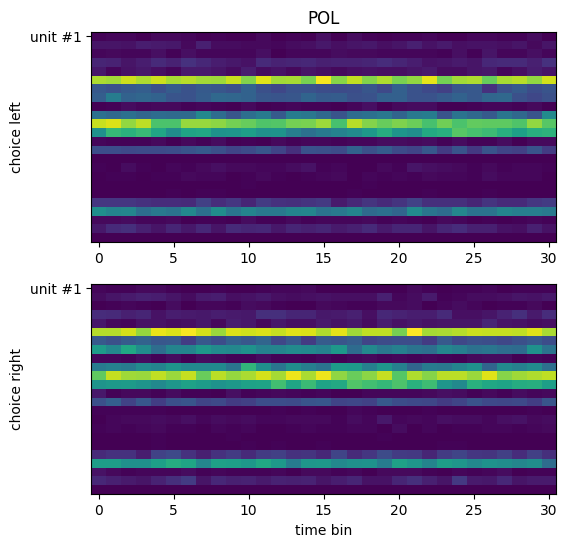

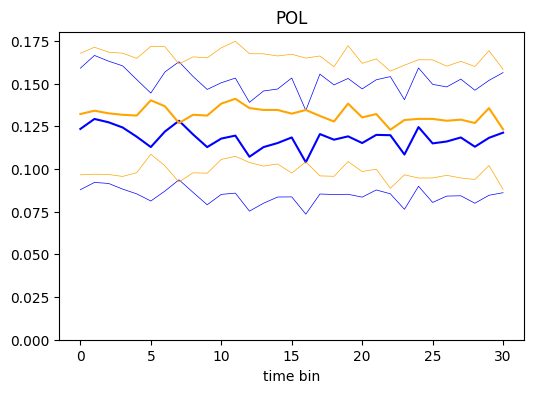

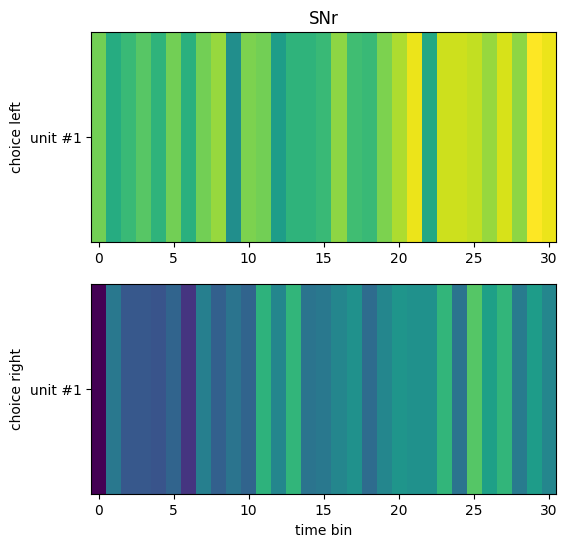

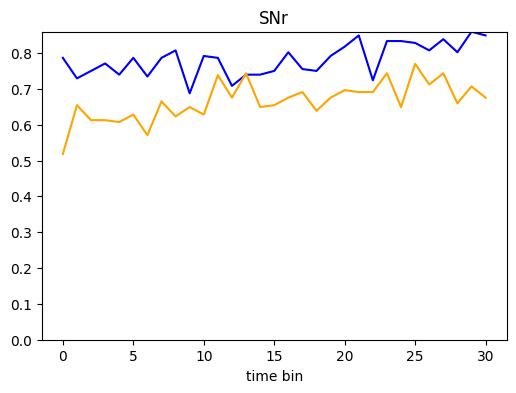

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/brainbox/task/trials.py:196: RuntimeWarning: Mean of empty slice
  mean = np.nanmean(raster, axis=0)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


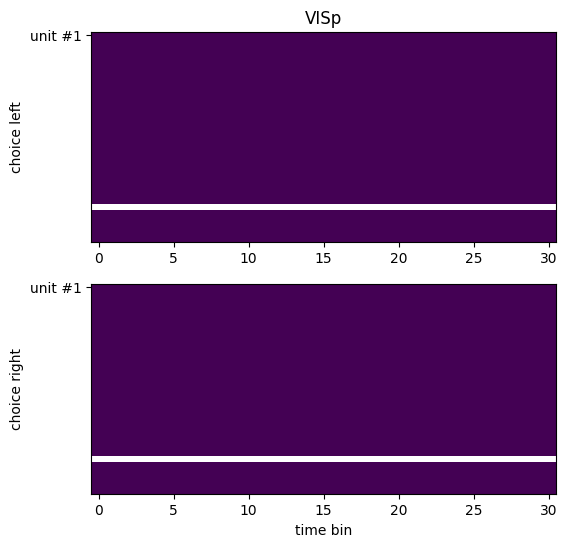

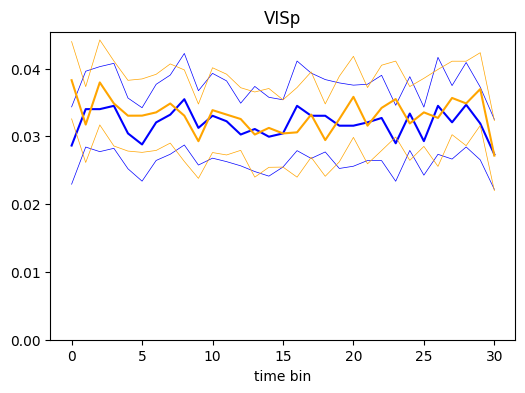

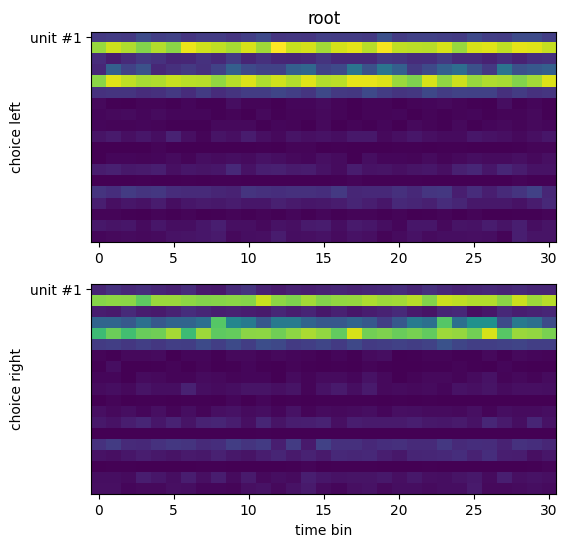

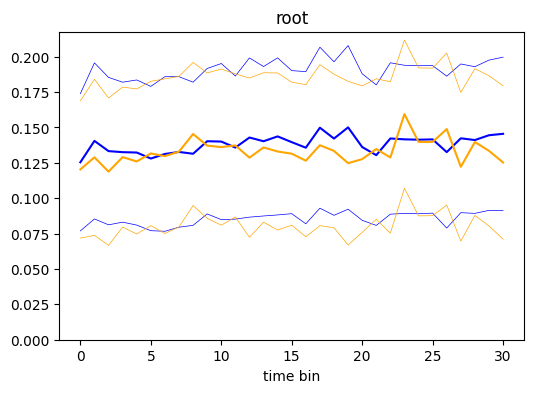

No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent
No default revision for dataset alf/probe00/pykilosort/#2024-03-22#/clusters.amps.npy; using most recent


['RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN'
 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN'
 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'RN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN' 'MRN'
 'MRN' 'MRN' 'MRN' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'root' 'SCm' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm'
 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' 'SCm' '

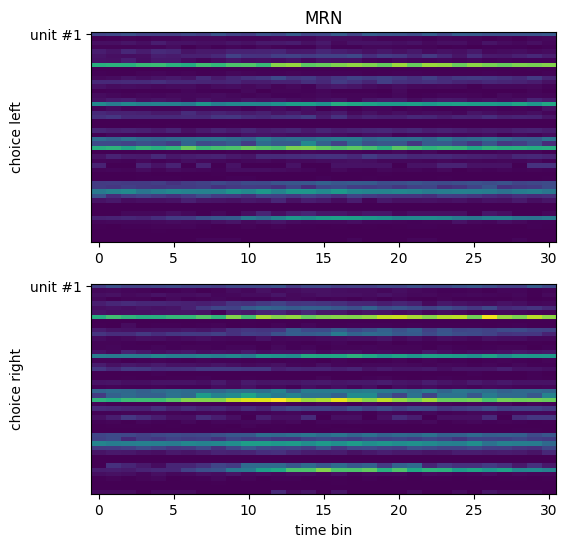

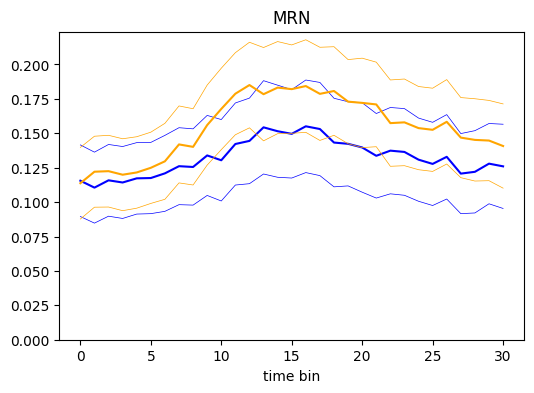

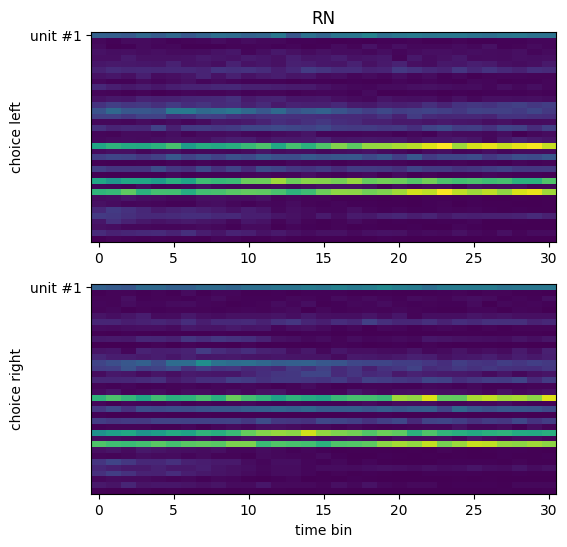

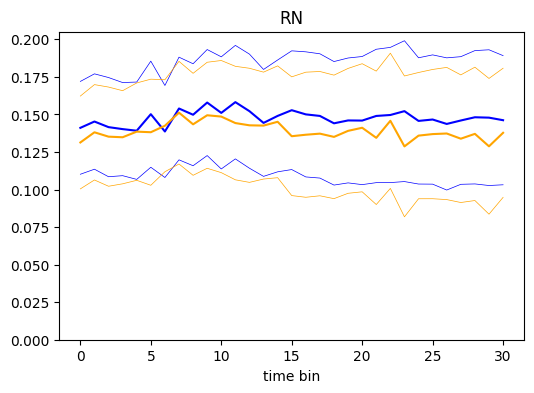

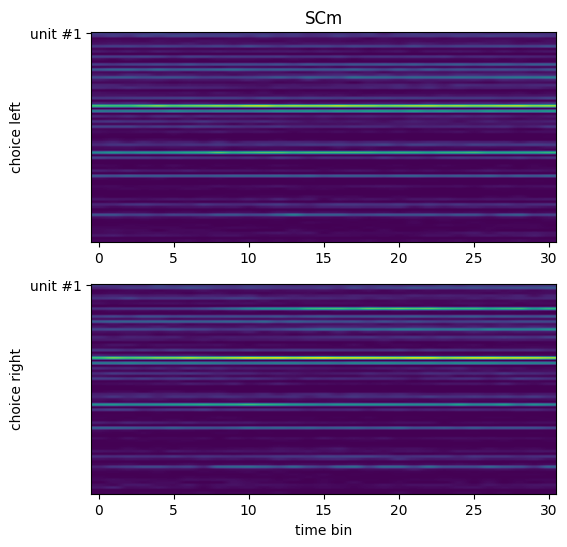

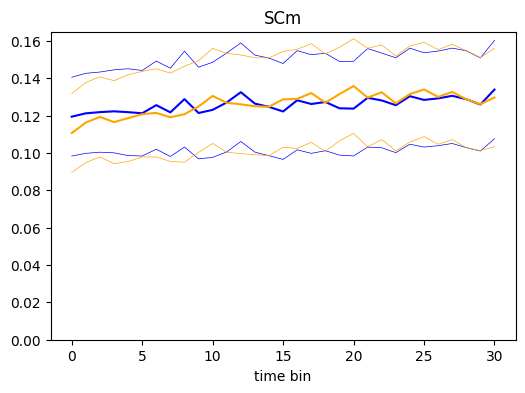

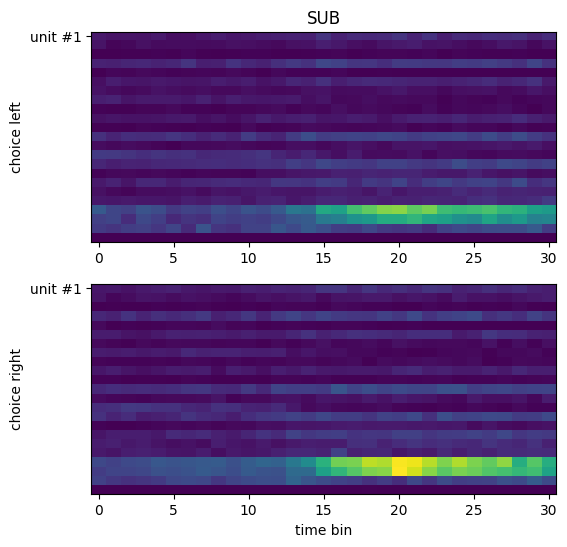

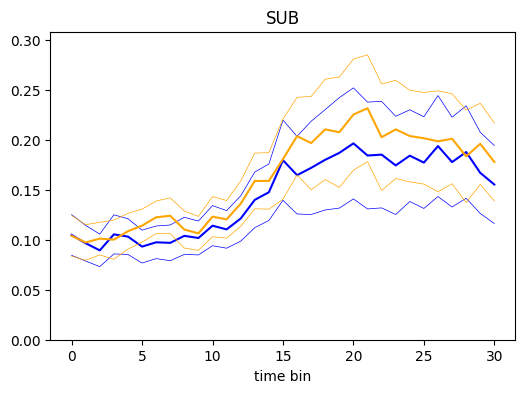

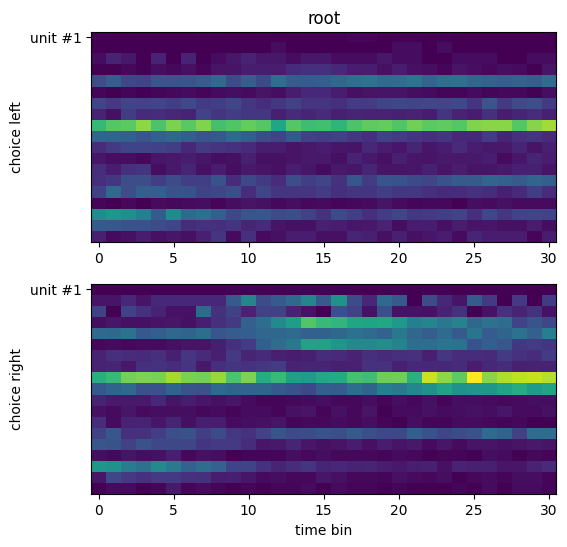

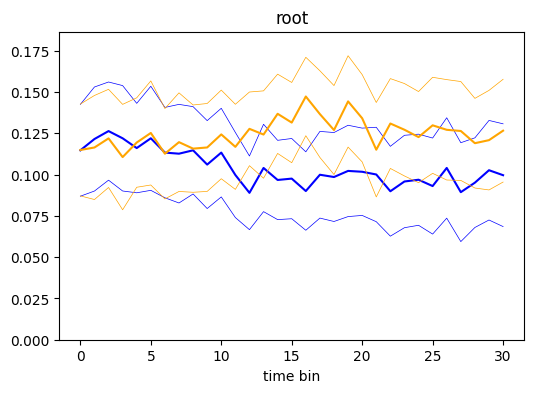

['OT' 'SI' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'ACB'
 'ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'ACB'
 'ACB' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'root' 'root' 'root' 'root' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP']


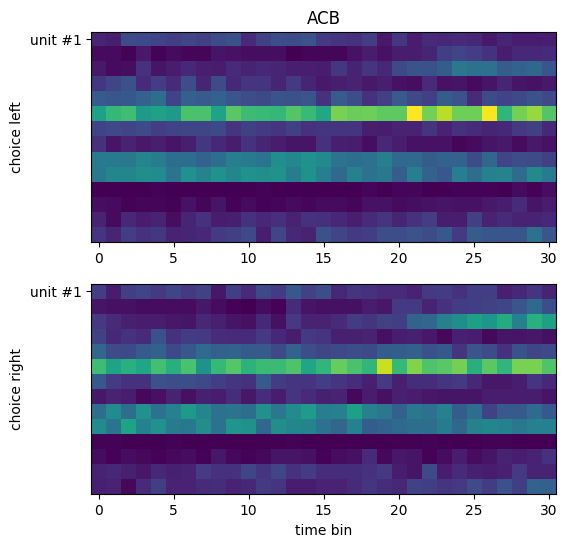

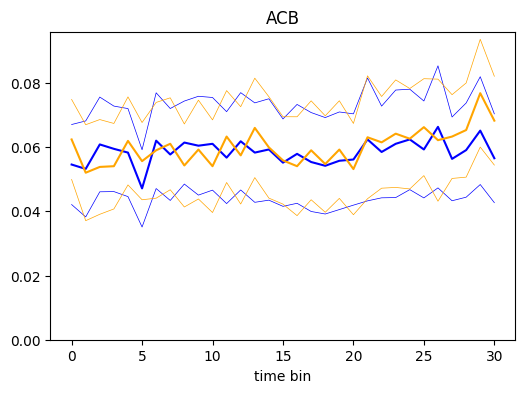

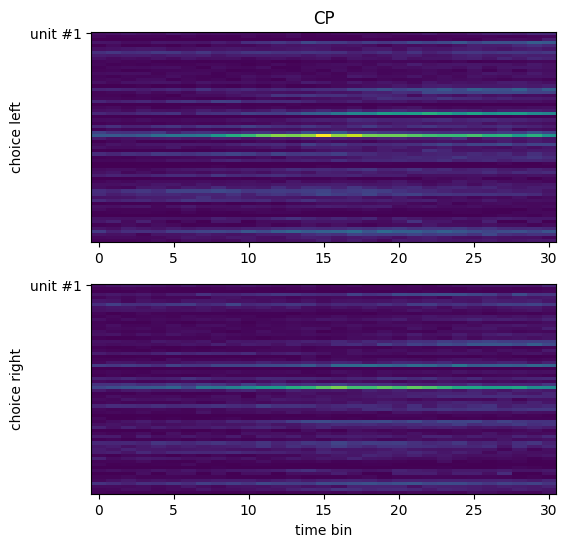

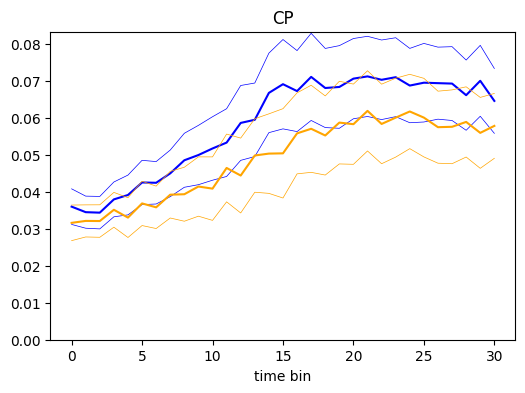

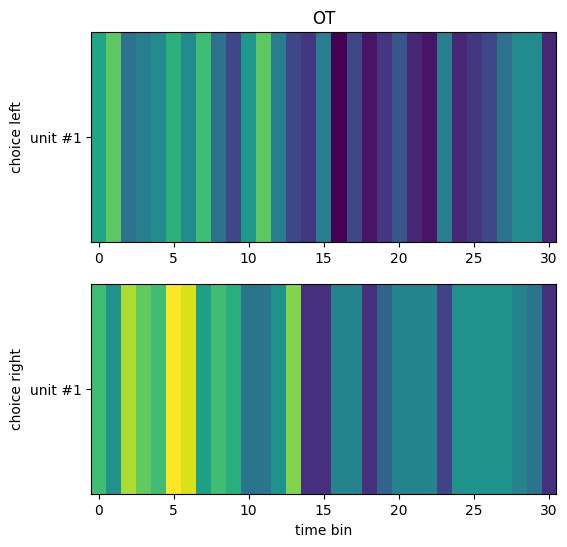

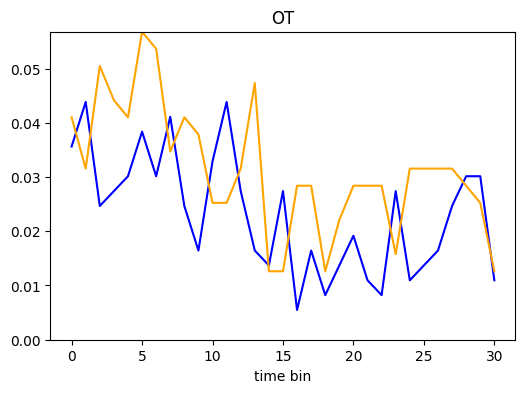

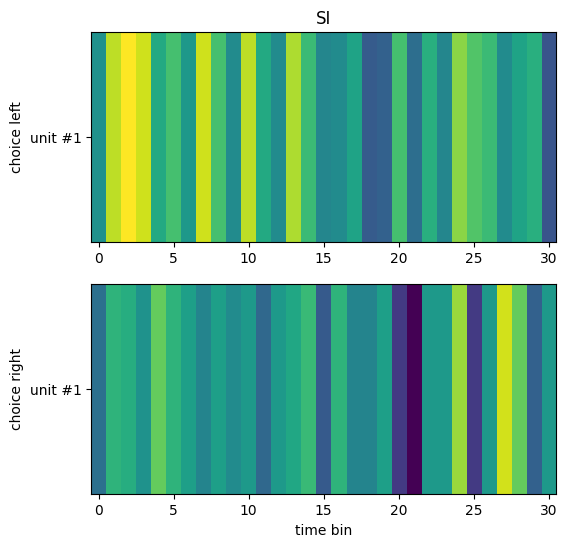

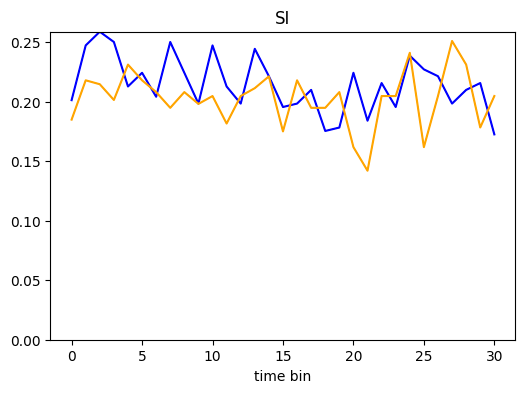

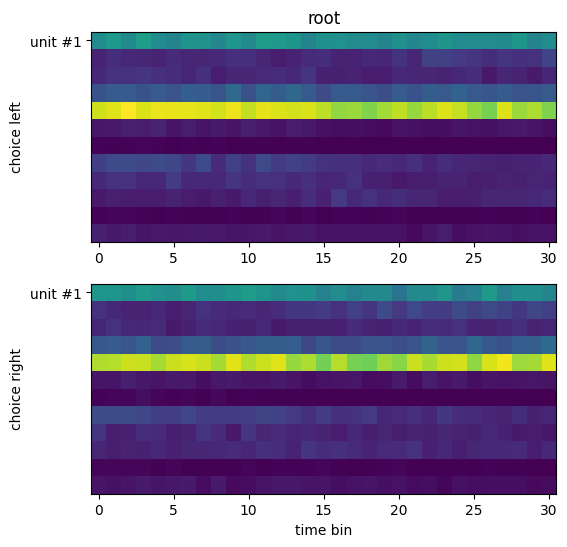

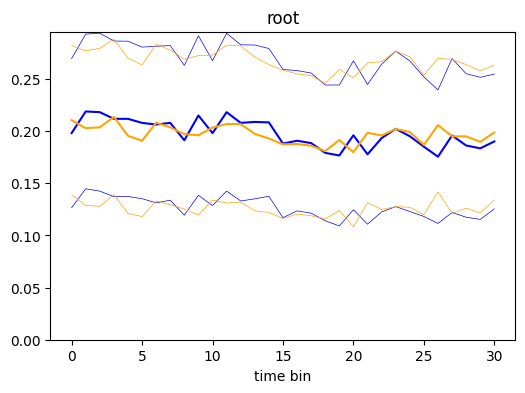

['PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR'
 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR'
 'PIR' 'PIR' 'PIR' 'PIR' 'root' 'PIR' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root'
 'root' 'root' 'root' 'root' 'root' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR'
 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR' 'PIR'
 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl'
 'ORBl' 'AId' 'AId' 'AId' 'AId' 'MOs' 'MOs' 'MOs' 'PIR' 'PIR' 'PIR' 'PIR'
 'PIR' 'PIR' 'root' 'PIR' 'PIR' 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'ORBl' 'MOs'
 'AId']


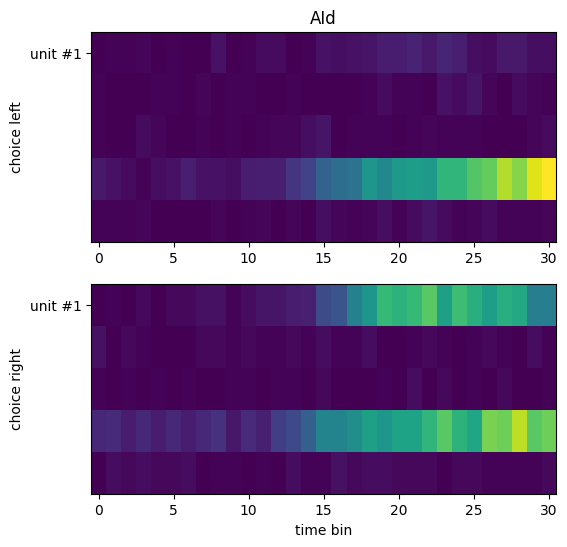

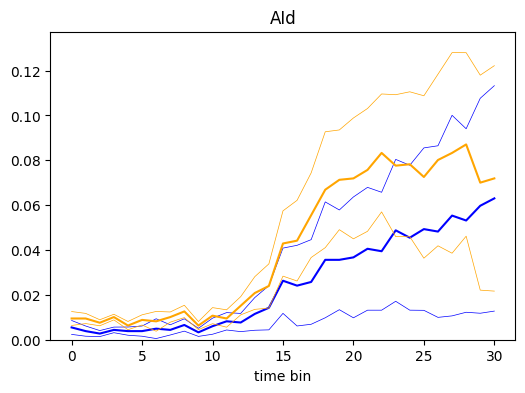

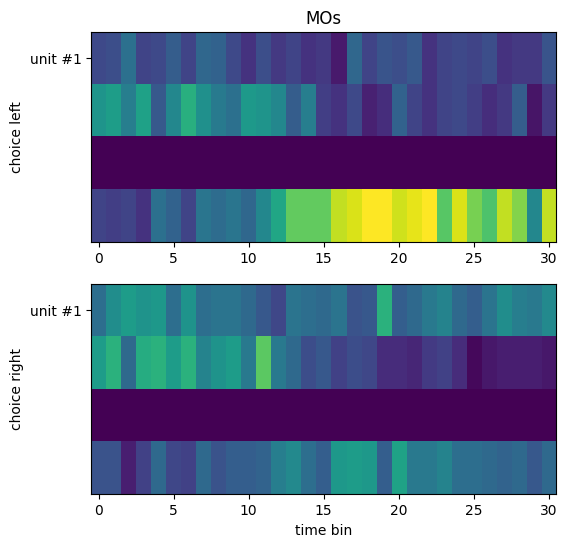

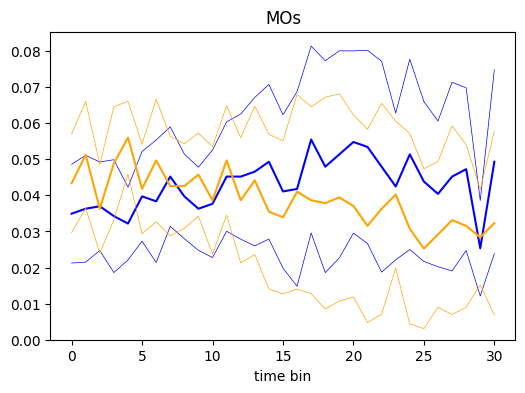

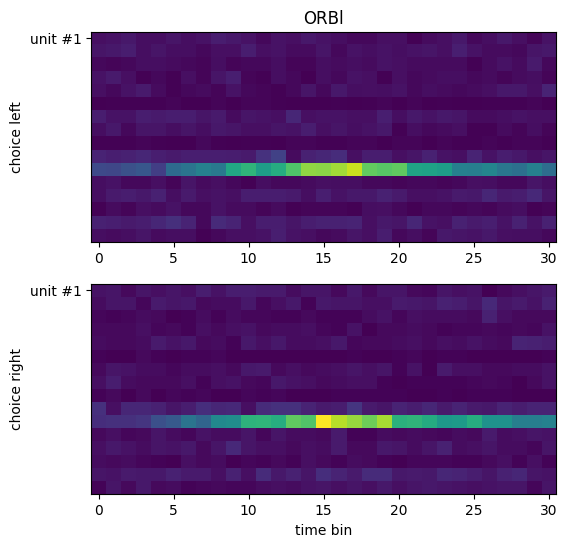

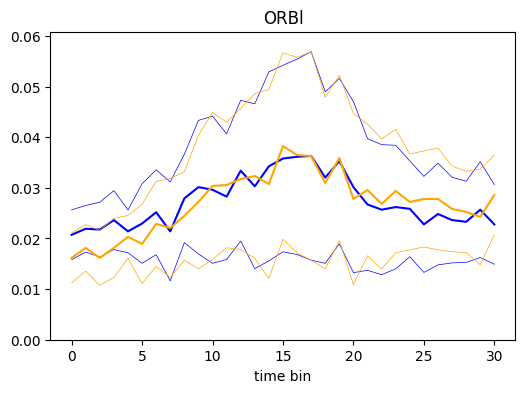

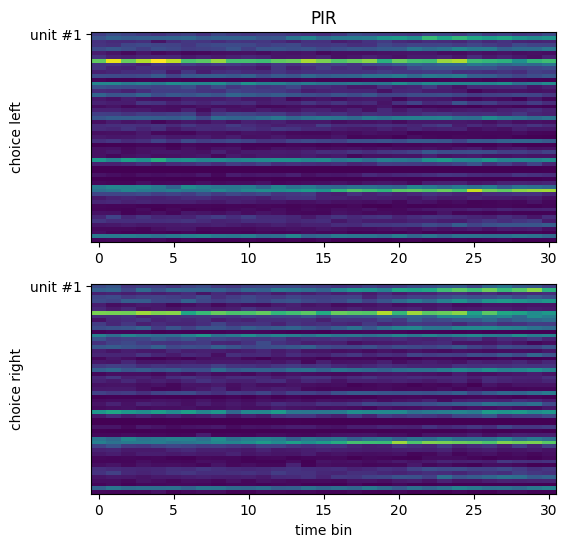

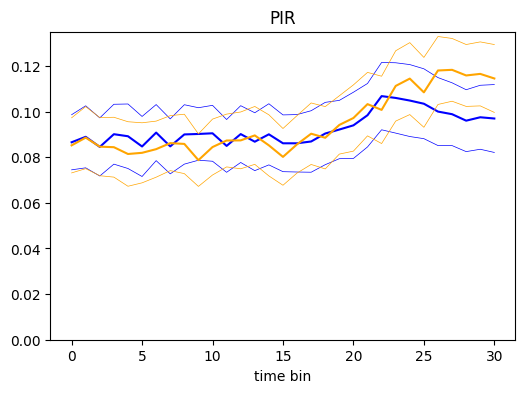

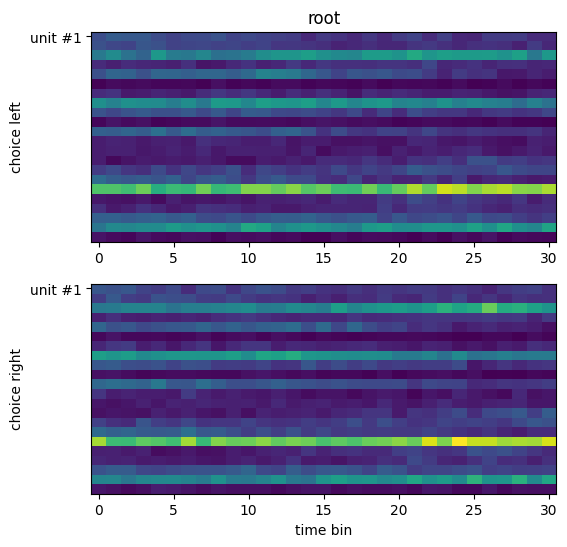

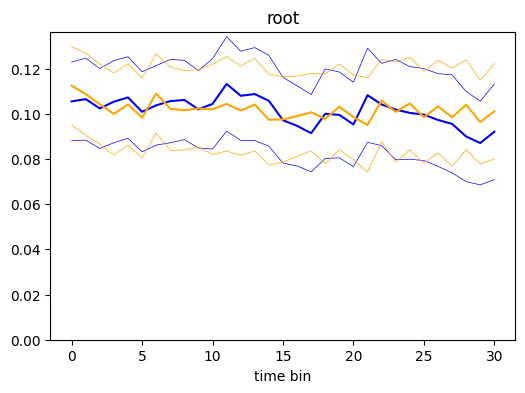

['SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'SMT'
 'SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'SMT' 'root' 'root'
 'root' 'PCN' 'PCN' 'PCN' 'PCN' 'PCN' 'PCN' 'PCN' 'PCN' 'PCN' 'PCN' 'PCN'
 'PCN' 'PCN' 'PCN' 'PCN' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD'
 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD' 'MD'
 'MD' 'MD' 'MD' 'MD' 'MD' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv' 'RSPv'
 'RSPv' 'RSPv' 'RSPv' 'SMT' 'PCN' 'PCN' 'PCN' 'PCN' 'MD' 'MD' 'MD' 'MD'
 'MH' 'RSPv' 'RSPv' 'RSPv' 'MD']


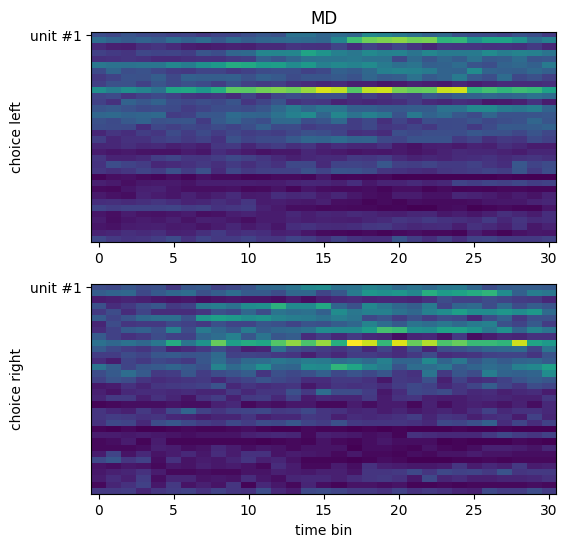

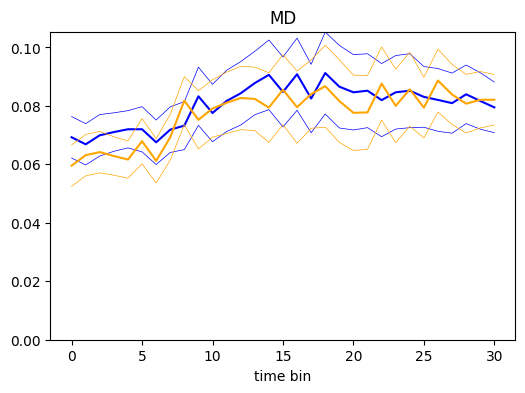

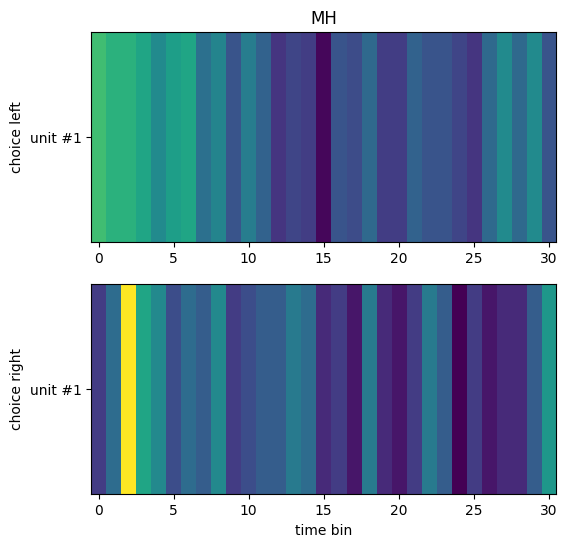

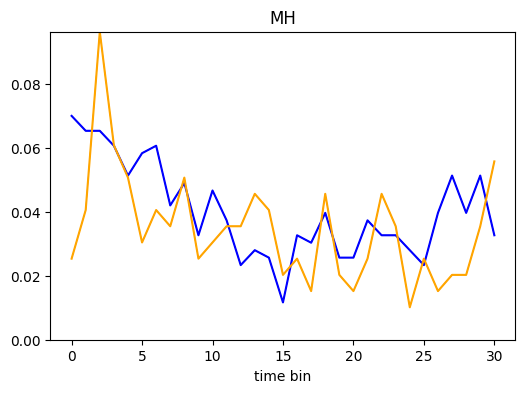

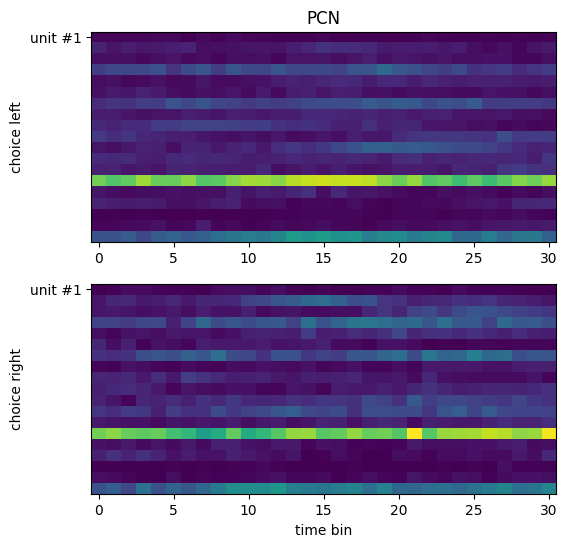

...

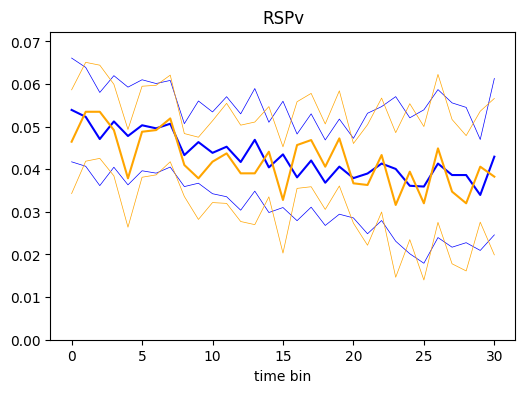

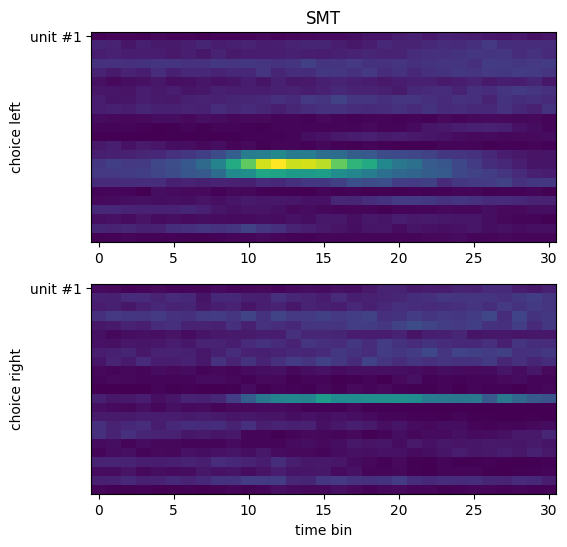

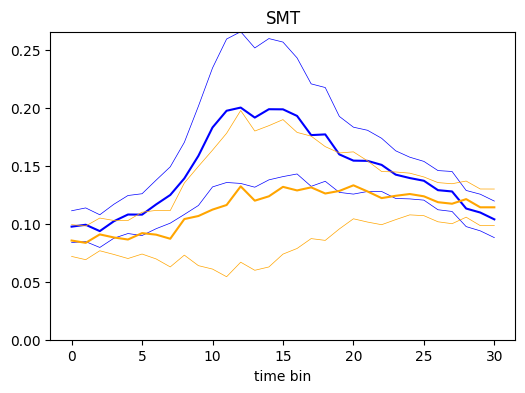

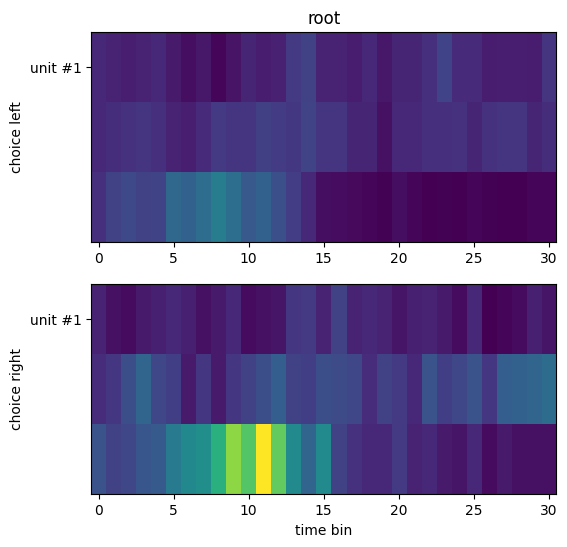

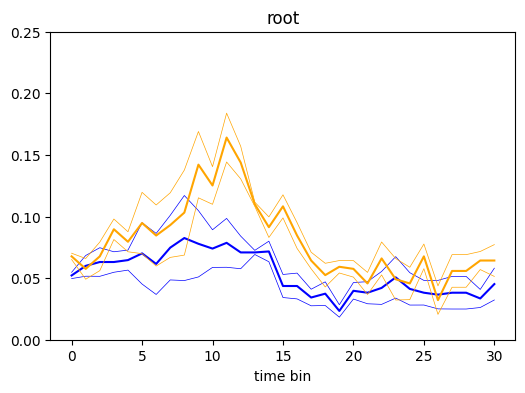

['ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'ACB' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'CP' 'CP' 'root' 'root' 'root' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp'
 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp'
 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp'
 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp'
 'MOp' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP' 'CP'
 'CP' 'CP' 'root' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp'
 'MOp' 'MOp' 'MOp' 'MOp' 'MOp' 'MOp']


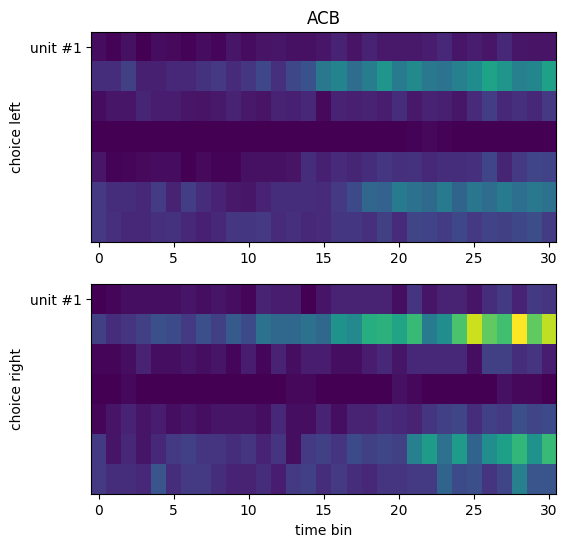

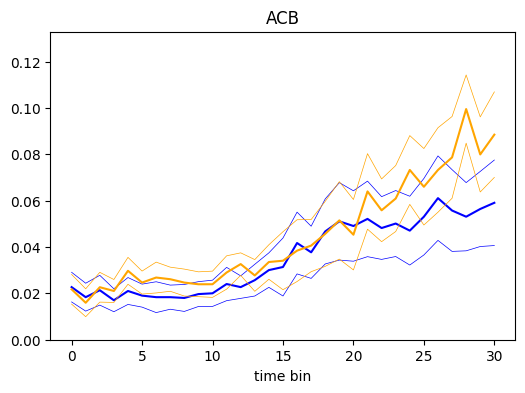

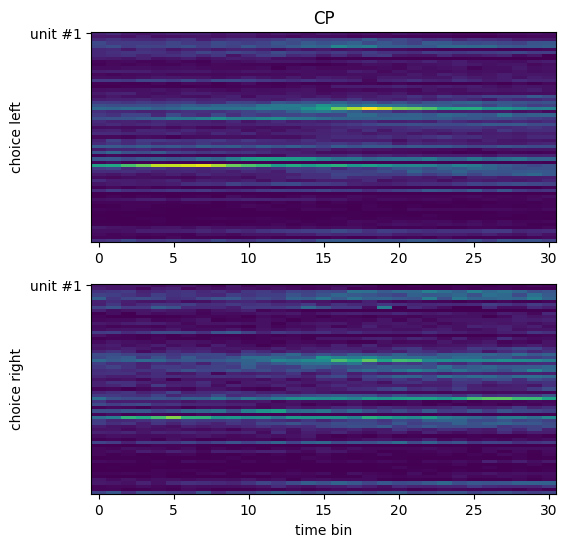

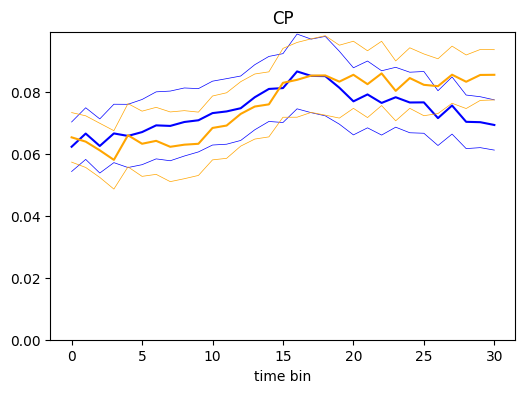

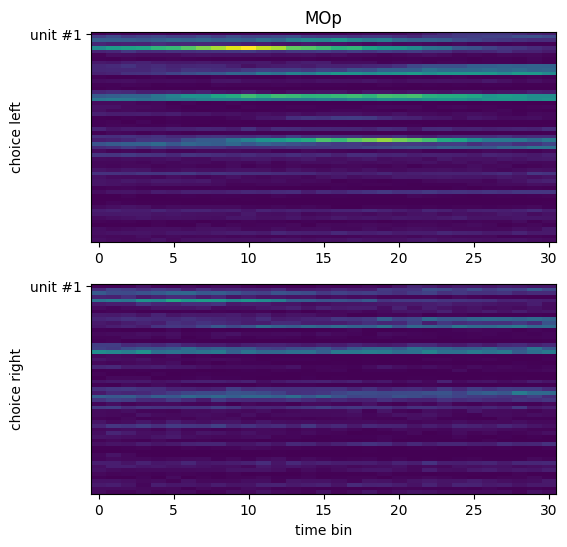

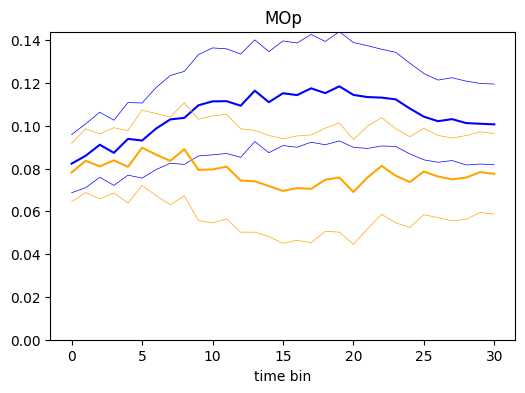

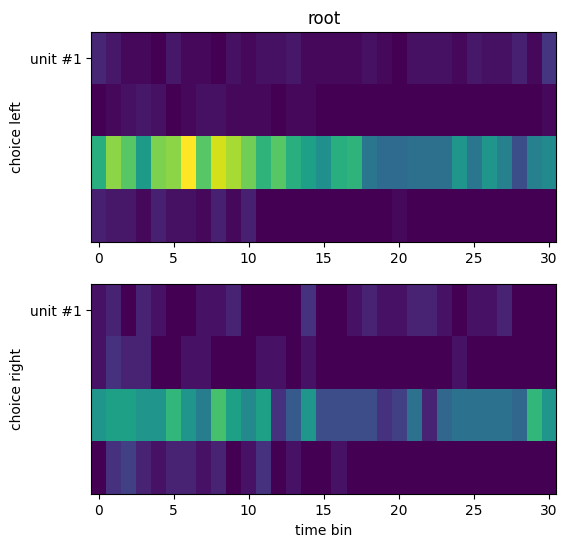

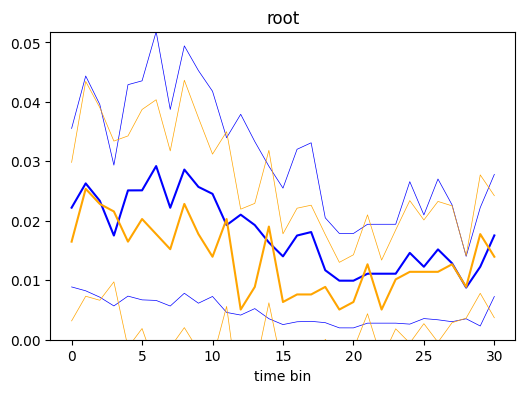

['root' 'MD' 'LH' 'LH' 'LH' 'LH' 'LH' 'LH' 'LH' 'LH' 'CL' 'CL' 'LP' 'LP'
 'LP' 'DG' 'DG' 'DG' 'DG' 'DG' 'DG' 'DG' 'CA1' 'CA1' 'CA1' 'CA1' 'CA1'
 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'root' 'SSp-tr'
 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr'
 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr'
 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr'
 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr' 'MD' 'LH' 'LP' 'root' 'root' 'SSp-tr'
 'SSp-tr' 'SSp-tr' 'SSp-tr' 'SSp-tr']


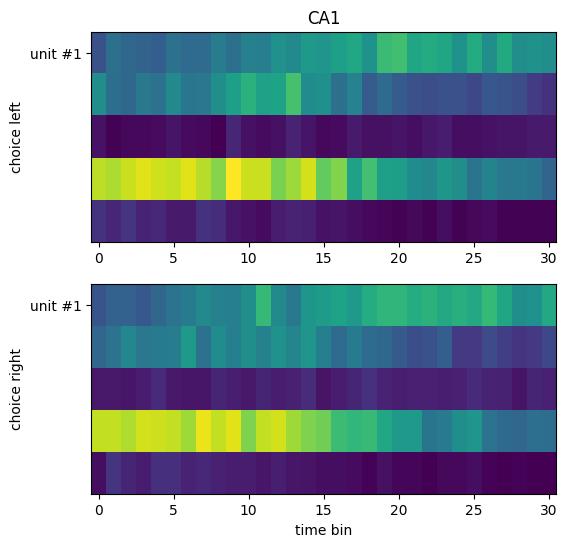

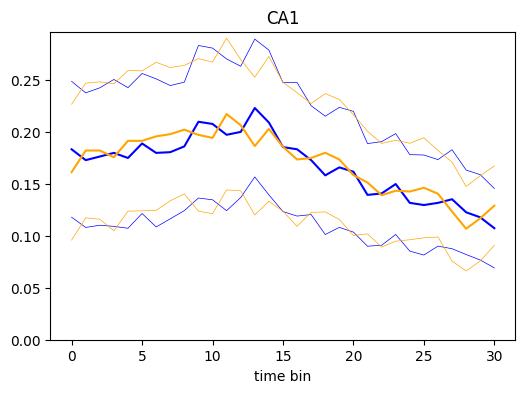

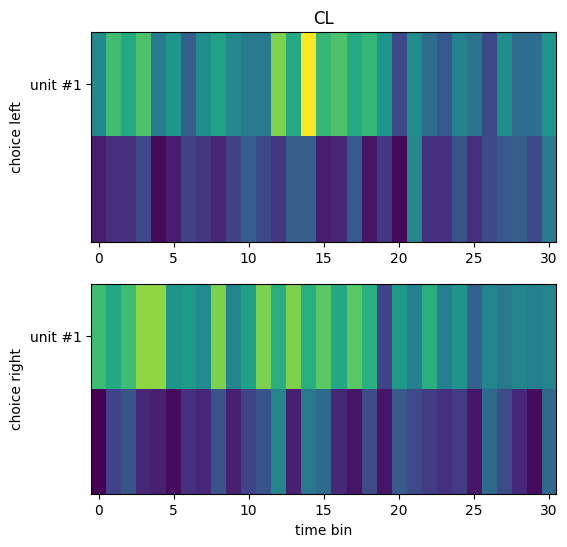

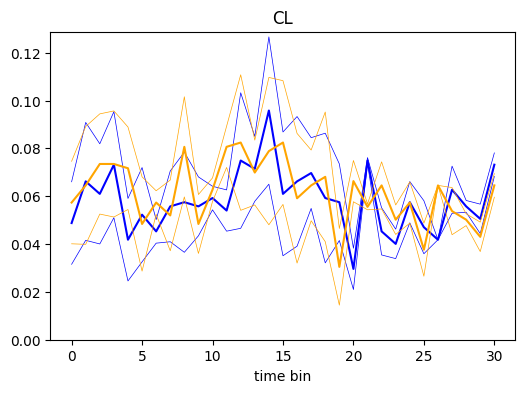

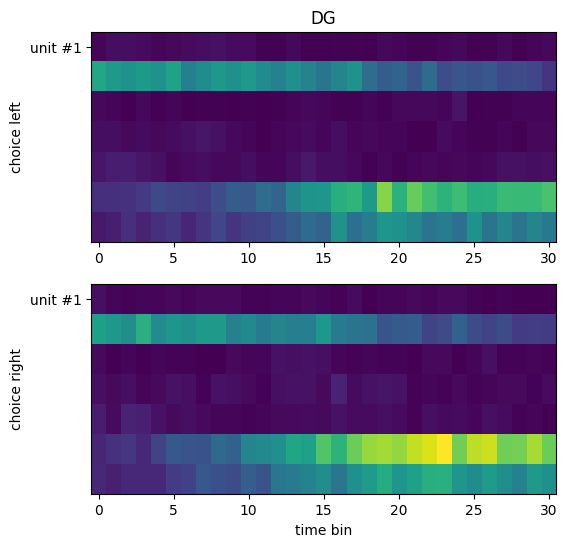

...

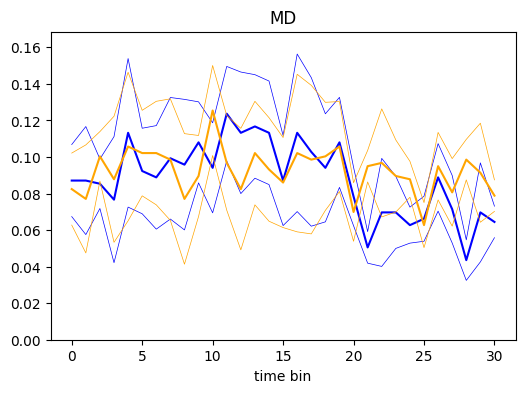

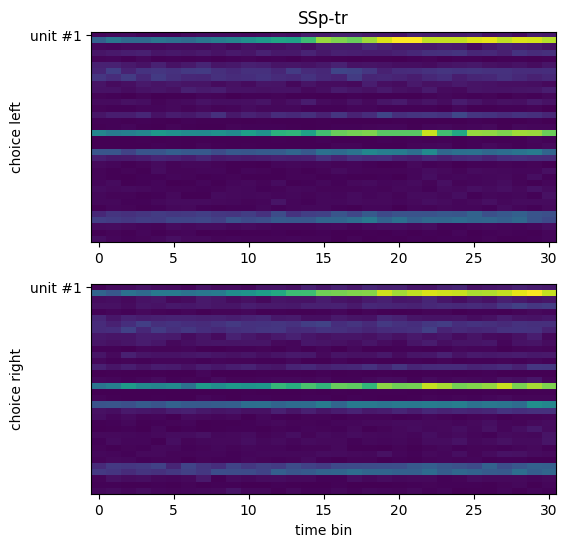

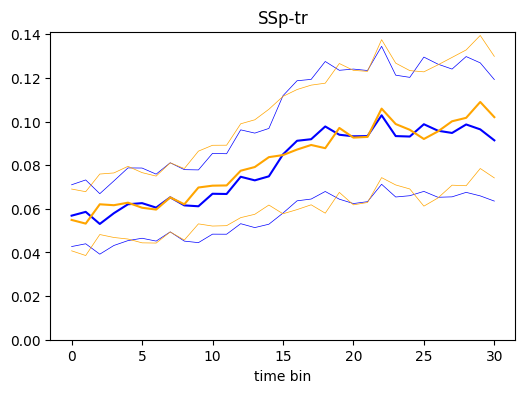

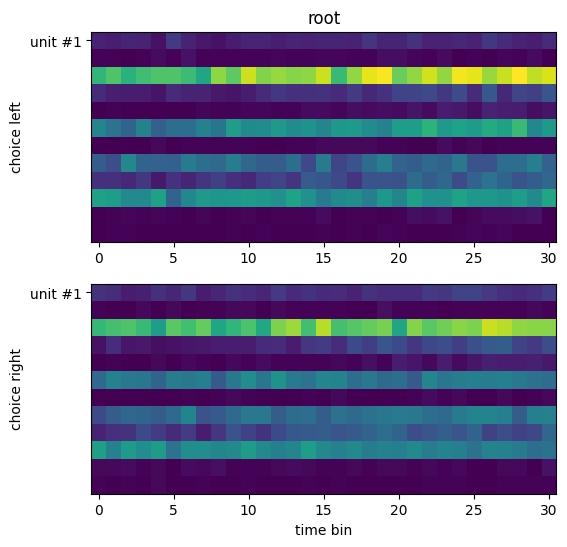

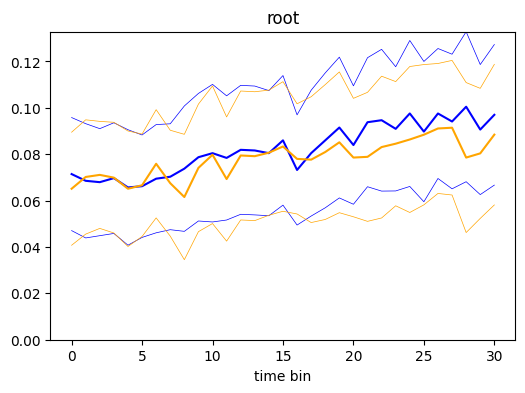

100%|██████████| 3/3.0 [00:02<00:00,  1.24it/s]
100%|██████████| 3/3.0 [00:02<00:00,  1.20it/s]
100%|██████████| 3/3.0 [00:02<00:00,  1.28it/s]
100%|██████████| 3/3.0 [00:02<00:00,  1.29it/s]


['LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd'
 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd'
 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd'
 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd'
 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd'
 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd' 'LGd'
 'LGd']


ValueError: zero-size array to reduction operation minimum which has no identity

In [303]:
# event_types = ['goCueTrigger_times', 'firstMovement_times',  'feedback_times']
event = 'firstMovement_times'
var = 'choice'

# ---------------------------------------------------
# Select your PID
for s, session in enumerate(sessions_to_process):
    # ---------------------------------------------------
    # Convert each session EID to probe PID and probe name
    [pids, pname] = one.eid2pid(session)
    for p, pid in enumerate(pids):
        # pid = '3675290c-8134-4598-b924-83edb7940269'
        # plot_pid_areas(pid, one, event, var, var_name)
        # ---------------------------------------------------
        
        
        # Convert probe PID to session EID and probe name
        [eid, pname] = one.pid2eid(pid)

        # ---------------------------------------------------
        # Load spike data
        ssl = SpikeSortingLoader(pid=pid, one=one, atlas=ba)
        spikes, clusters, channels = ssl.load_spike_sorting()
        clusters = ssl.merge_clusters(spikes, clusters, channels)

        # ---------------------------------------------------
        # Restrict to only good clusters
        # Find the good cluster index:
        good_cluster_idx = clusters['label'] == 1
        good_cluster_IDs = clusters['cluster_id'][good_cluster_idx]
        # Filter the clusters accordingly:
        clusters_g = {key: val[good_cluster_idx] for key, val in clusters.items()}
        # Filter the spikes accordingly:
        good_spk_indx = np.where(np.isin(spikes['clusters'], good_cluster_IDs))
        spikes_g = {key: val[good_spk_indx] for key, val in spikes.items()}

        # ---------------------------------------------------
        # Select units in a given brain region

        # Remap the channel acronyms to the Beryl brain region parcellation (which is a higher order)
        region_acr_ch = ba.regions.id2acronym(channels['atlas_id'], mapping='Beryl')
        cluster_g_acr = region_acr_ch[clusters_g['channels']]
        # Print each unit's brain region label
        print(cluster_g_acr)

        events, indx_a, indx_b = get_trial_data(eid, one, event, var)

        for area in np.unique(cluster_g_acr):

            # Take the index of units in SCm
            indx_scm = np.where(cluster_g_acr ==area)[0]
            cluster_IDs = good_cluster_IDs[indx_scm]
            nunit = len(cluster_IDs)

            # ---------------------------------------------------
            # Create PSTHs
            binsize = 0.01  # bin size [sec] for neural binning
            time_window = [-0.150, 0.150]

            for count, clu_id in enumerate(cluster_IDs):

                # Find spikes for this cluster
                spk_indx = np.where(np.isin(spikes_g['clusters'], clu_id))
                spikes_unit = {key: val[spk_indx] for key, val in spikes_g.items()}

                if len(spikes_unit) > 0:
                    # Compute raster
                    raster, timestamps = get_event_aligned_raster(spikes_unit['times'], events, tbin=binsize, values=None,
                                                                epoch=time_window, bin=True)
                    # Compute PSTH (return only the mean)
                    psth_a, _ = get_psth(raster, trial_ids=indx_a)
                    psth_b, _ = get_psth(raster, trial_ids=indx_b)

                    # ------- Stack PSTHs -------
                    # Init ; Here we create a M = n condition x n unit x n time bin and will concatenate it later
                    if count == 0:
                        nbin = len(timestamps)
                        stack_psth = np.empty((2, nunit, nbin))

                    stack_psth[0, count, :] = psth_a
                    stack_psth[1, count, :] = psth_b

            plot_psths(stack_psth, area, var)
            plot_psth_lines(stack_psth, area, var)

In [301]:
spikes_unit

{'amps': array([], dtype=float64),
 'clusters': array([], dtype=int64),
 'depths': array([], dtype=float64),
 'times': array([], dtype=float64)}